# AMR_dataset - Resnet50 - Normalise dataset for better white accuracy

In [8]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import matplotlib
import numpy as np
from torchsummary import summary
import torchinfo
import json
from torchvision.models.segmentation import fcn
import glob
#from PIL import Image
import time
from torch.utils.data import DataLoader
import airsim 
from csv import reader
import PIL.Image
import cv2 as cv

from torch.utils.tensorboard import SummaryWriter

In [9]:
#device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device = torch.device("cuda:0")
print("Device chosen GPU:", torch.cuda.get_device_name(device))

# Parameters
num_classes = 5

# Hyper parameters
num_epochs = 50
batch_size = 2
learning_rate = 0.0001
beta1 = 0.9
beta2 = 0.999
log_directory = f"runs/AMR_dataset/resnet50/v0.0.1 Adam lr = {learning_rate}, epochs = {num_epochs}, batchsize ={batch_size}"
writer  = SummaryWriter(log_directory)

Device chosen GPU: NVIDIA TITAN RTX


dataset_images:  torch.Size([106, 3, 718, 1278])
dataset_targets: torch.Size([106, 718, 1278])
shape torch.Size([3, 718, 1278])
shape after (720, 1280, 3)


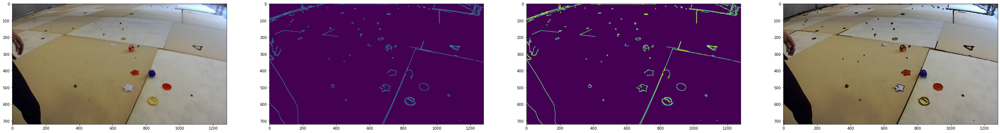

In [10]:
torch.cuda.empty_cache()
transform = transforms.Compose(
    [
        transforms.ToTensor(),
        transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
    ]
)

# def pil_to_np(img):
#     return np.array(img) 

# The Cityscapes dataset is avaliable in PyTorch
# train_dataset = torchvision.datasets.Cityscapes(root='./cityscapesDataset', split='train', mode='fine', target_type='semantic', transform=transform, target_transform=pil_to_np)
# #test_dataset  = torchvision.datasets.Cityscapes(root='./cityscapesDataset', split='test',  mode='fine', target_type='semantic', transform=pil_to_tensor, target_transform=transforms.ToTensor())
# val_dataset   = torchvision.datasets.Cityscapes(root='./cityscapesDataset', split='val',   mode='fine', target_type='semantic', transform=transform, target_transform=pil_to_np)

# DATA_DIRECTORY = "AirSimDataset/"
# airSimDataset = np.load(DATA_DIRECTORY)
# print(airSimDataset)

with open('AMR_dataset/filtered_dataset.csv', 'r') as read_obj: # https://thispointer.com/python-read-csv-into-a-list-of-lists-or-tuples-or-dictionaries-import-csv-to-list/
    # pass the file object to reader() to get the reader object
    csv_reader = reader(read_obj)
    # Pass reader object to list() to get a list of lists
    list_of_rows = np.array(list(csv_reader))
    #print('Shape of both:', list_of_rows.shape)
    file_list_images  = list_of_rows[1:,0]
    file_list_targets = list_of_rows[1:,1]
    #print('Path:', file_list_images)


# Help with glob from https://stackoverflow.com/questions/39195113/how-to-load-multiple-images-in-a-numpy-array
#file_list_images  = sorted(glob.glob('AirSimDataset4/img_rgbd_camera_0_*.png'))
#file_list_targets = sorted(glob.glob('AirSimDataset4/img_rgbd_camera_5_*.png'))
#print('')
dataset_images  = np.array([np.array(transform(np.array(PIL.Image.open(filename).convert('RGB')))) for filename in file_list_images])#.permute(0,3,1,2)
#print('dataset_images.shape:', dataset_images.shape)
dataset_targets = np.array([np.array(PIL.Image.open(filename))[:,:,0] for filename in file_list_targets])#.permute(0,3,1,2)
# dataset_images  = torch.tensor([np.array(Image.open(filename)) for filename in file_list_images], device=device)
# dataset_targets = torch.tensor([np.array(Image.open(filename)) for filename in file_list_targets], device=device)

# print("Images  shape:", dataset_images.shape)
# print("Targets shape:", dataset_targets.shape)
#print('dataset_images.shape BEFORE:', dataset_images.shape)
#dataset_images  = torch.tensor(dataset_images[:,1:-1,1:-1,:], device=device).permute(0,3,1,2) # [:,1:-1,1:-1,0:3] ignores edge pixels on all sides of the image, and 0:3 ignores the alpha value
dataset_images  = torch.tensor(dataset_images[:,:,1:-1,1:-1], device=device)#.permute(0,3,1,2) # [:,1:-1,1:-1,0:3] ignores edge pixels on all sides of the image, and 0:3 ignores the alpha value
#print('dataset_images.shape AFTER :', dataset_images.shape)
dataset_targets = torch.tensor(dataset_targets[:,1:-1,1:-1], device=device)
with torch.no_grad():
    #dataset_images = [transform(img) for img in dataset_images]

    # From 3 channel RGB targets into 1

    ## CPU
    # start0 = time.perf_counter()
    # targets = np.zeros(targets_RGB.shape[:3])
    # class_colors = [
    #     #np.array([0, 0, 0]),   # new_targets are already zero
    #     np.array([81, 38, 0]),  # Toilet
    #     np.array([41, 36, 132]) # Chair
    # ]

    # for i, class_color in enumerate(class_colors):                  # For every class/colour 
    #     indice = np.where(np.all(targets_RGB == class_color, axis=-1))   # Where the current RGB value corresponds with hte pixel in the last axis
    #     targets[indice] = i+1        # Use that pixel index to define class number from enumerate. The +1 is due to 0 being background
    # print(f"time0: {time.perf_counter() - start0}")

    ## GPU
    #start = time.perf_counter()

    #     #color0 = torch.tensor([0, 0, 0], device=device)
    #     color1 = torch.tensor([81, 38, 0], device=device)
    #     color2 = torch.tensor([41, 36, 132], device=device)
    #     color_map = [color1, color2]

    #     torch_targets_RGB = torch.tensor(targets_RGB, device=device)
    #     # Create target on the gpu
    #     targets = torch.zeros(targets_RGB.shape[:3], device=device)
    #     # convert to torch tensor and put it on gpu
    #     #mid = time.perf_counter()
    #     #print(f"time gpu moving: {mid - start}")
    #     for i, c in enumerate(color_map):
    #         # find all pixel equal to the color
    #         indices = torch.where(torch.all(torch_targets_RGB == c, dim=-1))
    #         # set class
    #         targets[indices] = i + 1
    #     #print(f"time: {time.perf_counter() - mid}")

    #     #targets = torch.unsqueeze(targets, dim=-1)
    #     images = torch.tensor(images, device=device).permute(0,3,1,2) # Permutes from [84, 720, 1280, 3] to [84, 3, 720, 1280], as that's how PyTorch likes it

    # Pairing the images with the labels - train to test ratio of 5 to 1

    num_test = int(len(dataset_targets)/5) # will return 1/5 integer of the total sample size   
    # train_data = (images[num_test:len(targets)], targets[num_test:len(targets)])
    # test_data = (images[:num_test], targets[:num_test])
    train_data = [(img, t) for img, t in zip(dataset_images[num_test:len(dataset_targets)], dataset_targets[num_test:len(dataset_targets)])]
    test_data  = [(img, t) for img, t in zip(dataset_images[:num_test], dataset_targets[:num_test])]


    # train_data = train_data[:,:,:,:3]
    # test_data  = test_data[:,:,:,:1]

    # Dataloaders used to batch the paired images
    #train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)
    #test_loader = DataLoader(test_data, batch_size=batch_size, shuffle=False)


    # Splitting the training and testing datasets into smaller batches
    # workers = 5
    train_loader = torch.utils.data.DataLoader(dataset=train_data, batch_size=batch_size, shuffle=True)#,  num_workers=workers)#, pin_memory=True))
    test_loader  = torch.utils.data.DataLoader(dataset=test_data,  batch_size=batch_size, shuffle=False)#, num_workers=workers)#, pin_memory=True))
    #val_loader   = torch.utils.data.DataLoader(dataset=test_data,  batch_size=batch_size, shuffle=False)#, num_workers=workers)#, pin_memory=True))

    #print('Train Size: ', len(train_dataset))
    #print('Test Size : ', len(test_dataset))
    #print('Val Size  : ', len(val_dataset))

    # print('train_data', train_data.shape)
    # print('dataset_targets', dataset_targets.shape)

    print('dataset_images: ', dataset_images.shape)
    print('dataset_targets:', dataset_targets.shape)

    '''Plot from dataset'''
    # fig, ax = plt.subplots(nrows=2,ncols=2, figsize=(24, 16))
    # ax[0][0].imshow(dataset_images[0])
    # ax[0][1].imshow(dataset_targets[0])
    # ax[1][0].imshow(dataset_images[83])
    # ax[1][1].imshow(dataset_targets[83])

    '''Plot from dataset'''
    # fig, ax = plt.subplots(nrows=2,ncols=2, figsize=(24, 16))
    # ax[0][0].imshow(dataset_images[0].to('cpu').permute(1,2,0))
    # ax[0][1].imshow(dataset_targets[0].to('cpu'))
    # ax[1][0].imshow(dataset_images[83].to('cpu').permute(1,2,0)) #.permute(1,2,0)
    # ax[1][1].imshow(dataset_targets[83].to('cpu'))

    #'''Plot from dataloader''';
    # plot_img, plot_target = iter(train_loader).next()
    # plot_img = plot_img[0]
    # plot_target = plot_target[0]
    # fig, ax = plt.subplots(ncols=2, figsize=(24, 16))
    # ax[0].imshow(np.array(plot_img.to('cpu')).transpose(1,2,0)) # transpose(1,2,0) changes the order of the dimensions
    # ax[1].imshow(np.array(plot_target.to('cpu')))

    print('shape', dataset_images[0].shape)
    #image = np.uint8(dataset_images[0].to('cpu').numpy().transpose(1,2,0))
    image = np.array(PIL.Image.open(file_list_images[0]).convert('RGB'))
    print('shape after', image.shape)
    grey = cv.cvtColor(image, cv.COLOR_RGB2GRAY)
    line = cv.Canny(grey ,50,180,apertureSize = 3)
    kernel = np.ones((2,2), np.uint8)
    line_dilated = cv.dilate(line, kernel)
    outline_coords = np.where(line_dilated > 0)
    image_outlined = image.copy()
    image_outlined[outline_coords] = 2
    fig, ax = plt.subplots(ncols=4, nrows=1, figsize=(48, 32))
    ax[0].imshow(image)
    ax[1].imshow(line)
    ax[2].imshow(line_dilated) # .convert('RGB')
    ax[3].imshow(image_outlined)

(array([[  0.,   0.,  12., ..., 153., 184.,   1.],
        [ 10.,   6.,  77., ..., 117., 140.,   0.],
        [  1.,   9.,  36., ...,  96., 134.,   0.],
        ...,
        [ 80.,   3.,   8., ...,   0.,   0.,   0.],
        [ 79.,   5.,   5., ...,   0.,   0.,   0.],
        [ 77.,   5.,   9., ...,   0.,   0.,   0.]]),
 array([  0. ,  25.5,  51. ,  76.5, 102. , 127.5, 153. , 178.5, 204. ,
        229.5, 255. ]),
 <a list of 718 BarContainer objects>)

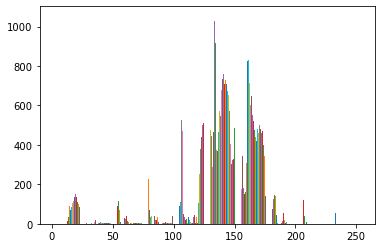

In [ ]:
plt.hist(dataset_images[0,0,:,:].to('cpu'))

(array([[  0.,   0.,  12., ..., 153., 184.,   1.],
        [ 10.,   6.,  77., ..., 117., 140.,   0.],
        [  1.,   9.,  36., ...,  96., 134.,   0.],
        ...,
        [ 80.,   3.,   8., ...,   0.,   0.,   0.],
        [ 79.,   5.,   5., ...,   0.,   0.,   0.],
        [ 77.,   6.,   8., ...,   0.,   0.,   0.]]),
 array([-2.117904  , -1.6812227 , -1.2445415 , -0.80786026, -0.37117904,
         0.06550217,  0.5021834 ,  0.9388646 ,  1.3755459 ,  1.812227  ,
         2.2489083 ], dtype=float32),
 <a list of 718 BarContainer objects>)

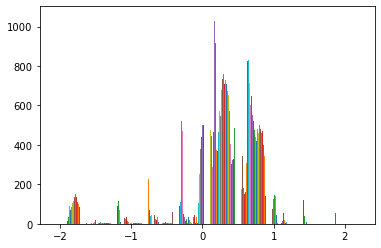

In [40]:
plt.hist(dataset_images[0,0,:,:].to('cpu'))

In [4]:
# Find all class RGB values in an image
# img_target = dataset_images[0] # opencv uses GBR
# img_target_RGB = img_target
# print(img_target.shape)
# # np.where(np.all(img_target == np.array()))
# h, w = img_target_RGB.shape[:2]
# colors=[]
# for x in range(w):
#     for y in range(h):
#         pixel = img_target[y,x]
#         if str(pixel) not in colors:
#             colors.append(str(pixel))

# print(colors)

print(len(test_data))
print(len(train_data))

21
85


In [5]:
'''Loading saved model''';
# model = fcn.fcn_resnet50(pretrained=False, progress=True, num_classes=num_classes, aux_loss=False, pretrained_backbone=True).to(device)
# optimiser = torch.optim.Adam(model.parameters(), lr=learning_rate, betas=[beta1, beta2], eps=1e-08)

# loaded_checkpoint = torch.load("UPDATE PATH")

# # for param in model.parameters():    # Freezing the startign layers
# #     # param.requires_grad = False
# #     param.requires_grad = False

# model.load_state_dict(loaded_checkpoint["model_state"])
# optimiser.load_state_dict(loaded_checkpoint["optimiser_state"])
# epoch = loaded_checkpoint["epoch"]
# criterion = nn.CrossEntropyLoss()

In [4]:
'''Loading new model''';
model = fcn.fcn_resnet50(pretrained=False, progress=True, num_classes=num_classes, aux_loss=False, pretrained_backbone=True).to(device)

# Finetuning
# for param in model.parameters():    # Freezing/unfreezing the starting layers
#     # param.requires_grad = False
#     param.requires_grad = False

optimiser = torch.optim.Adam(model.parameters(), lr=learning_rate, betas=[beta1, beta2], eps=1e-8)
criterion = nn.CrossEntropyLoss()


Starting training


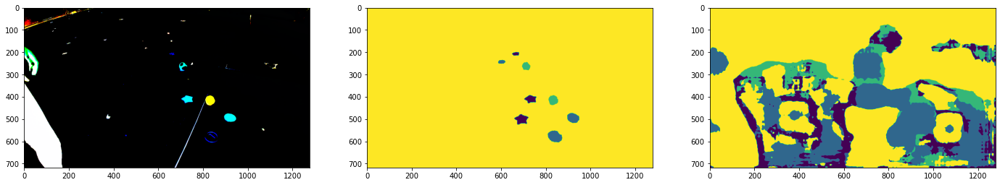

Epoch 1/50, step 5/43, loss = 1.32592


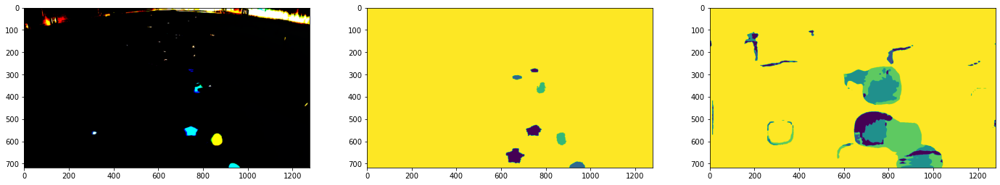

Epoch 1/50, step 10/43, loss = 0.69846


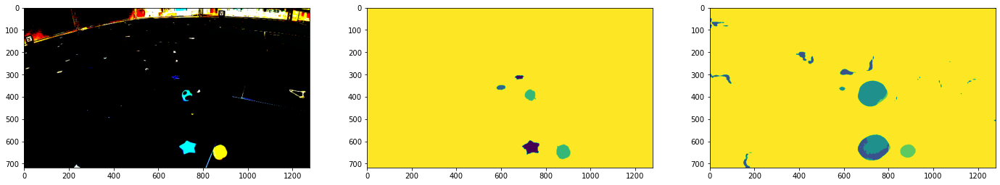

Epoch 1/50, step 15/43, loss = 0.46721


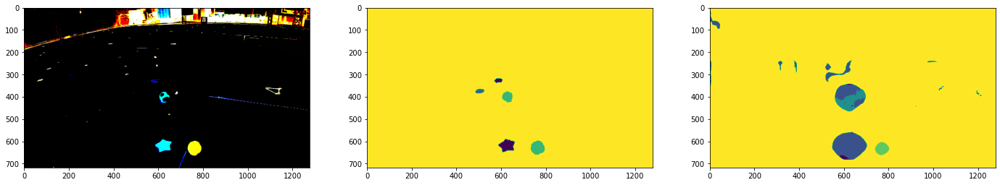

Epoch 1/50, step 20/43, loss = 0.36836


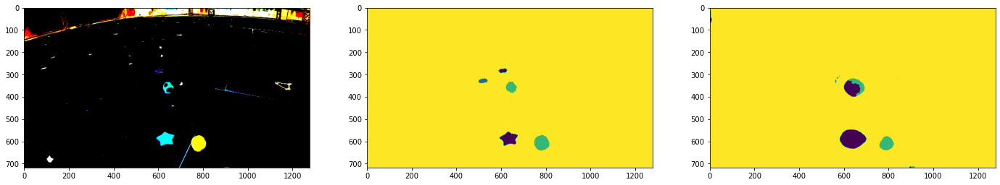

Epoch 1/50, step 25/43, loss = 0.25928


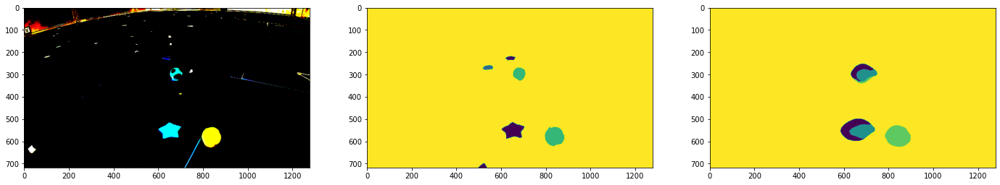

Epoch 1/50, step 30/43, loss = 0.55497


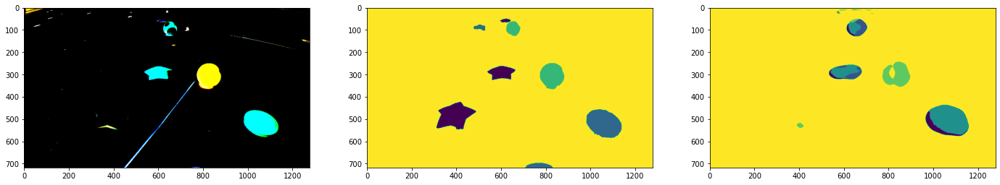

Epoch 1/50, step 35/43, loss = 0.23742


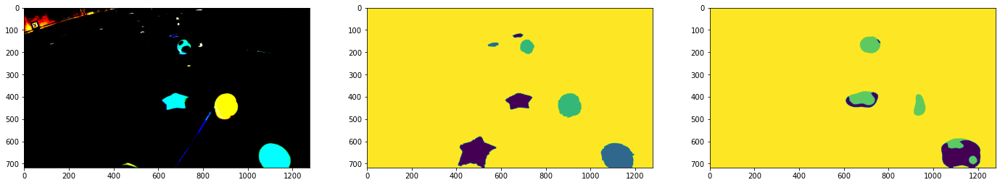

Epoch 1/50, step 40/43, loss = 0.17990


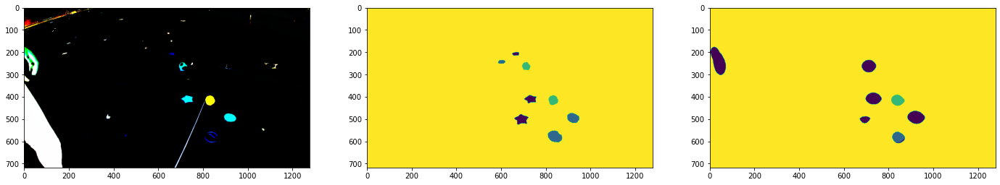

Epoch 2/50, step 5/43, loss = 0.15344


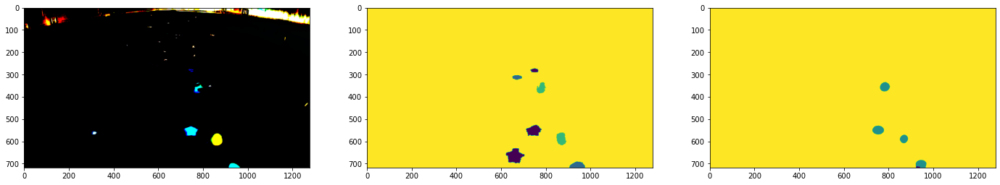

Epoch 2/50, step 10/43, loss = 0.13726


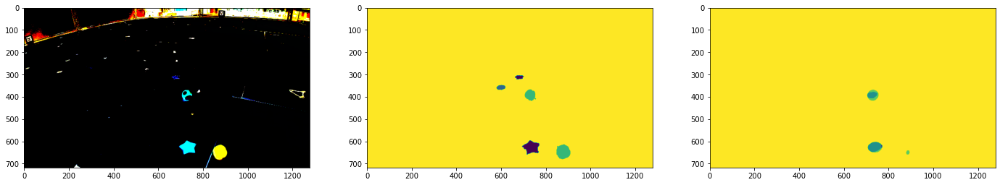

Epoch 2/50, step 15/43, loss = 1.94973


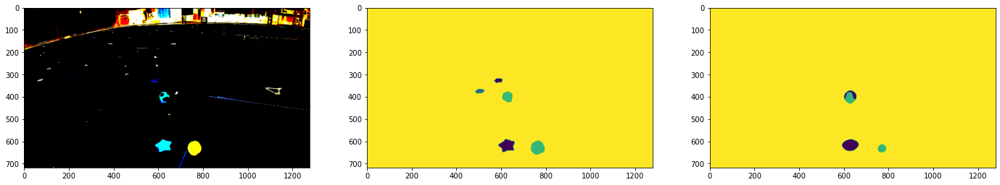

Epoch 2/50, step 20/43, loss = 0.12322


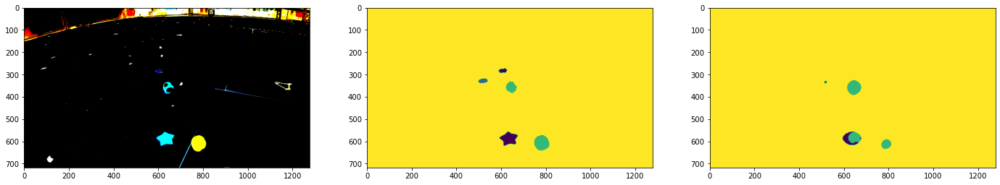

Epoch 2/50, step 25/43, loss = 0.12369


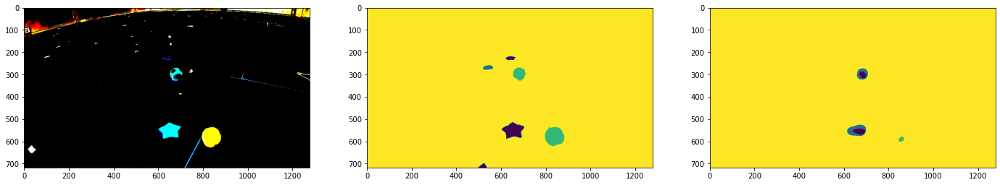

Epoch 2/50, step 30/43, loss = 0.10757


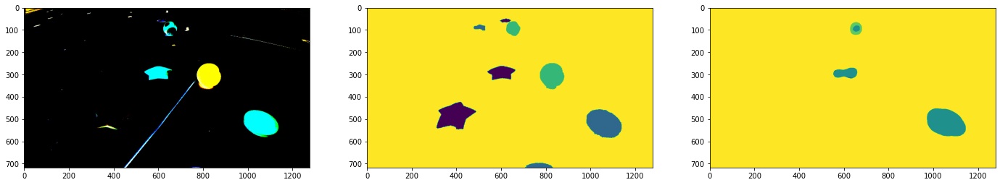

Epoch 2/50, step 35/43, loss = 0.11314


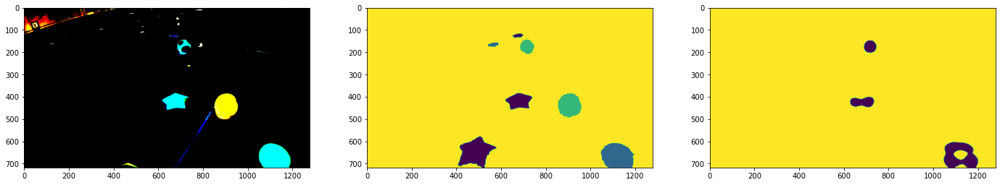

Epoch 2/50, step 40/43, loss = 0.09120


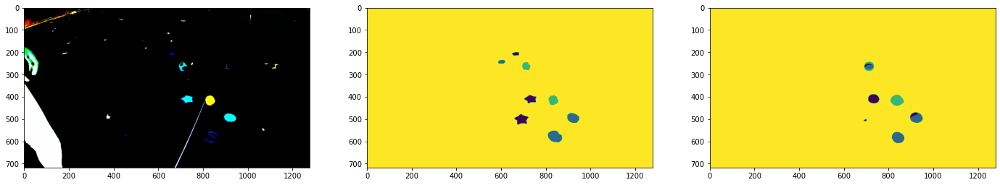

Epoch 3/50, step 5/43, loss = 0.11600


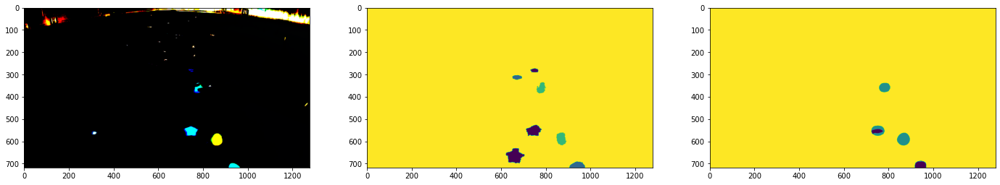

Epoch 3/50, step 10/43, loss = 0.08099


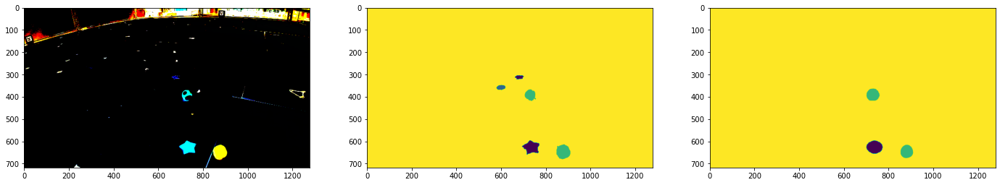

Epoch 3/50, step 15/43, loss = 0.07256


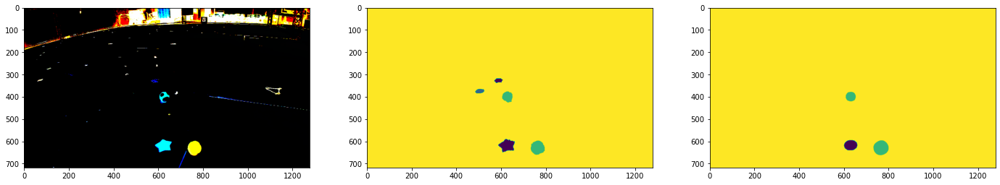

Epoch 3/50, step 20/43, loss = 0.07263


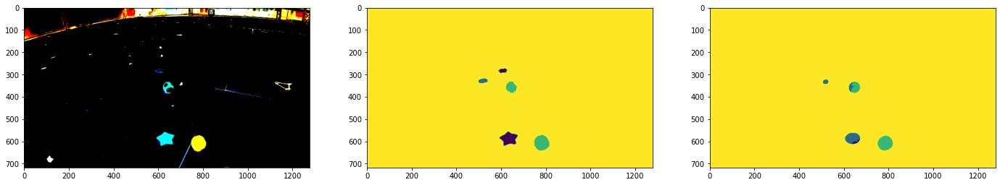

Epoch 3/50, step 25/43, loss = 0.07934


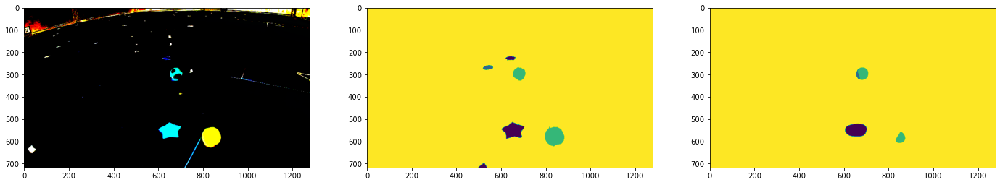

Epoch 3/50, step 30/43, loss = 0.06673


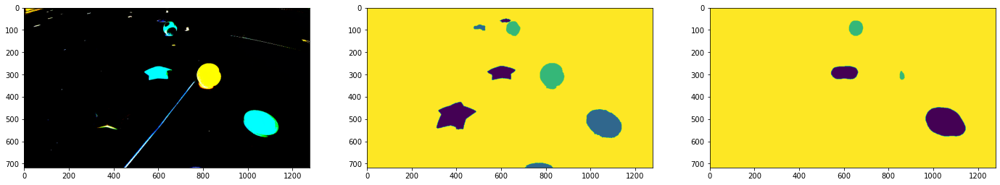

Epoch 3/50, step 35/43, loss = 0.07231


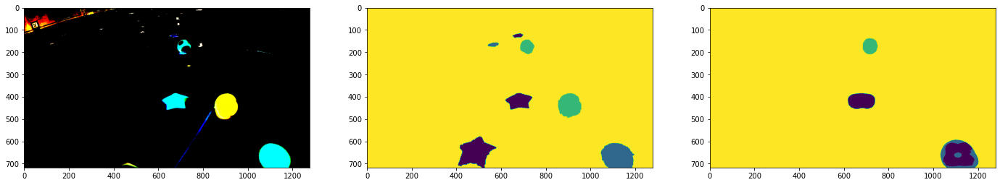

Epoch 3/50, step 40/43, loss = 0.05665


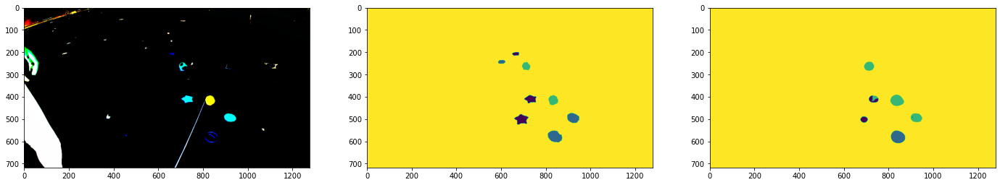

Epoch 4/50, step 5/43, loss = 0.05562


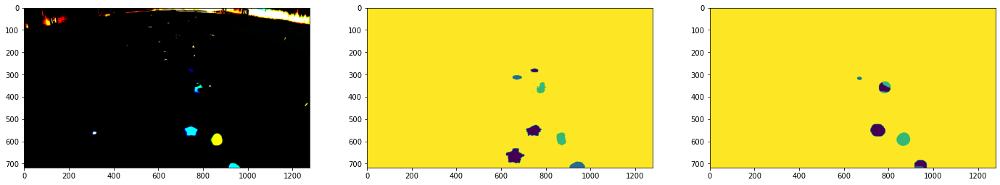

Epoch 4/50, step 10/43, loss = 0.05109


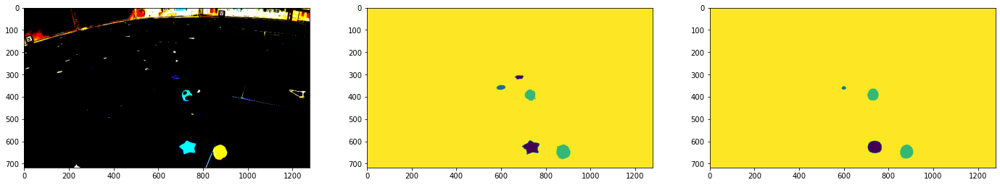

Epoch 4/50, step 15/43, loss = 0.06011


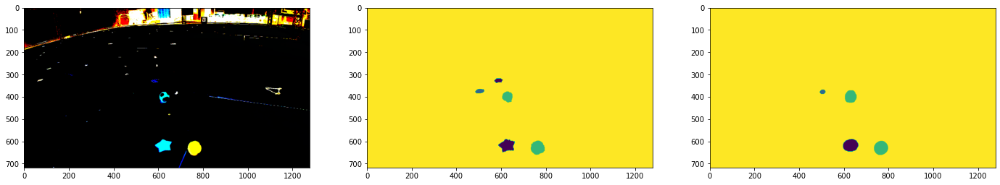

Epoch 4/50, step 20/43, loss = 0.06413


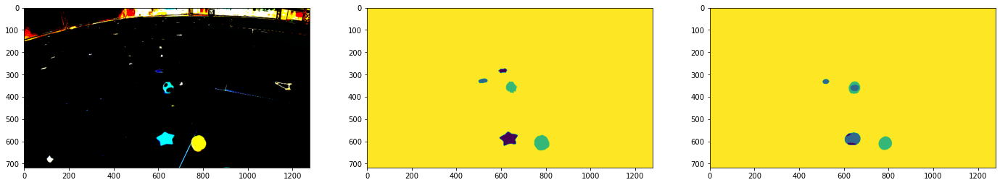

Epoch 4/50, step 25/43, loss = 0.05872


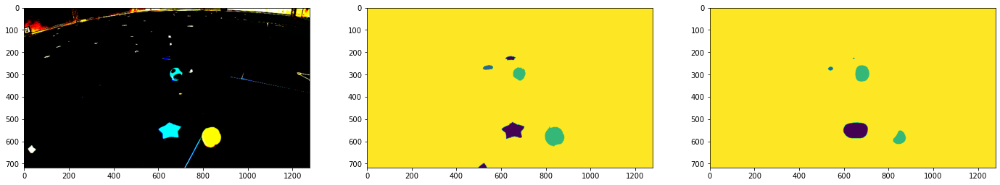

Epoch 4/50, step 30/43, loss = 0.05388


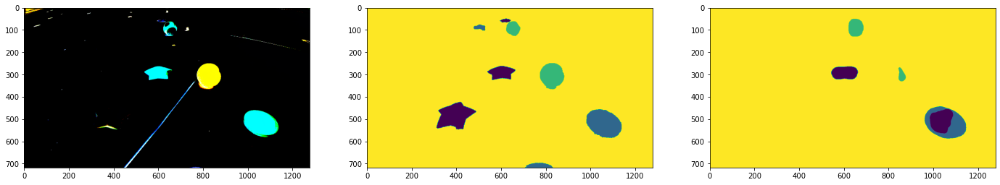

Epoch 4/50, step 35/43, loss = 0.05480


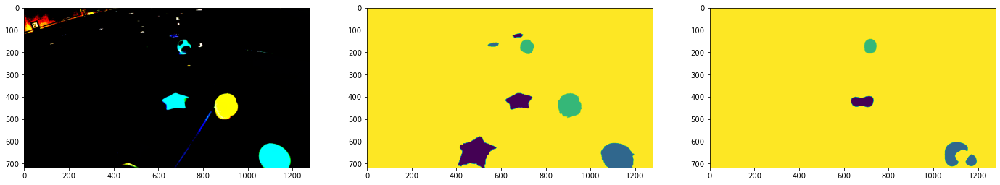

Epoch 4/50, step 40/43, loss = 0.04884


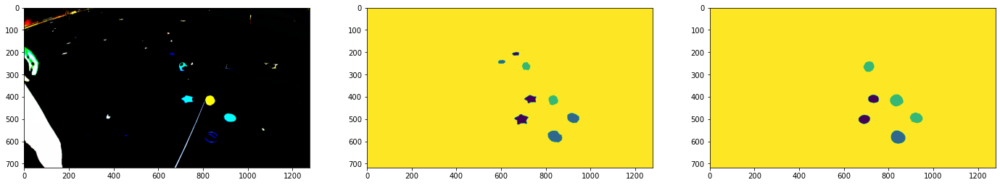

Epoch 5/50, step 5/43, loss = 0.04030


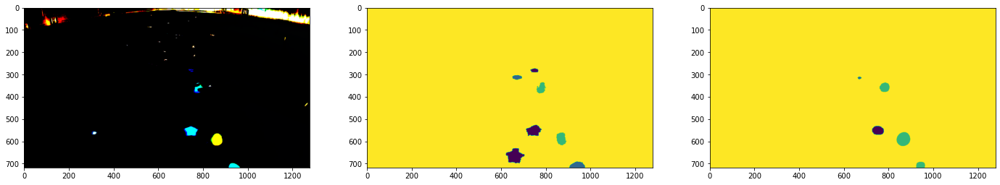

Epoch 5/50, step 10/43, loss = 0.04576


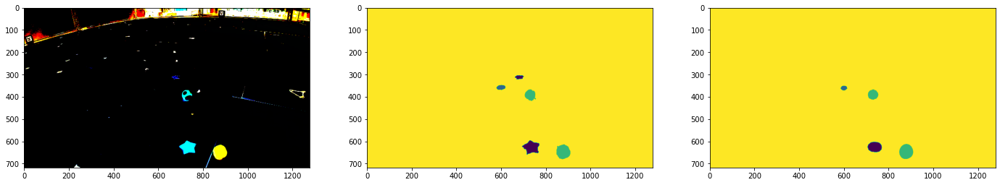

Epoch 5/50, step 15/43, loss = 0.03811


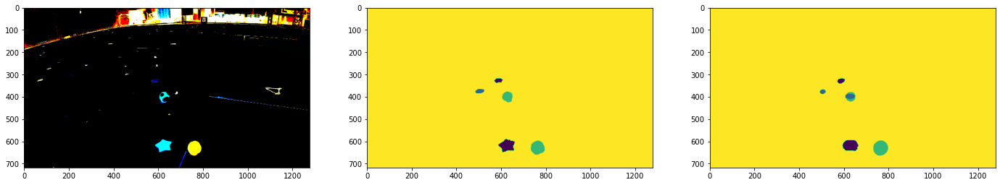

Epoch 5/50, step 20/43, loss = 0.05227


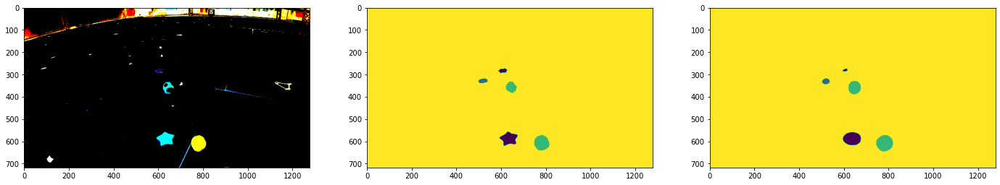

Epoch 5/50, step 25/43, loss = 0.06058


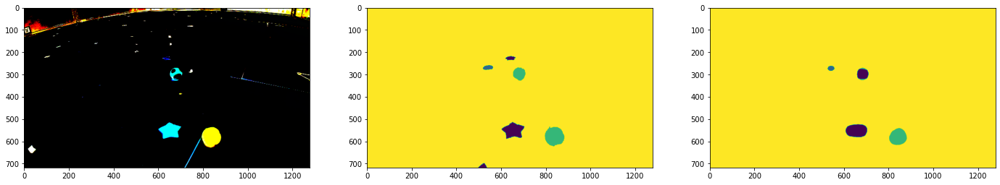

Epoch 5/50, step 30/43, loss = 0.04144


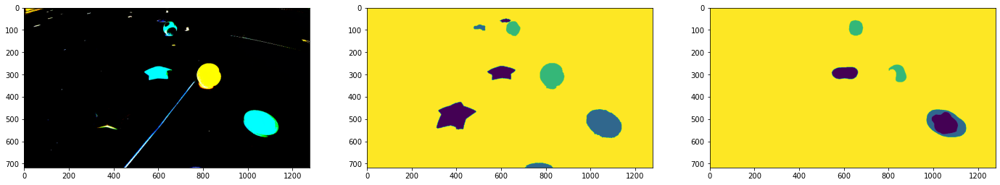

Epoch 5/50, step 35/43, loss = 0.03782


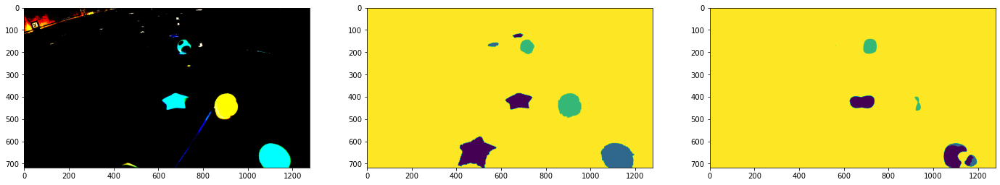

Epoch 5/50, step 40/43, loss = 0.03709


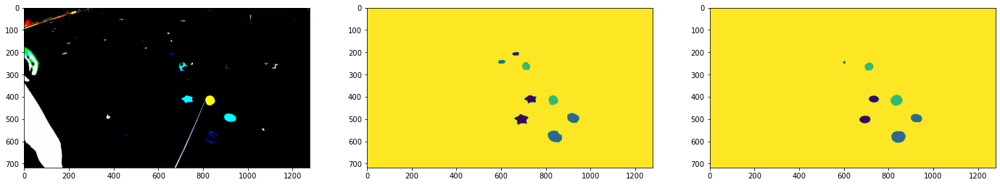

Epoch 6/50, step 5/43, loss = 0.04432


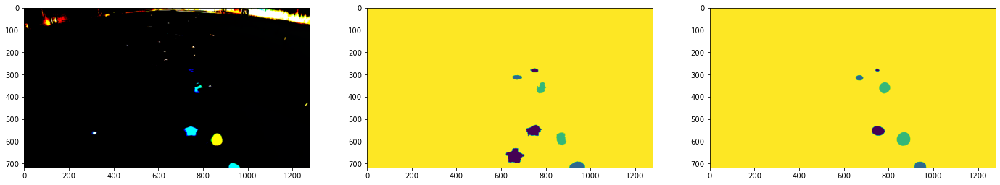

Epoch 6/50, step 10/43, loss = 0.04072


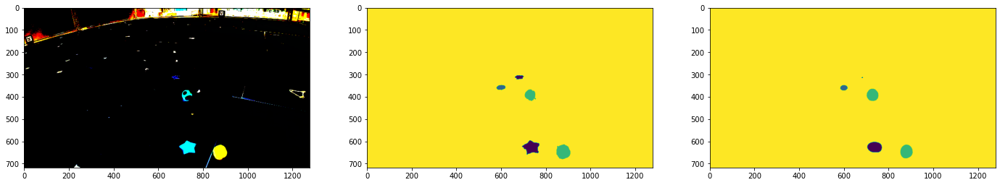

Epoch 6/50, step 15/43, loss = 0.04394


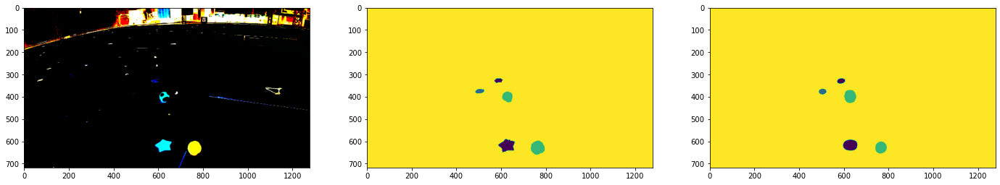

Epoch 6/50, step 20/43, loss = 0.03772


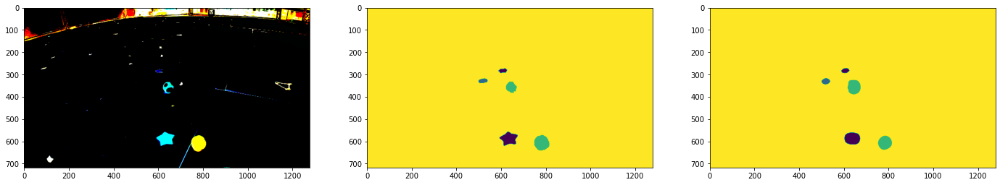

Epoch 6/50, step 25/43, loss = 0.03502


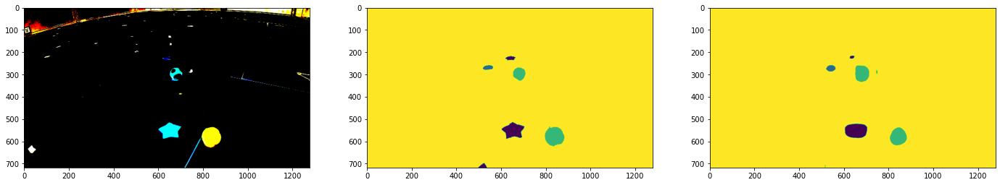

Epoch 6/50, step 30/43, loss = 0.03678


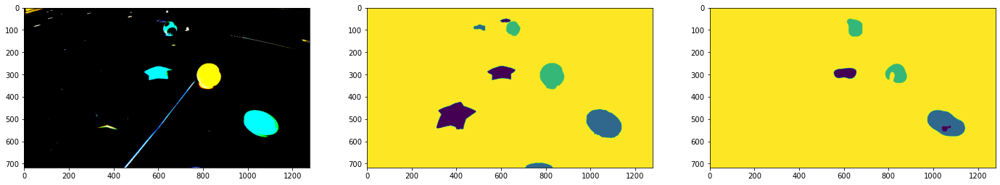

Epoch 6/50, step 35/43, loss = 0.03239


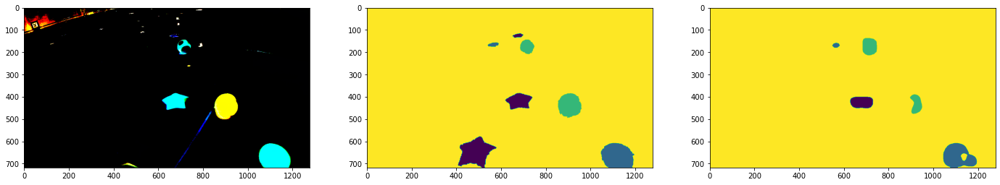

Epoch 6/50, step 40/43, loss = 0.02858


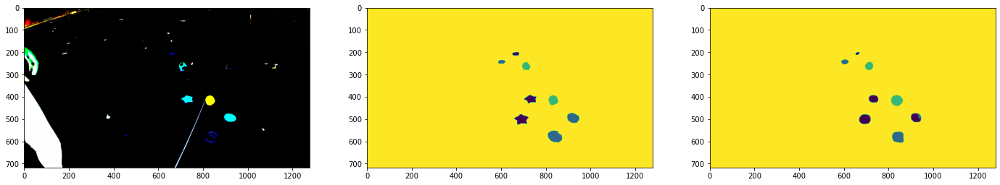

Epoch 7/50, step 5/43, loss = 0.03341


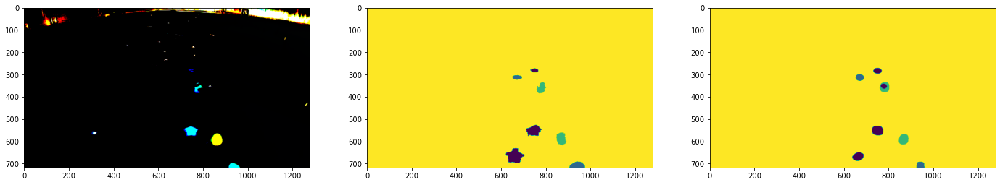

Epoch 7/50, step 10/43, loss = 0.02924


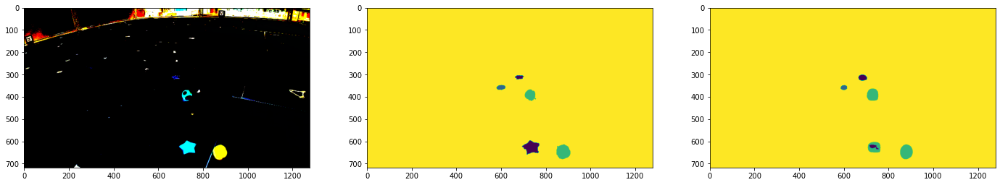

Epoch 7/50, step 15/43, loss = 0.06363


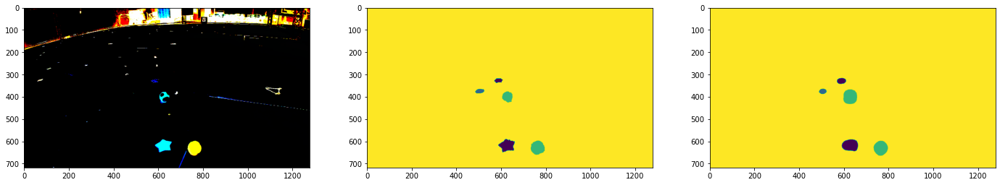

Epoch 7/50, step 20/43, loss = 0.03352


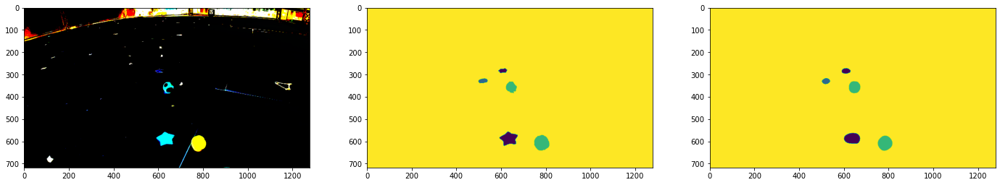

Epoch 7/50, step 25/43, loss = 0.03188


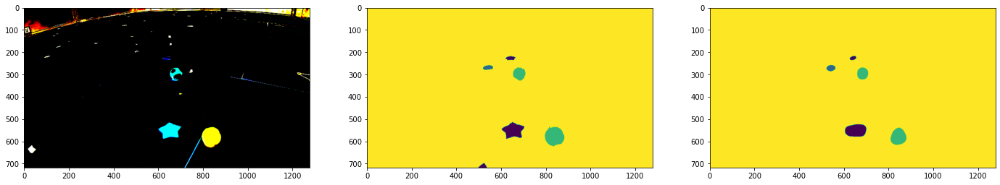

Epoch 7/50, step 30/43, loss = 0.03084


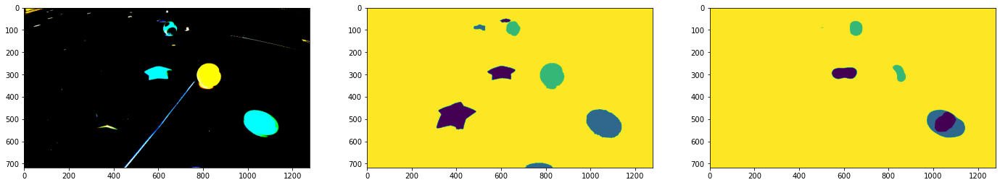

Epoch 7/50, step 35/43, loss = 0.02768


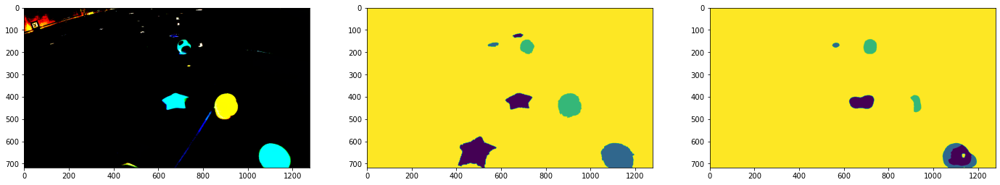

Epoch 7/50, step 40/43, loss = 0.02707


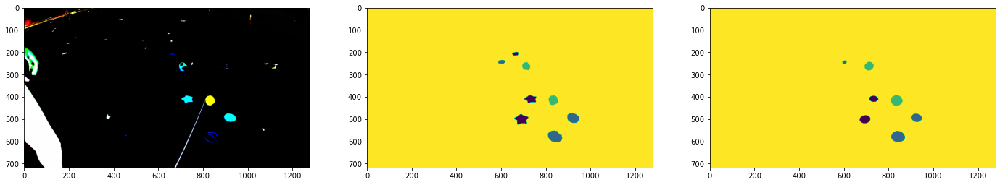

Epoch 8/50, step 5/43, loss = 0.02269


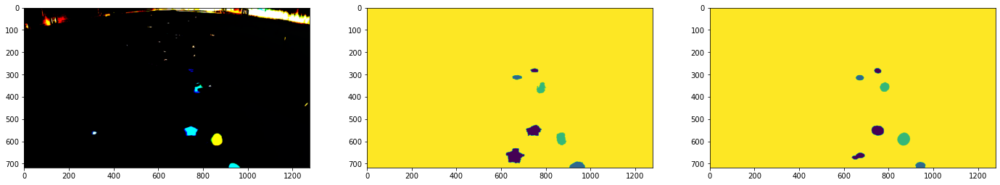

Epoch 8/50, step 10/43, loss = 0.02392


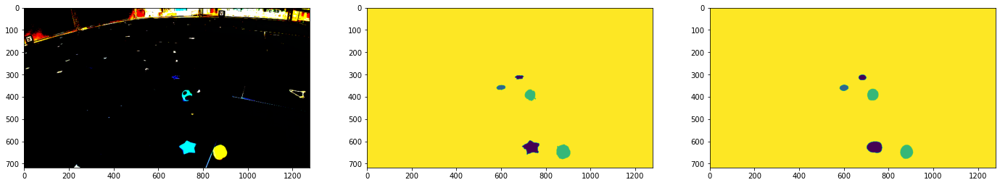

Epoch 8/50, step 15/43, loss = 0.02679


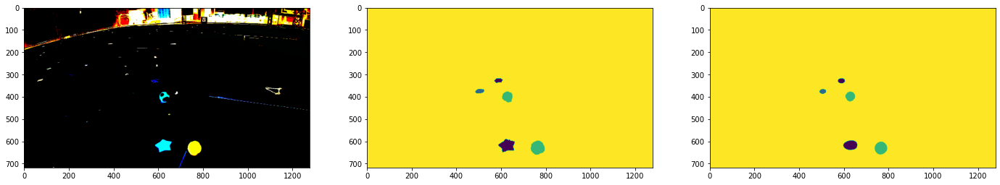

Epoch 8/50, step 20/43, loss = 0.02867


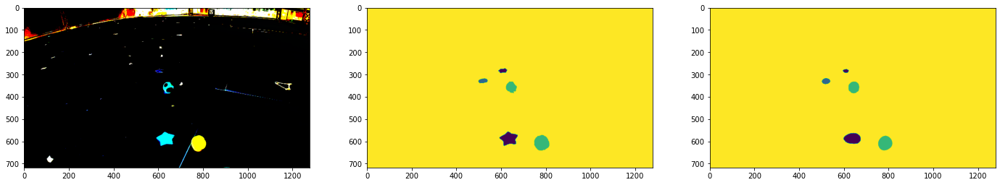

Epoch 8/50, step 25/43, loss = 0.03599


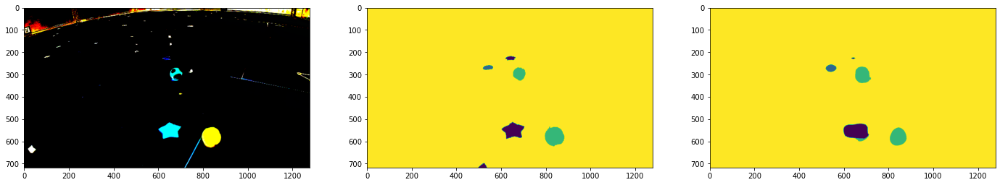

Epoch 8/50, step 30/43, loss = 0.03846


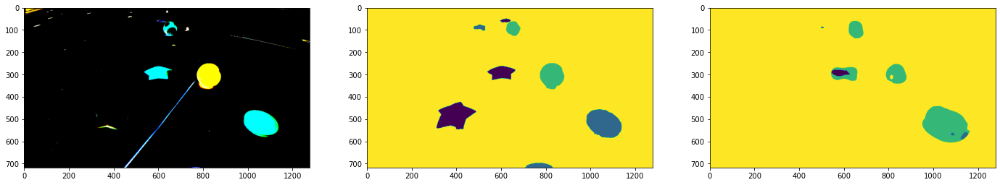

Epoch 8/50, step 35/43, loss = 0.02847


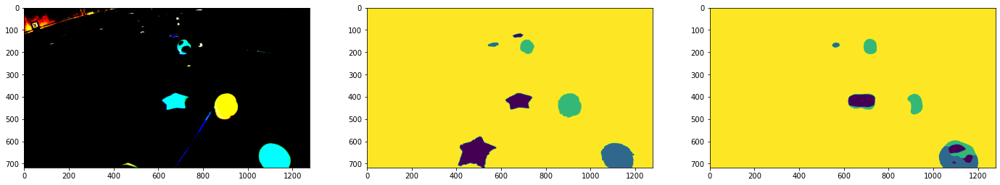

Epoch 8/50, step 40/43, loss = 0.02480


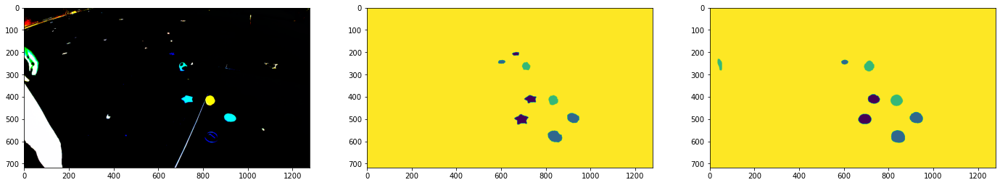

Epoch 9/50, step 5/43, loss = 0.02287


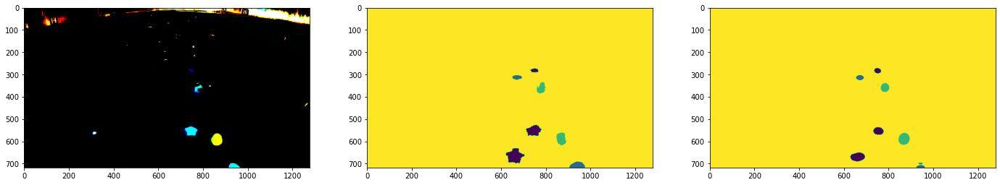

Epoch 9/50, step 10/43, loss = 0.03954


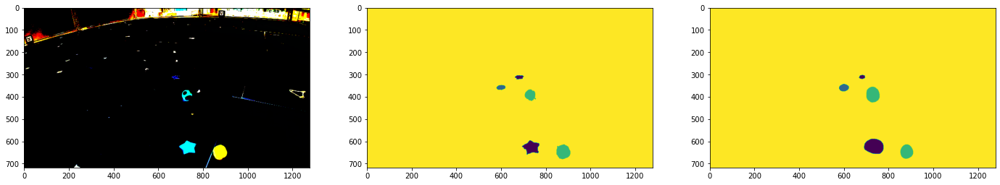

Epoch 9/50, step 15/43, loss = 0.03050


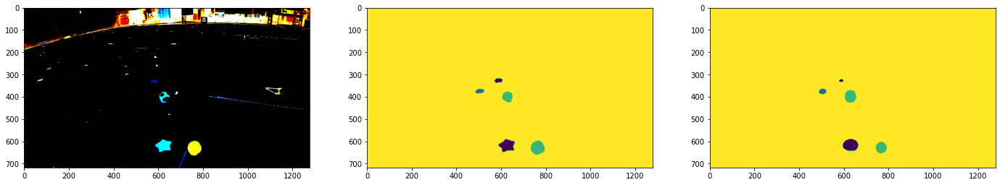

Epoch 9/50, step 20/43, loss = 0.04916


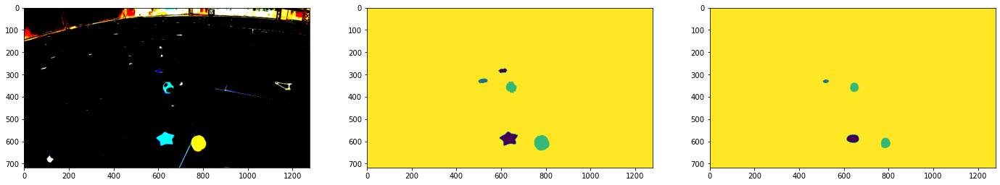

Epoch 9/50, step 25/43, loss = 0.02836


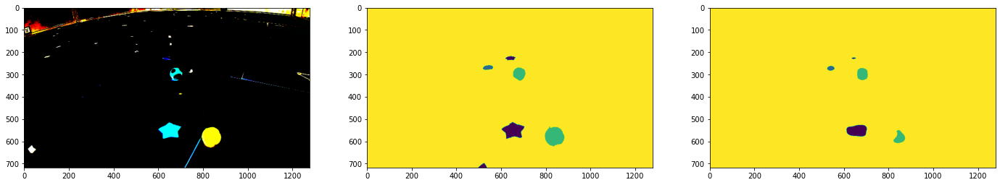

Epoch 9/50, step 30/43, loss = 0.02467


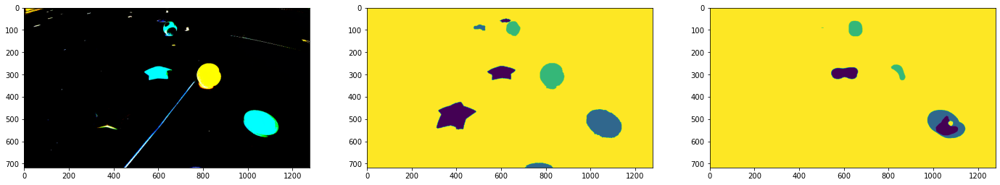

Epoch 9/50, step 35/43, loss = 0.02422


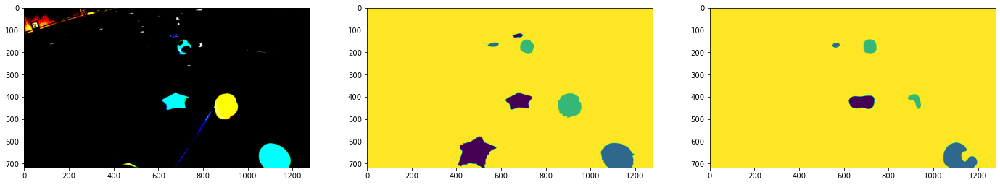

Epoch 9/50, step 40/43, loss = 0.02592


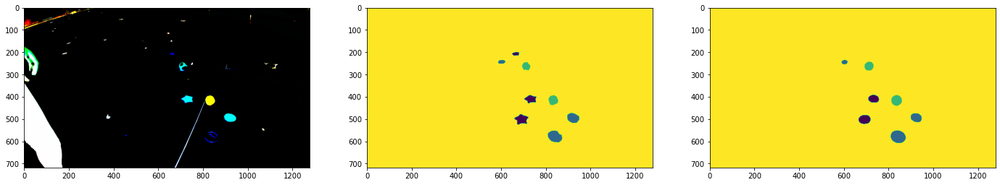

Epoch 10/50, step 5/43, loss = 0.02469


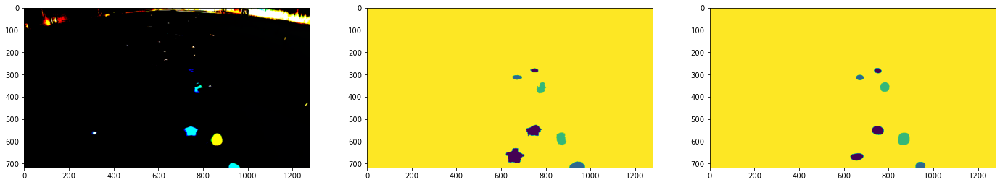

Epoch 10/50, step 10/43, loss = 0.02413


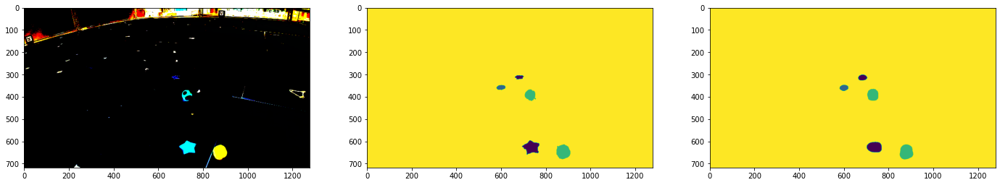

Epoch 10/50, step 15/43, loss = 0.01900


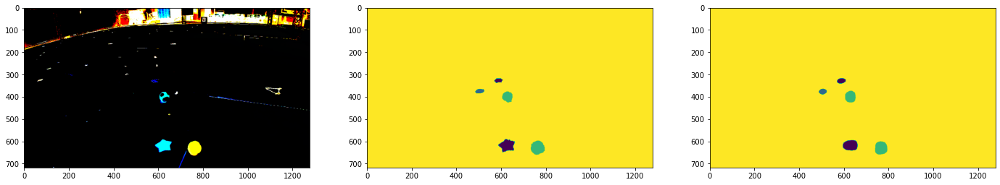

Epoch 10/50, step 20/43, loss = 0.01826


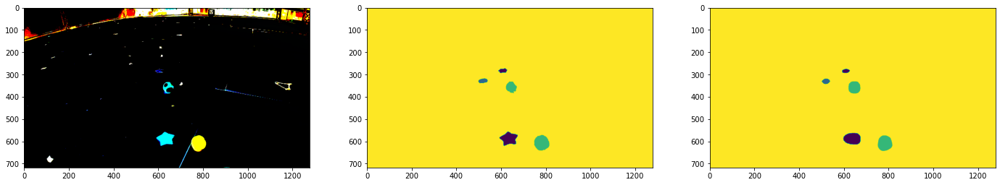

Epoch 10/50, step 25/43, loss = 0.01957


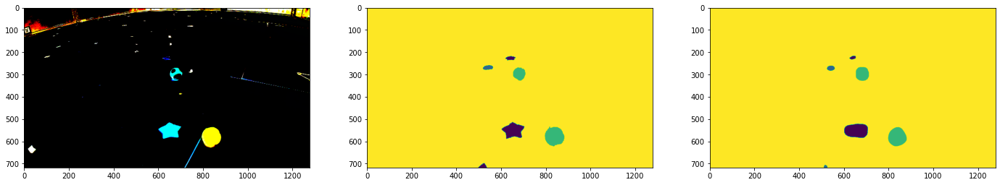

Epoch 10/50, step 30/43, loss = 0.01853


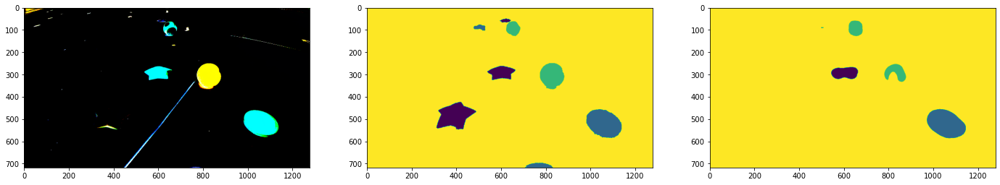

Epoch 10/50, step 35/43, loss = 0.01638


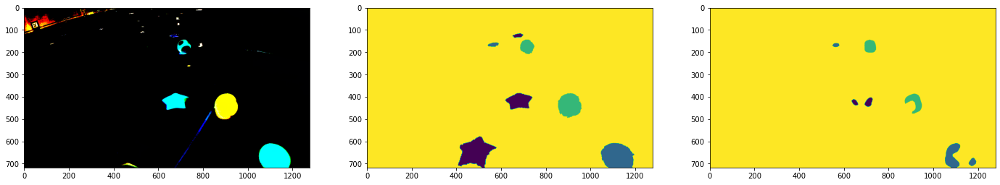

Epoch 10/50, step 40/43, loss = 0.02255


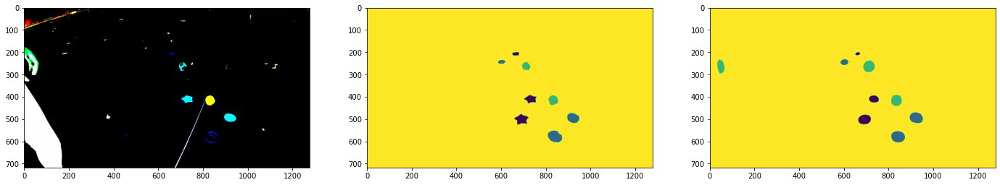

Epoch 11/50, step 5/43, loss = 0.02645


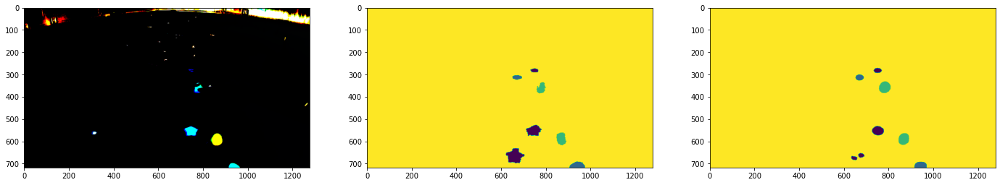

Epoch 11/50, step 10/43, loss = 0.04559


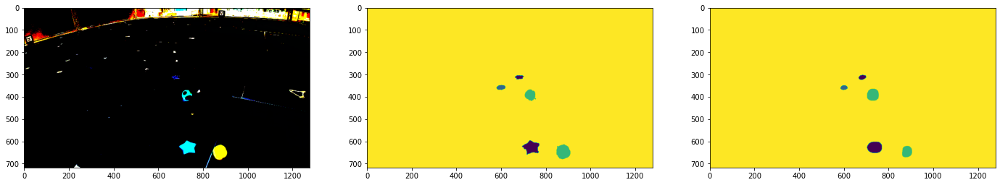

Epoch 11/50, step 15/43, loss = 0.02538


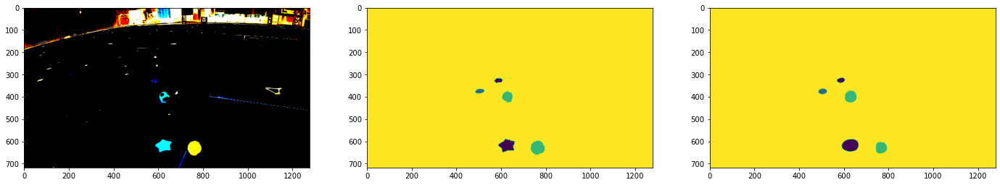

Epoch 11/50, step 20/43, loss = 0.02704


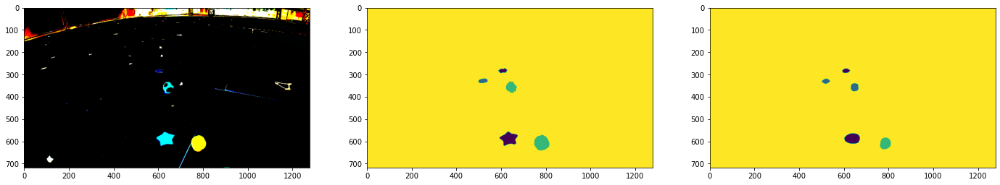

Epoch 11/50, step 25/43, loss = 0.03531


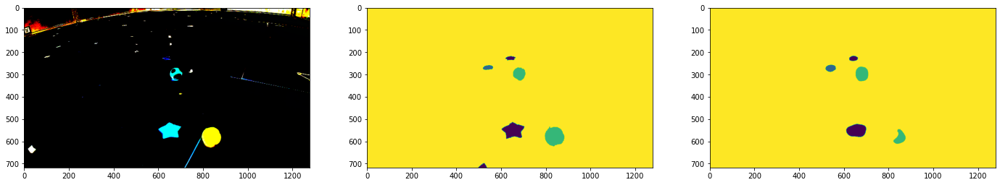

Epoch 11/50, step 30/43, loss = 0.02933


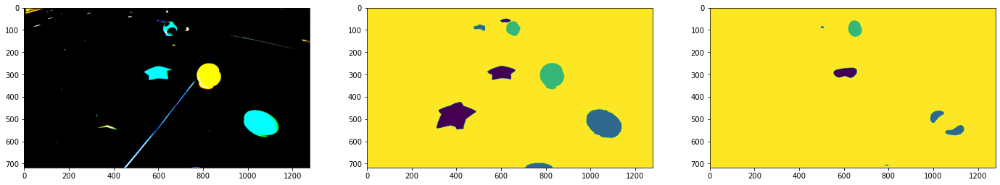

Epoch 11/50, step 35/43, loss = 0.02219


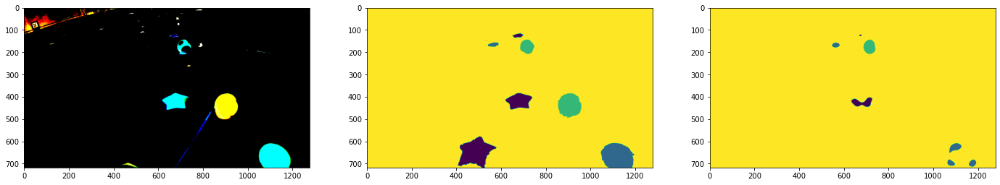

Epoch 11/50, step 40/43, loss = 0.02233


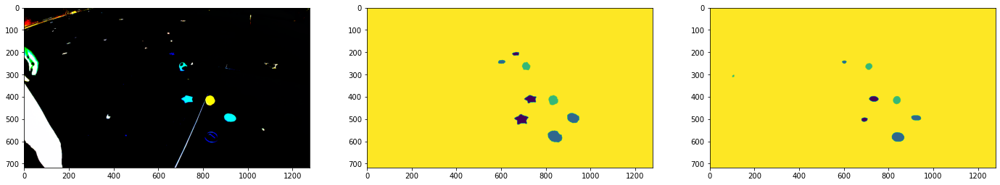

Epoch 12/50, step 5/43, loss = 0.03785


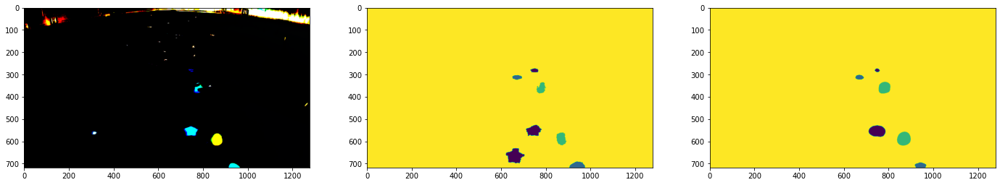

Epoch 12/50, step 10/43, loss = 0.09824


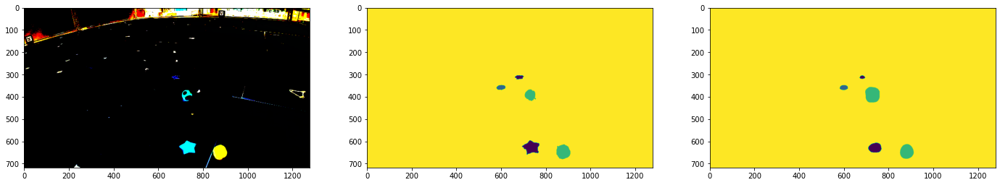

Epoch 12/50, step 15/43, loss = 0.03591


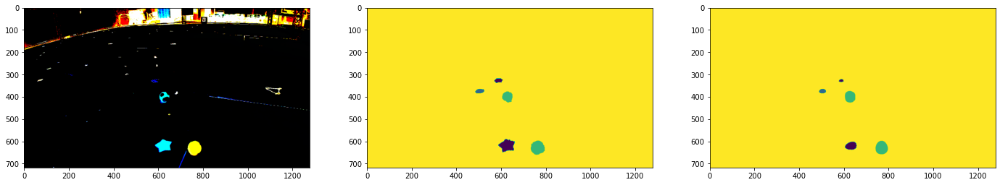

Epoch 12/50, step 20/43, loss = 0.02664


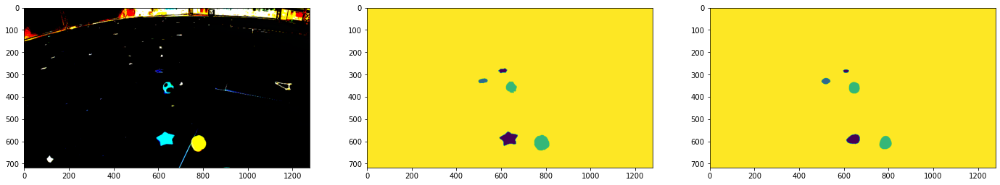

Epoch 12/50, step 25/43, loss = 0.02608


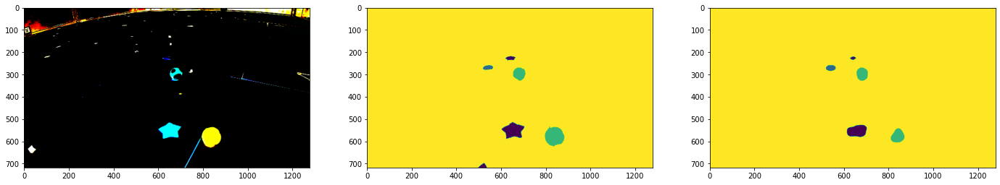

Epoch 12/50, step 30/43, loss = 0.02329


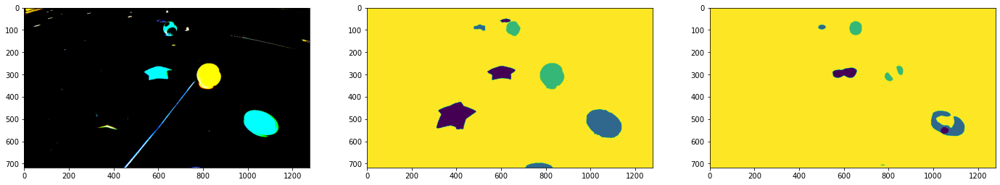

Epoch 12/50, step 35/43, loss = 0.02365


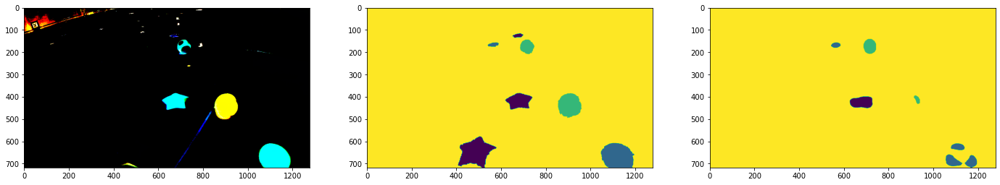

Epoch 12/50, step 40/43, loss = 0.01719


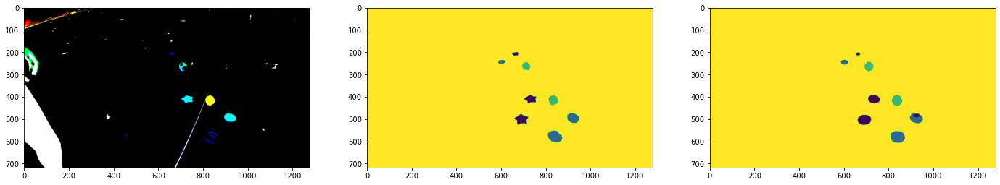

Epoch 13/50, step 5/43, loss = 0.01666


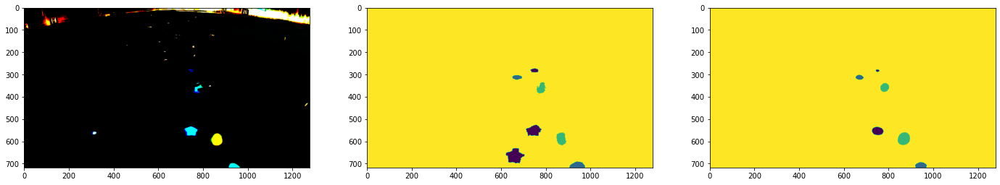

Epoch 13/50, step 10/43, loss = 0.01721


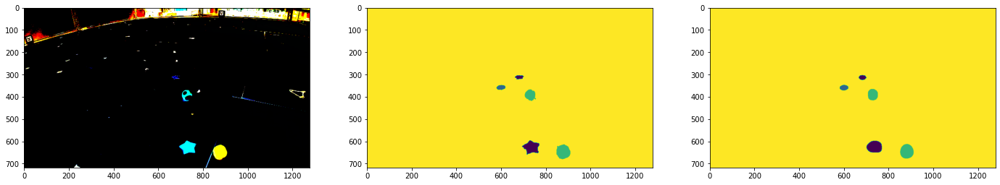

Epoch 13/50, step 15/43, loss = 0.01419


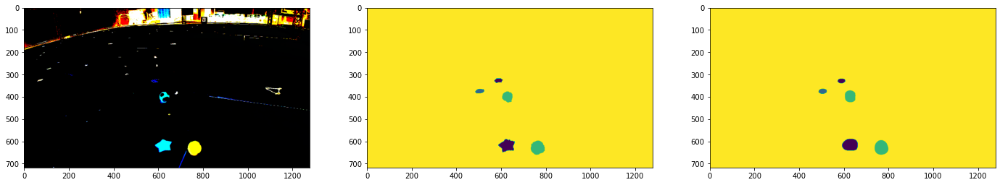

Epoch 13/50, step 20/43, loss = 0.01561


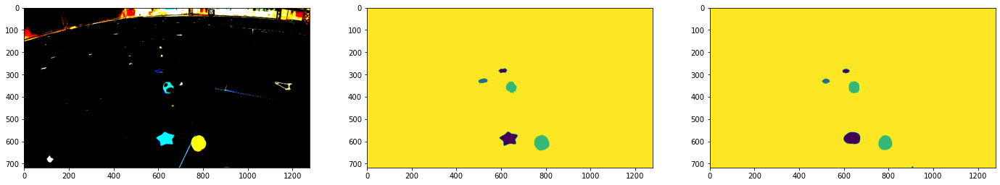

Epoch 13/50, step 25/43, loss = 0.01441


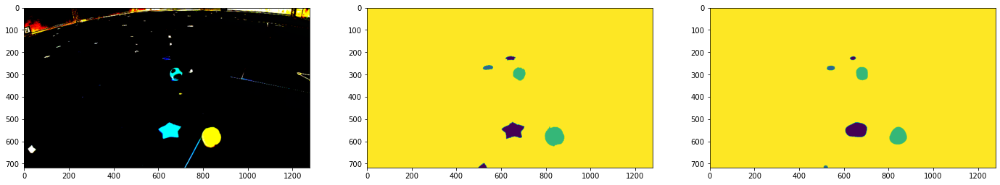

Epoch 13/50, step 30/43, loss = 2.37871


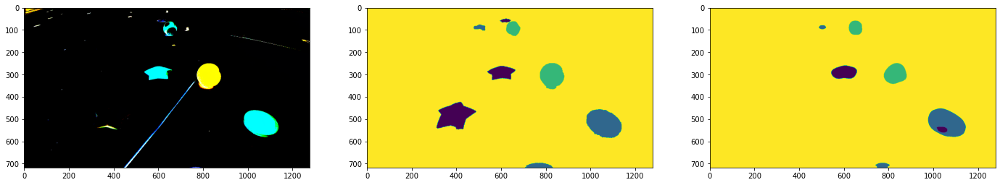

Epoch 13/50, step 35/43, loss = 0.01913


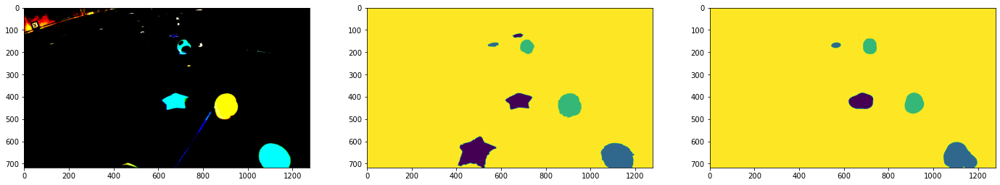

Epoch 13/50, step 40/43, loss = 0.02570


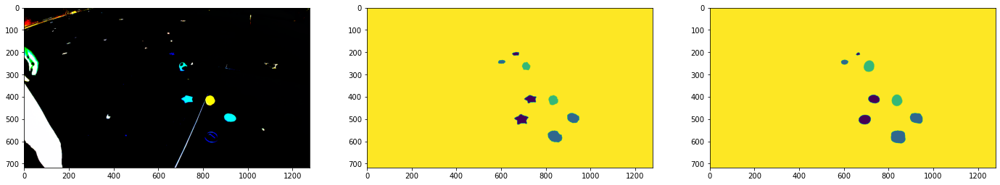

Epoch 14/50, step 5/43, loss = 0.02183


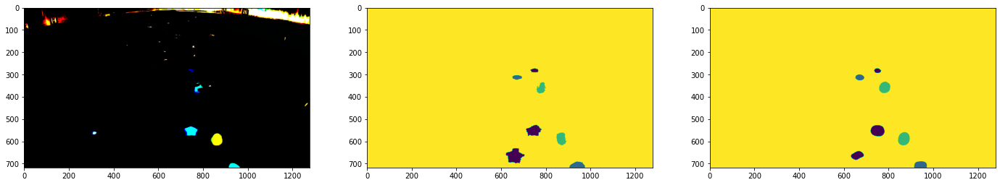

Epoch 14/50, step 10/43, loss = 0.02056


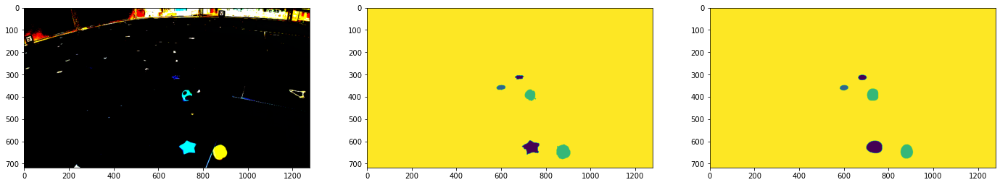

Epoch 14/50, step 15/43, loss = 0.01766


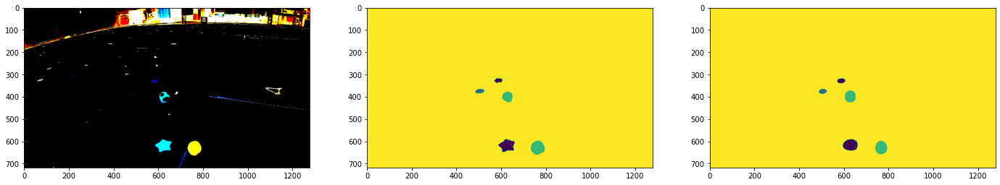

Epoch 14/50, step 20/43, loss = 0.01618


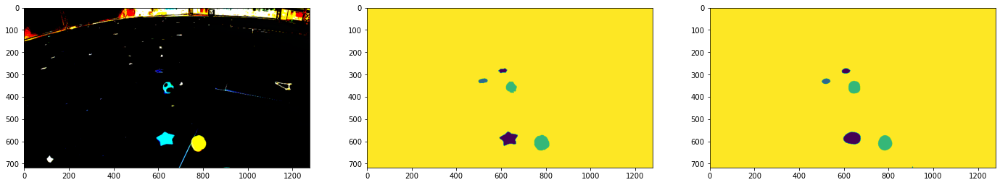

Epoch 14/50, step 25/43, loss = 0.01429


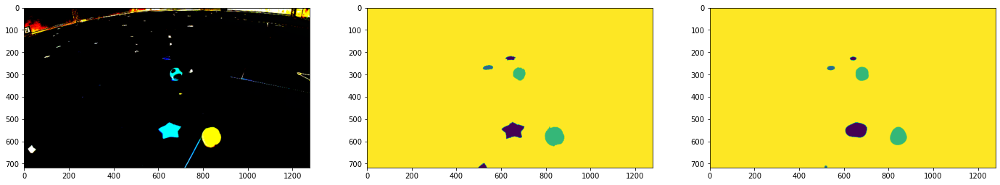

Epoch 14/50, step 30/43, loss = 0.01484


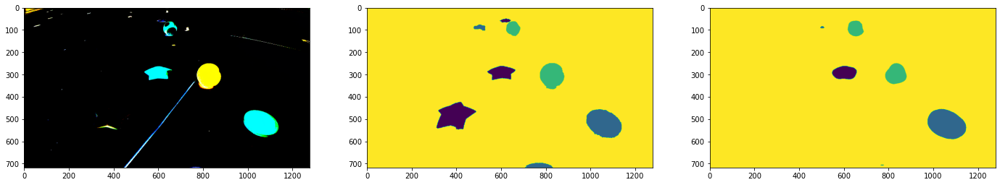

Epoch 14/50, step 35/43, loss = 0.02885


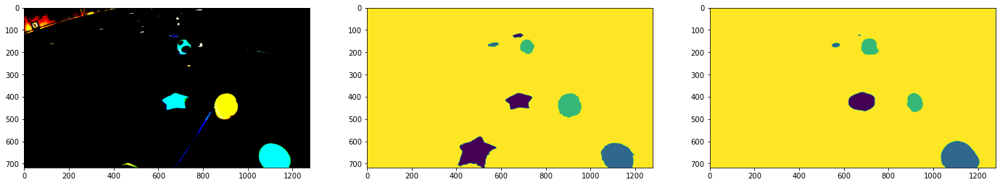

Epoch 14/50, step 40/43, loss = 0.06844


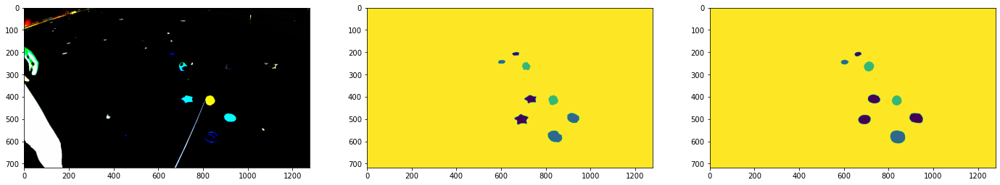

Epoch 15/50, step 5/43, loss = 0.01734


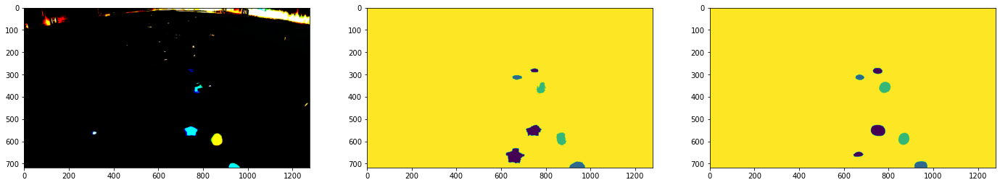

Epoch 15/50, step 10/43, loss = 0.01850


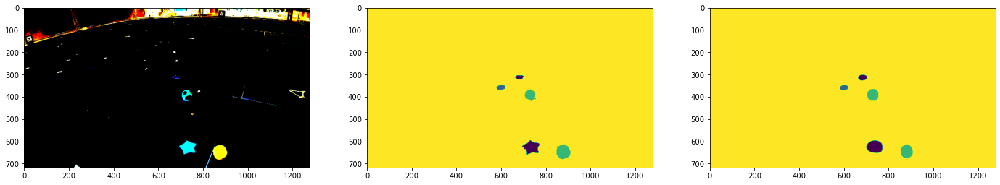

Epoch 15/50, step 15/43, loss = 1.60472


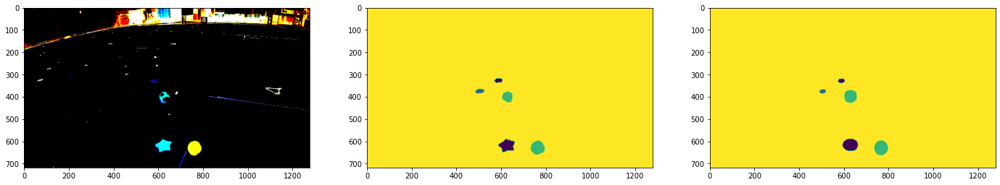

Epoch 15/50, step 20/43, loss = 0.03067


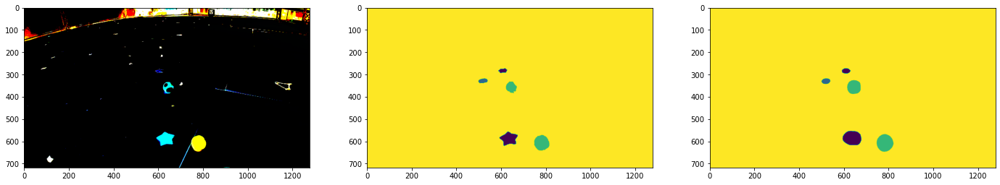

Epoch 15/50, step 25/43, loss = 0.11362


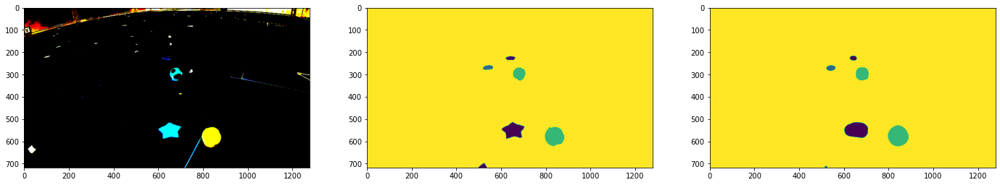

Epoch 15/50, step 30/43, loss = 0.01720


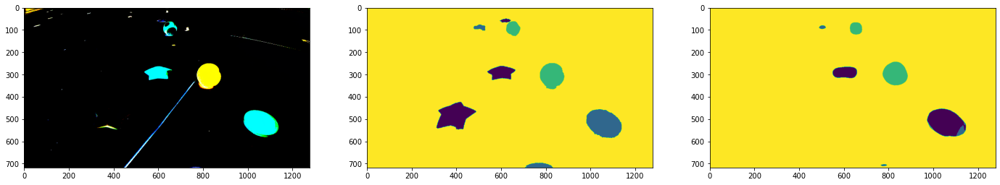

Epoch 15/50, step 35/43, loss = 0.01901


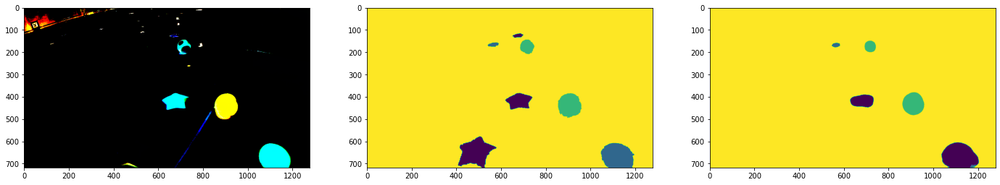

Epoch 15/50, step 40/43, loss = 0.01387


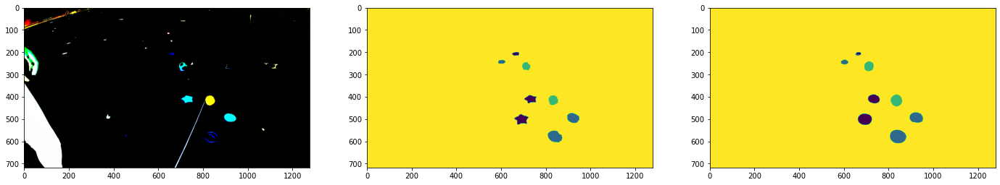

Epoch 16/50, step 5/43, loss = 0.01963


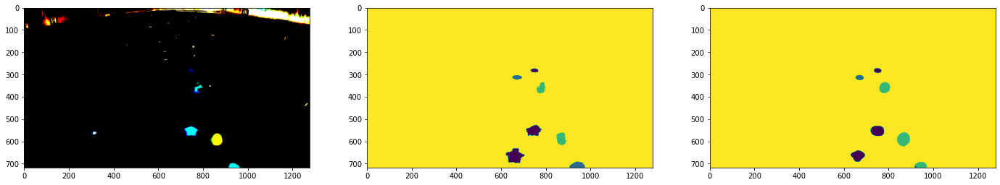

Epoch 16/50, step 10/43, loss = 0.01559


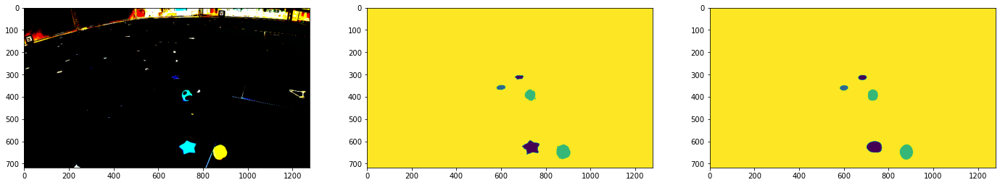

Epoch 16/50, step 15/43, loss = 0.01460


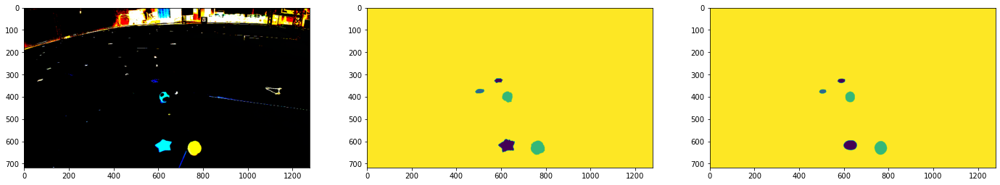

Epoch 16/50, step 20/43, loss = 0.01264


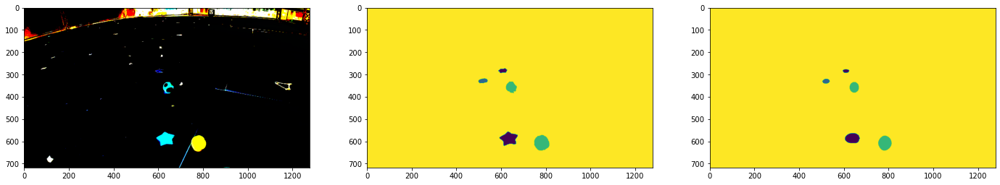

Epoch 16/50, step 25/43, loss = 0.01761


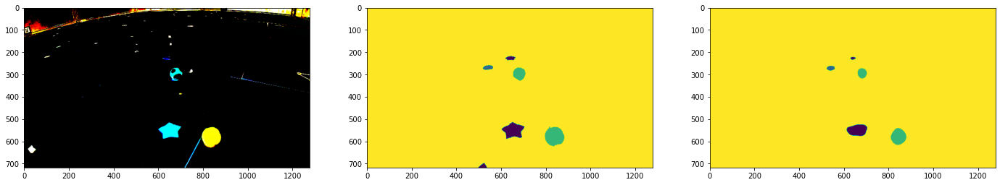

Epoch 16/50, step 30/43, loss = 0.02139


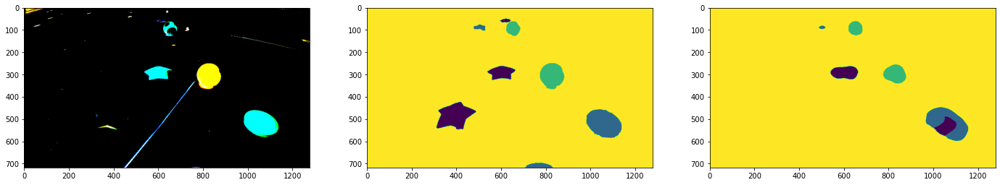

Epoch 16/50, step 35/43, loss = 0.04348


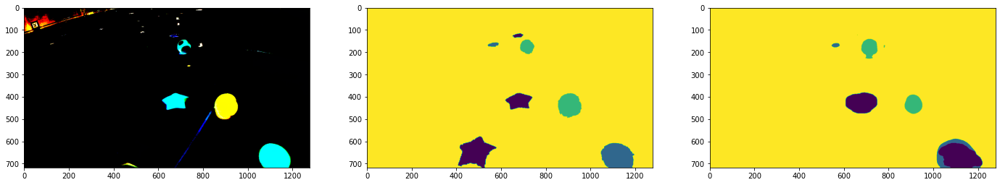

Epoch 16/50, step 40/43, loss = 0.02570


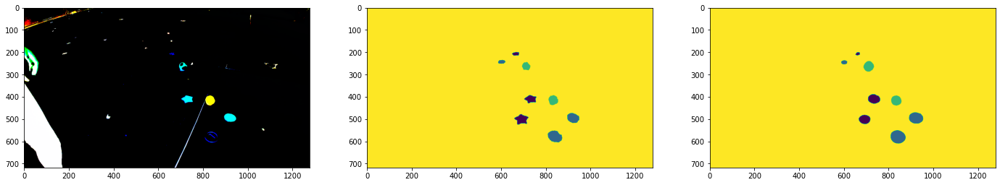

Epoch 17/50, step 5/43, loss = 0.01504


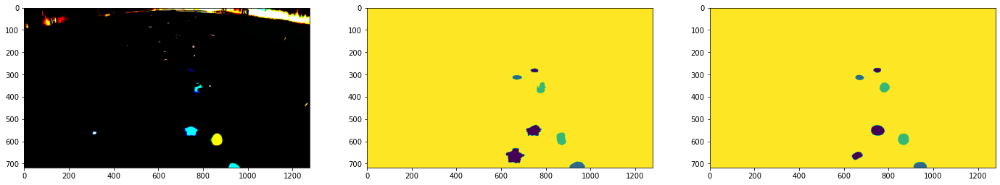

Epoch 17/50, step 10/43, loss = 0.01359


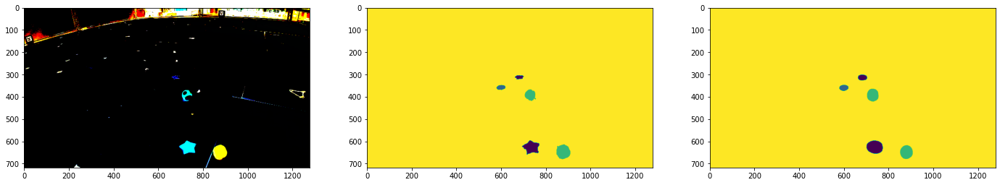

Epoch 17/50, step 15/43, loss = 0.01482


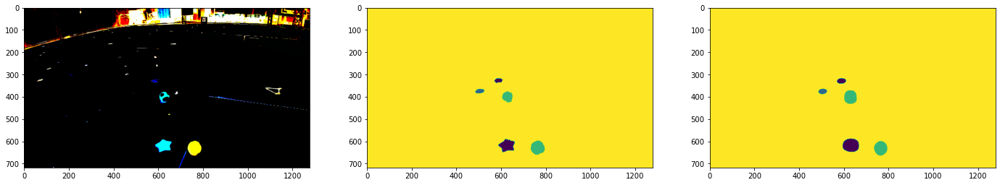

Epoch 17/50, step 20/43, loss = 0.01482


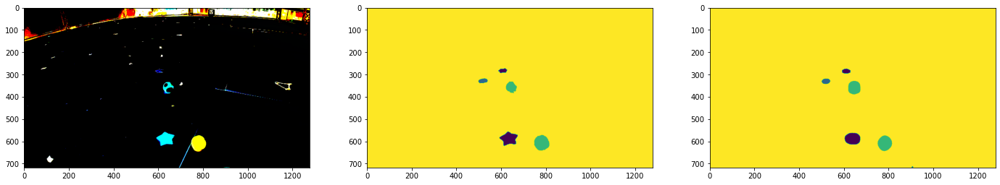

Epoch 17/50, step 25/43, loss = 1.96259


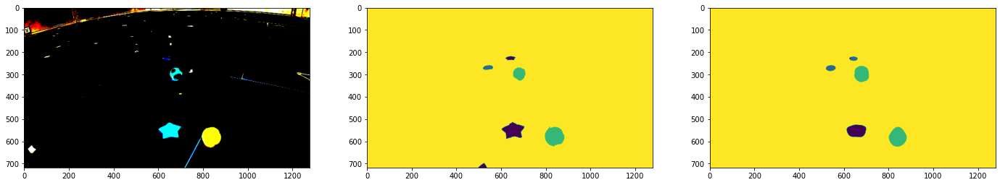

Epoch 17/50, step 30/43, loss = 0.01629


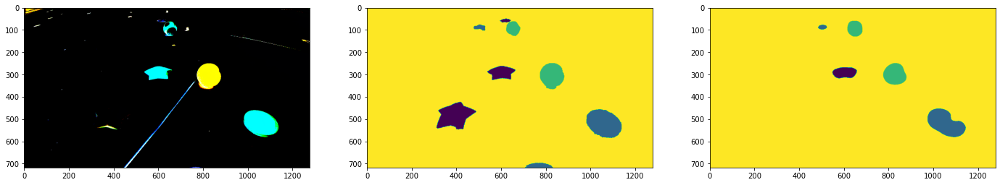

Epoch 17/50, step 35/43, loss = 0.02534


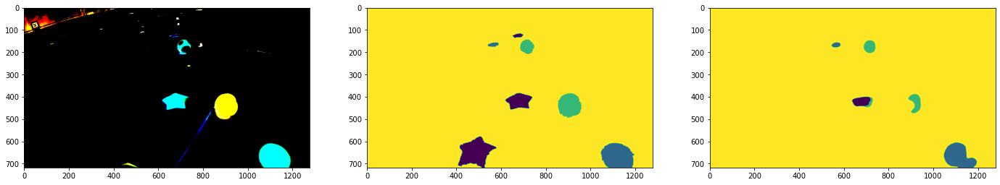

Epoch 17/50, step 40/43, loss = 0.02123


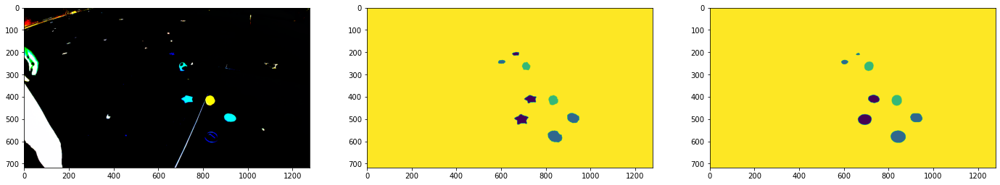

Epoch 18/50, step 5/43, loss = 0.01484


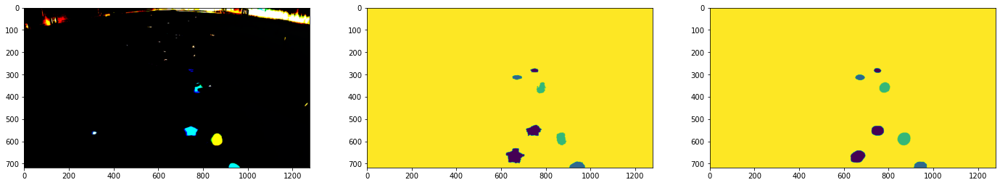

Epoch 18/50, step 10/43, loss = 0.01378


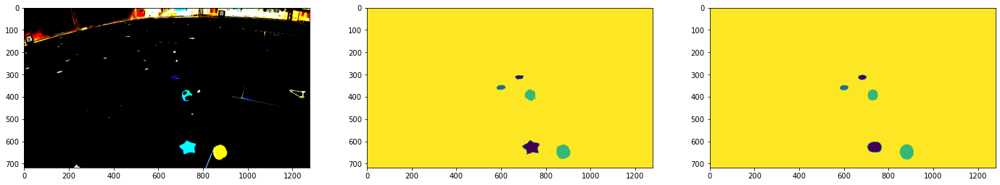

Epoch 18/50, step 15/43, loss = 0.01471


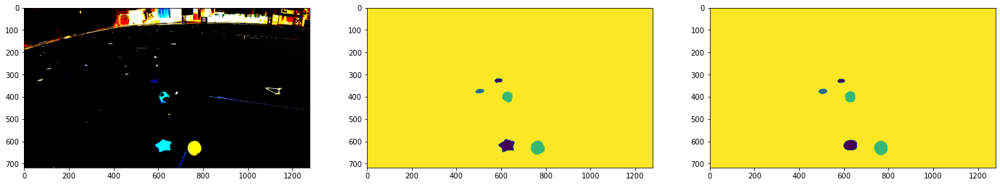

Epoch 18/50, step 20/43, loss = 0.01741


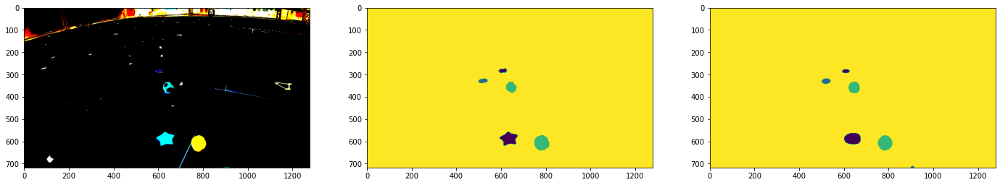

Epoch 18/50, step 25/43, loss = 0.01201


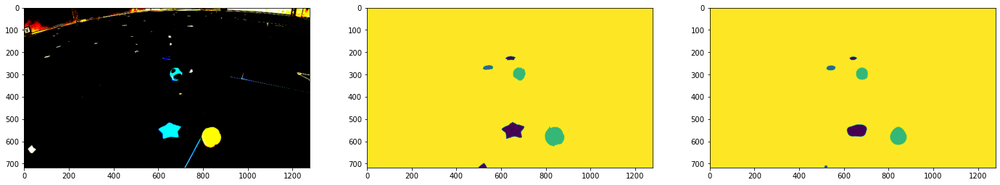

Epoch 18/50, step 30/43, loss = 0.01662


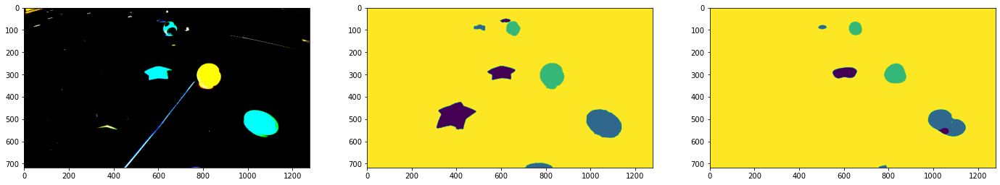

Epoch 18/50, step 35/43, loss = 0.01102


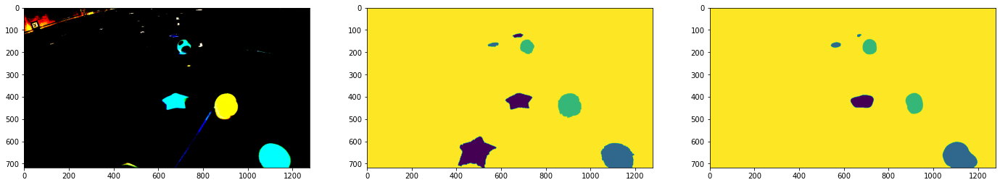

Epoch 18/50, step 40/43, loss = 0.01080


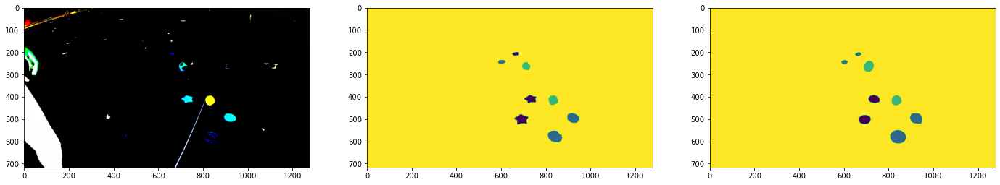

Epoch 19/50, step 5/43, loss = 0.12009


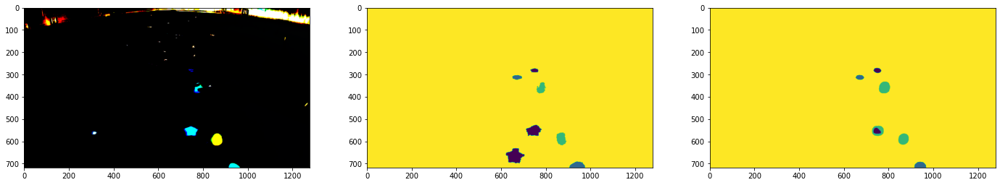

Epoch 19/50, step 10/43, loss = 0.03223


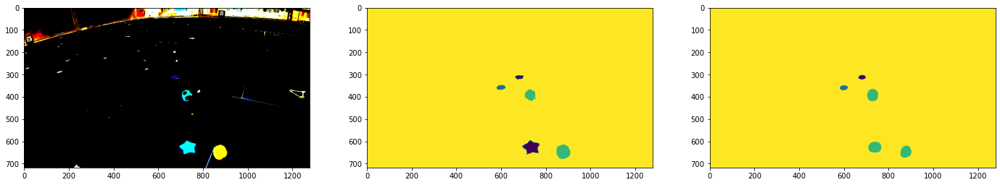

Epoch 19/50, step 15/43, loss = 0.01713


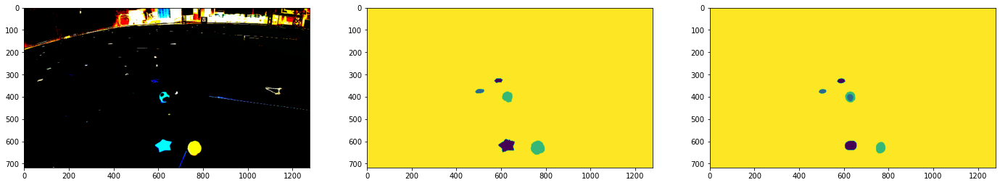

Epoch 19/50, step 20/43, loss = 0.06983


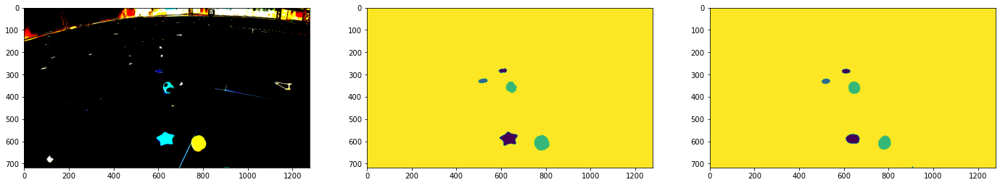

Epoch 19/50, step 25/43, loss = 0.01658


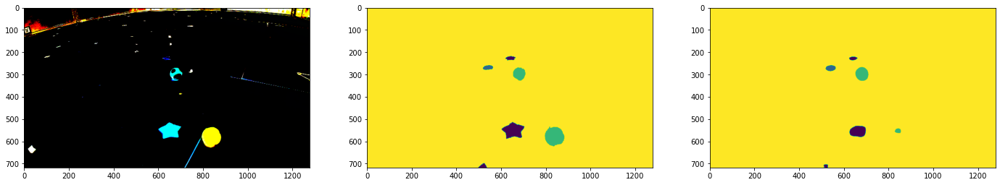

Epoch 19/50, step 30/43, loss = 0.02921


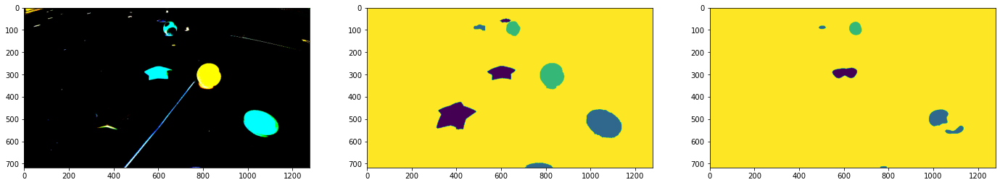

Epoch 19/50, step 35/43, loss = 0.01599


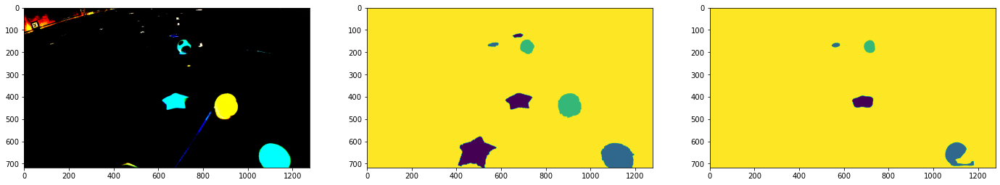

Epoch 19/50, step 40/43, loss = 0.01245


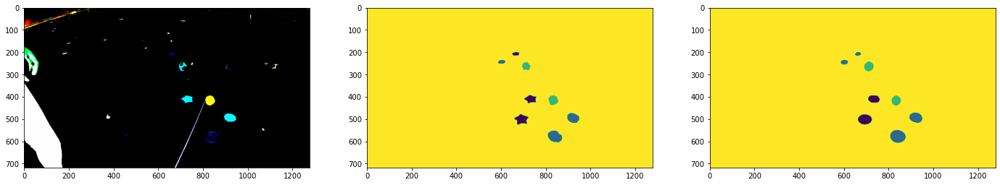

Epoch 20/50, step 5/43, loss = 0.01144


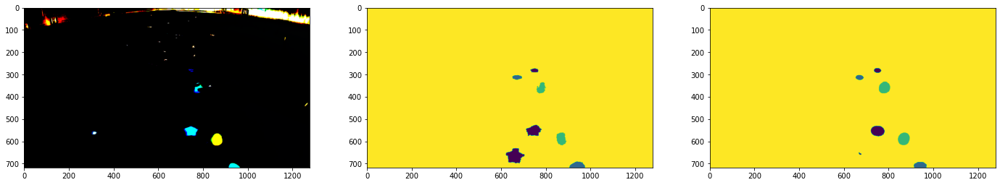

Epoch 20/50, step 10/43, loss = 0.01056


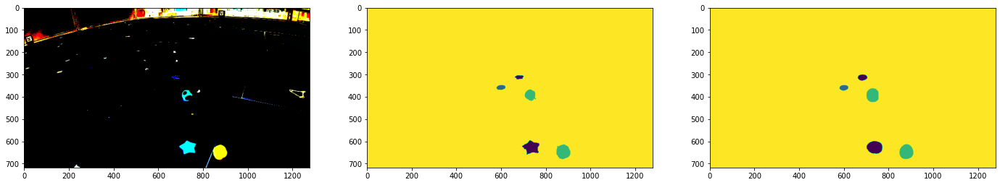

Epoch 20/50, step 15/43, loss = 0.00942


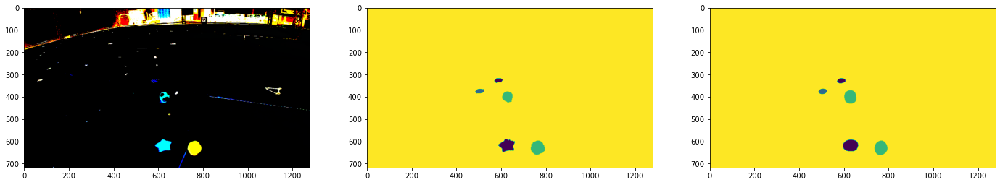

Epoch 20/50, step 20/43, loss = 0.00859


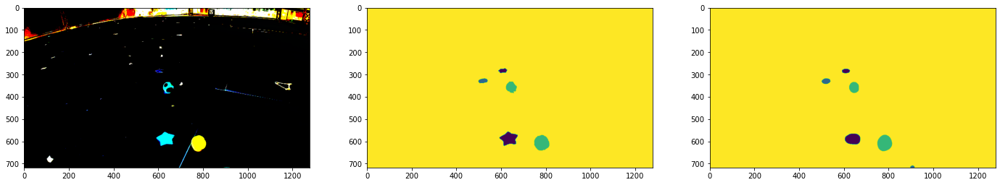

Epoch 20/50, step 25/43, loss = 0.00883


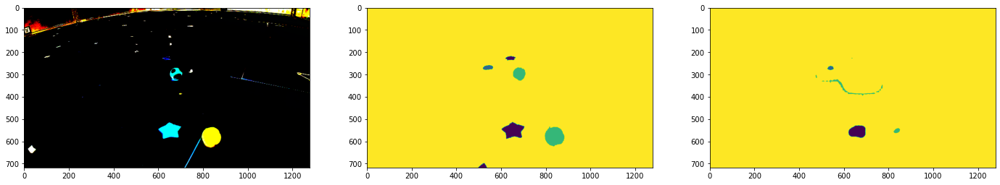

Epoch 20/50, step 30/43, loss = 0.05238


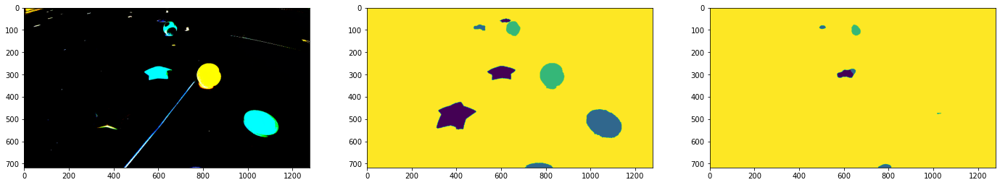

Epoch 20/50, step 35/43, loss = 0.01799


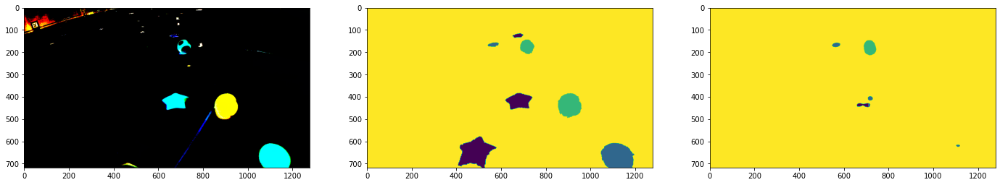

Epoch 20/50, step 40/43, loss = 0.01417


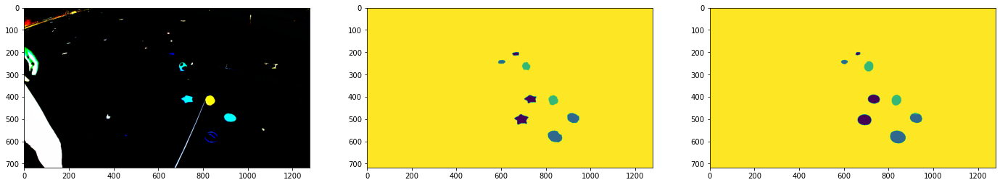

Epoch 21/50, step 5/43, loss = 0.01502


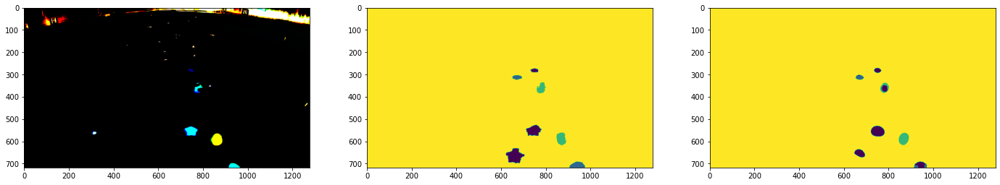

Epoch 21/50, step 10/43, loss = 0.01020


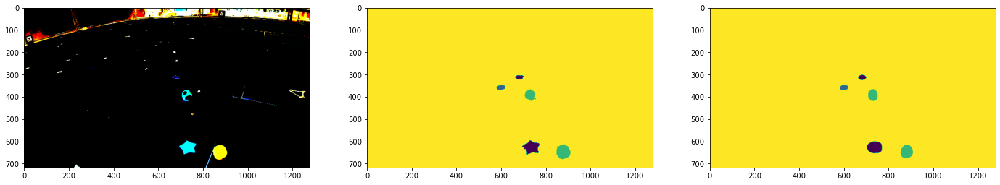

Epoch 21/50, step 15/43, loss = 0.01125


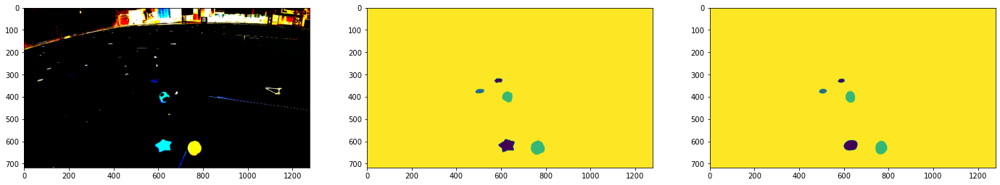

Epoch 21/50, step 20/43, loss = 0.01019


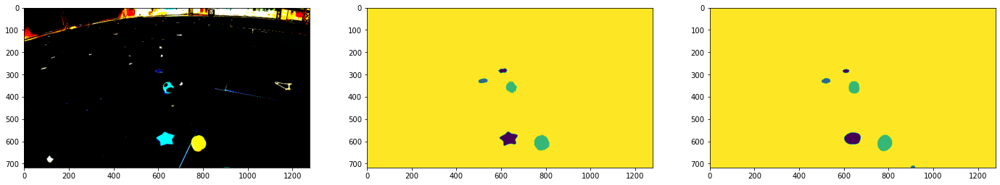

Epoch 21/50, step 25/43, loss = 0.01109


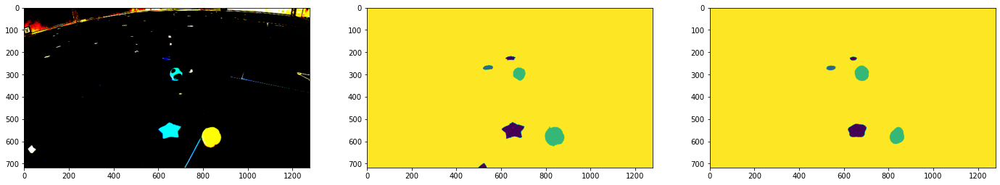

Epoch 21/50, step 30/43, loss = 0.01900


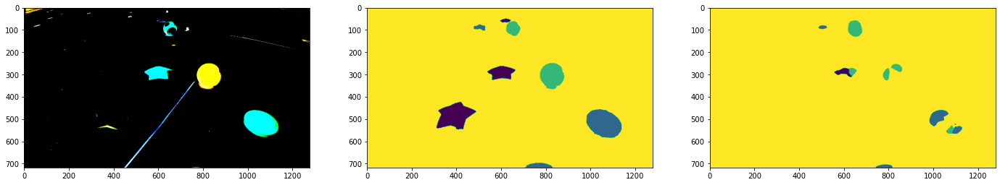

Epoch 21/50, step 35/43, loss = 0.09025


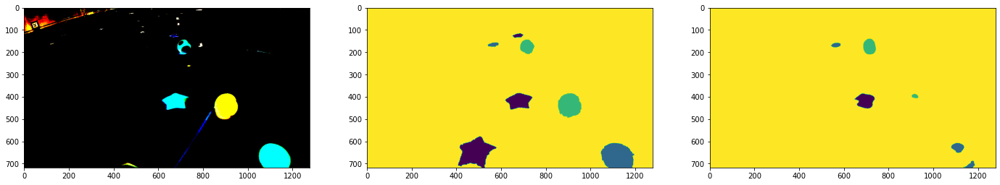

Epoch 21/50, step 40/43, loss = 0.01913


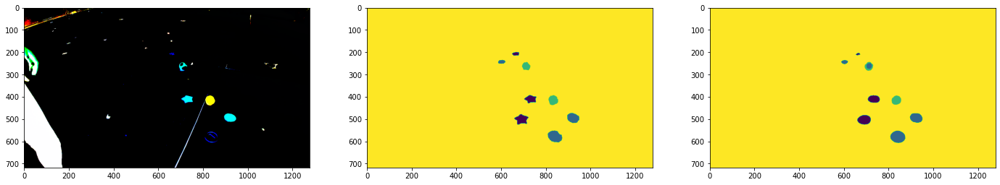

Epoch 22/50, step 5/43, loss = 0.01541


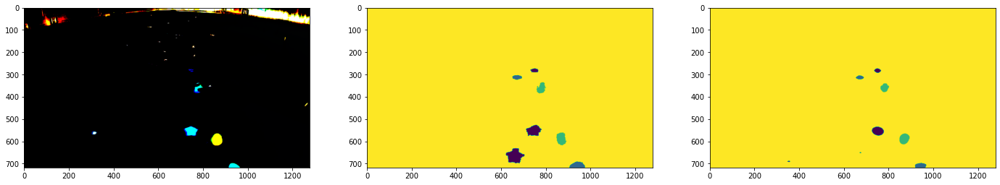

Epoch 22/50, step 10/43, loss = 0.01087


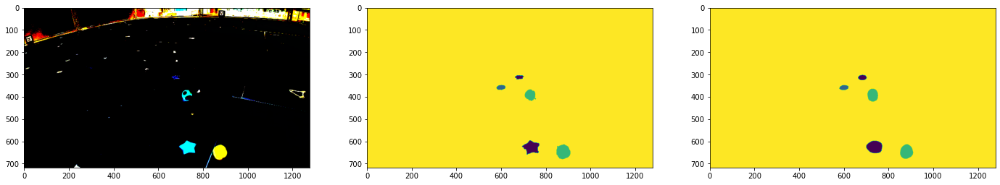

Epoch 22/50, step 15/43, loss = 0.00834


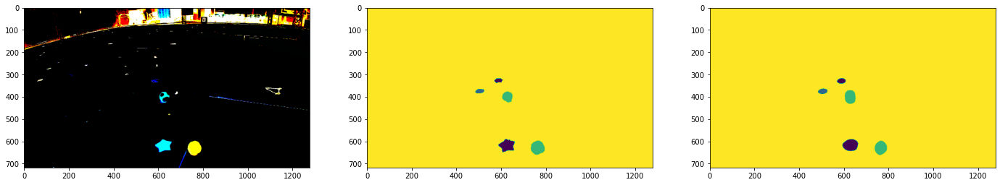

Epoch 22/50, step 20/43, loss = 0.01108


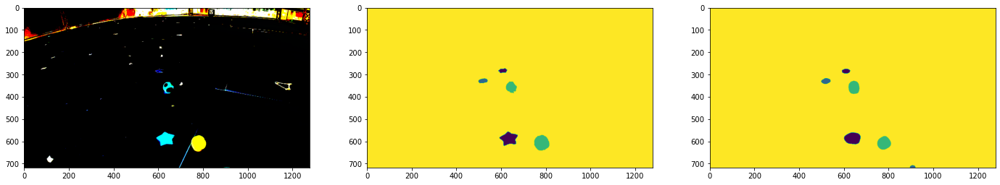

Epoch 22/50, step 25/43, loss = 0.00977


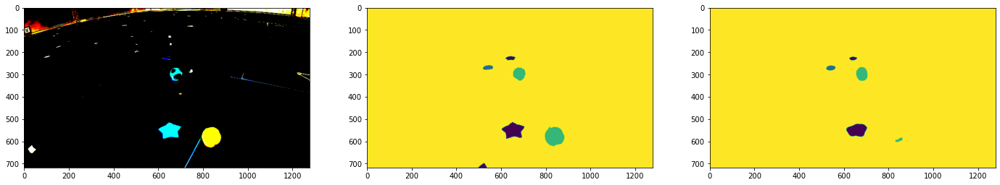

Epoch 22/50, step 30/43, loss = 0.01185


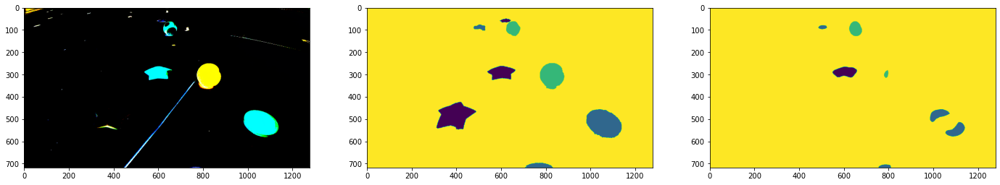

Epoch 22/50, step 35/43, loss = 0.00976


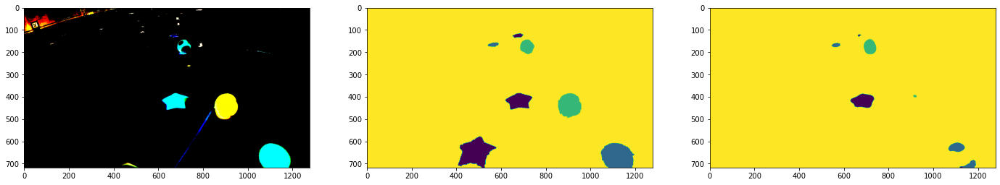

Epoch 22/50, step 40/43, loss = 0.00939


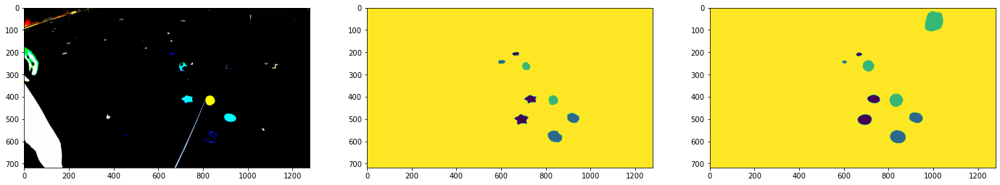

Epoch 23/50, step 5/43, loss = 0.01383


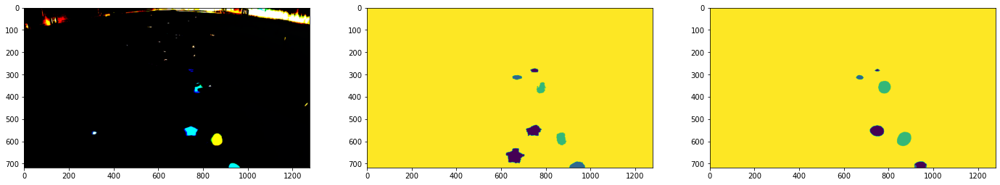

Epoch 23/50, step 10/43, loss = 0.16438


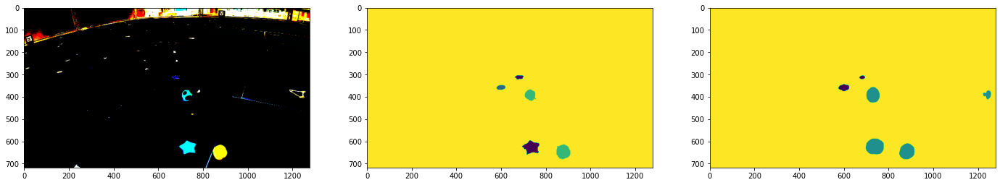

Epoch 23/50, step 15/43, loss = 0.01896


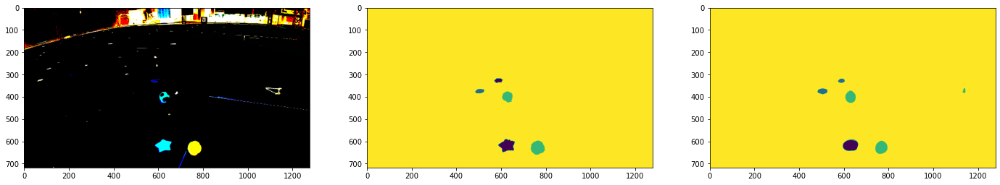

Epoch 23/50, step 20/43, loss = 0.01248


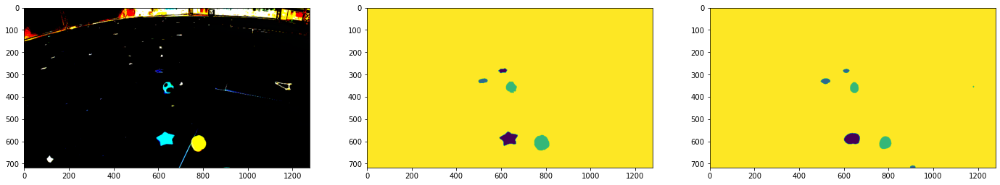

Epoch 23/50, step 25/43, loss = 0.01037


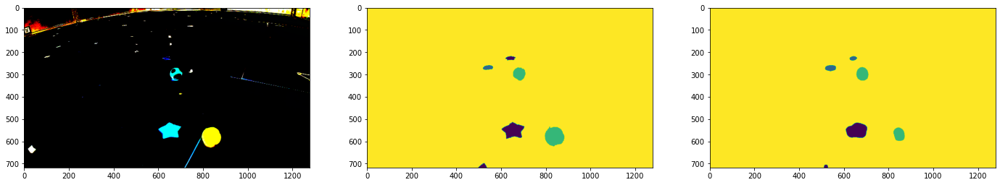

Epoch 23/50, step 30/43, loss = 0.01085


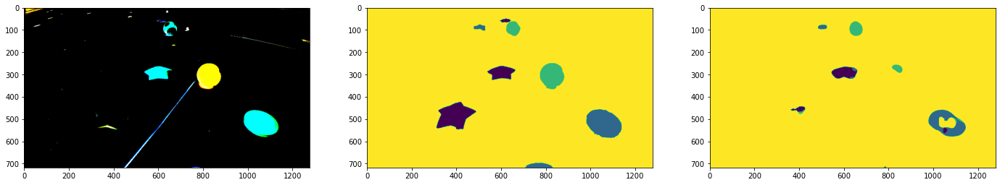

Epoch 23/50, step 35/43, loss = 0.01071


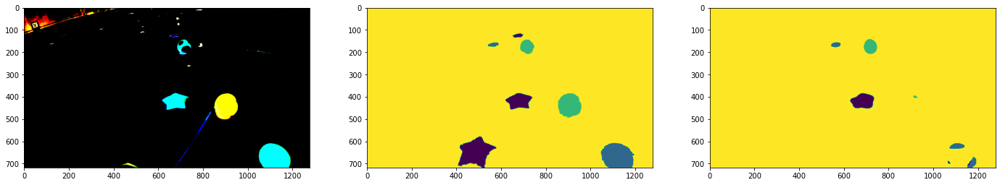

Epoch 23/50, step 40/43, loss = 0.01124


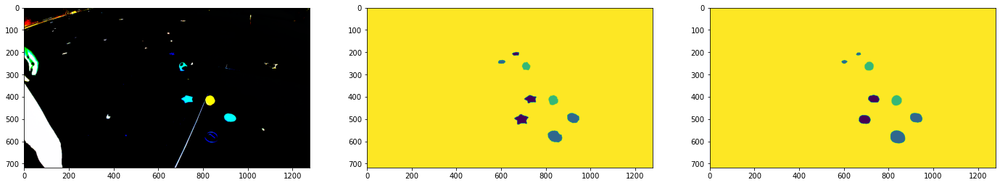

Epoch 24/50, step 5/43, loss = 0.00862


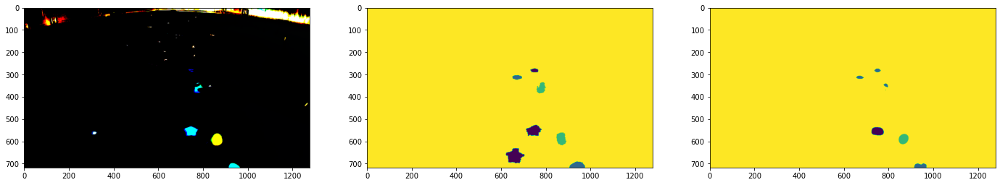

Epoch 24/50, step 10/43, loss = 0.01346


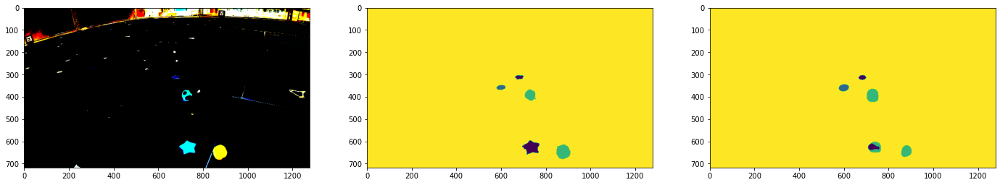

Epoch 24/50, step 15/43, loss = 0.02489


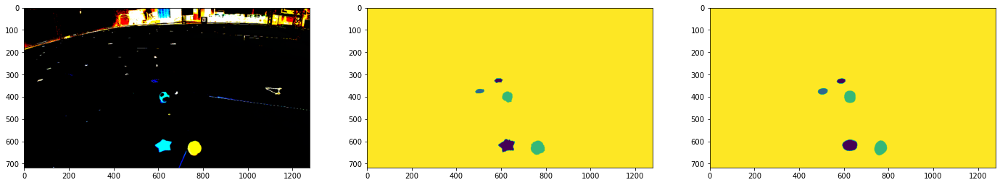

Epoch 24/50, step 20/43, loss = 0.01635


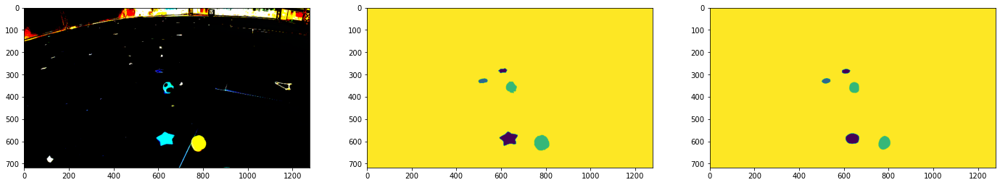

Epoch 24/50, step 25/43, loss = 0.02033


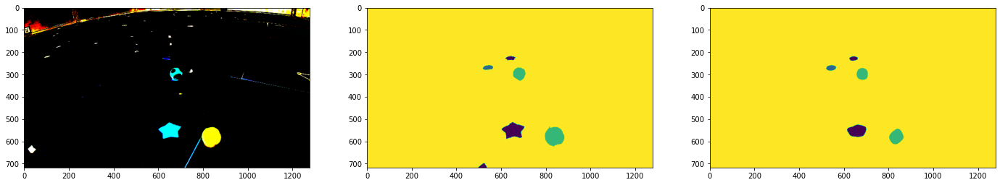

Epoch 24/50, step 30/43, loss = 0.01299


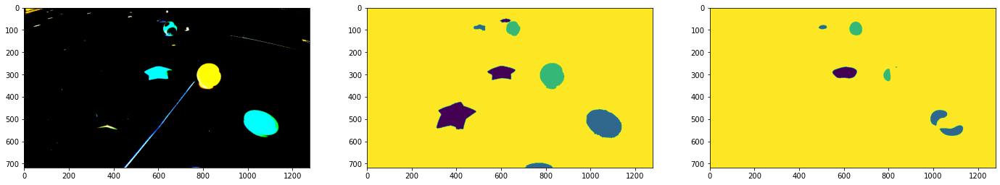

Epoch 24/50, step 35/43, loss = 0.01145


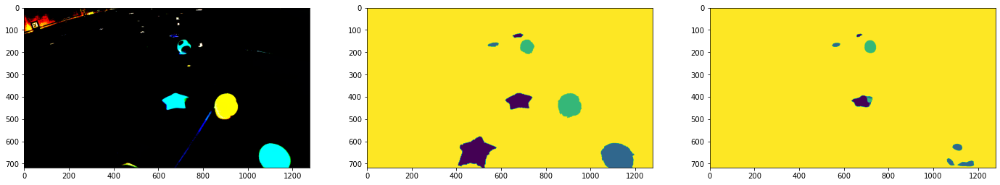

Epoch 24/50, step 40/43, loss = 0.01321


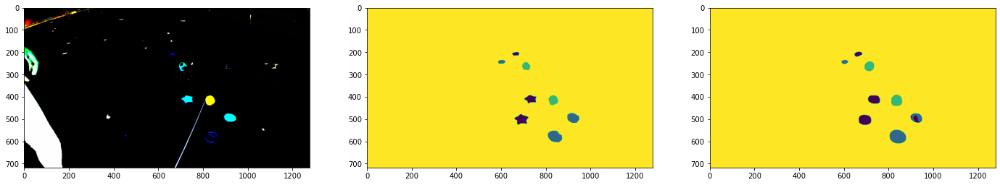

Epoch 25/50, step 5/43, loss = 0.01398


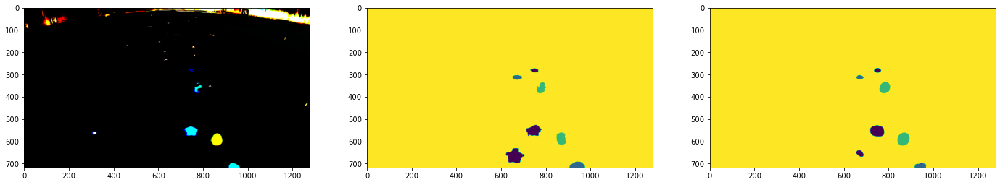

Epoch 25/50, step 10/43, loss = 0.01053


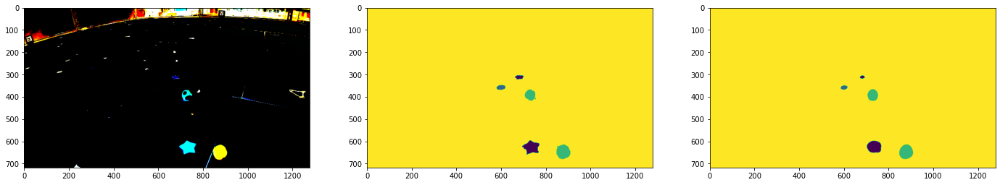

Epoch 25/50, step 15/43, loss = 0.01363


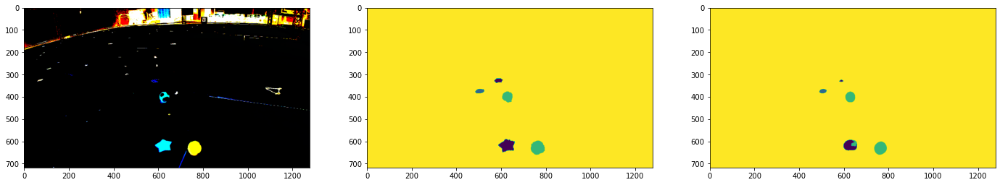

Epoch 25/50, step 20/43, loss = 0.02338


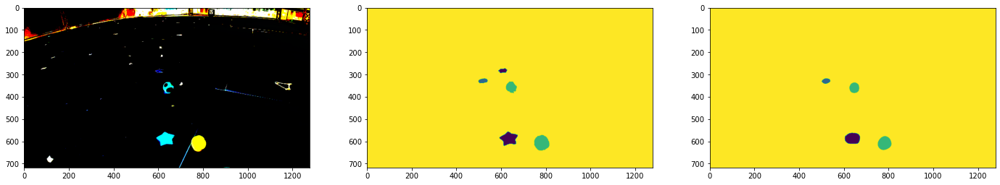

Epoch 25/50, step 25/43, loss = 0.02193


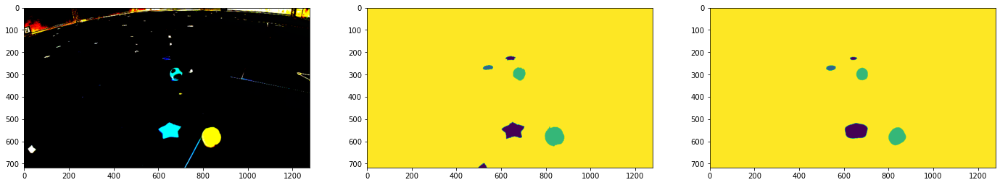

Epoch 25/50, step 30/43, loss = 0.00892


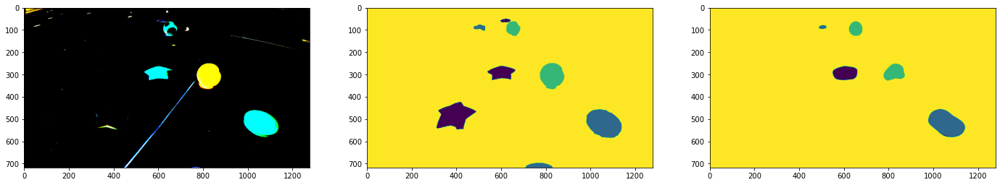

Epoch 25/50, step 35/43, loss = 0.00961


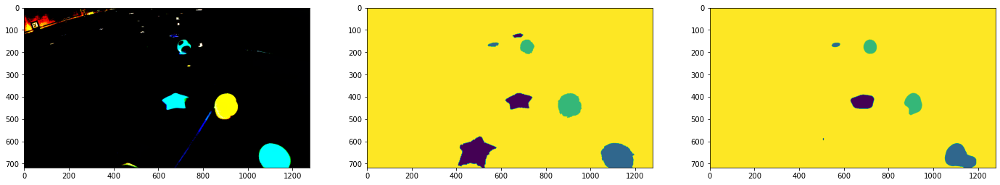

Epoch 25/50, step 40/43, loss = 0.00828


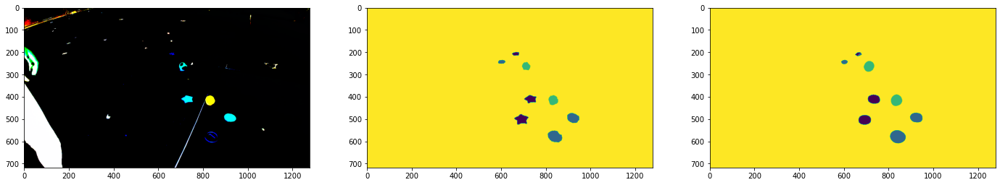

Epoch 26/50, step 5/43, loss = 0.01045


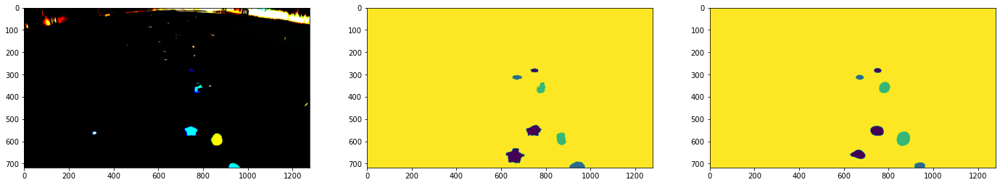

Epoch 26/50, step 10/43, loss = 0.00723


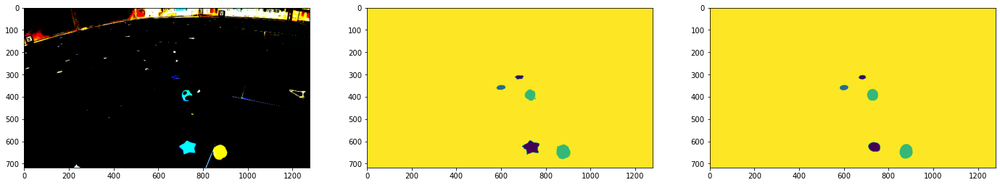

Epoch 26/50, step 15/43, loss = 0.00850


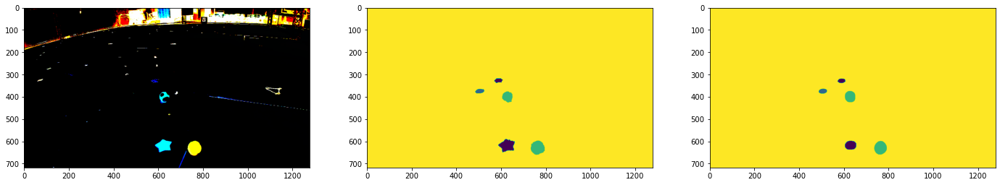

Epoch 26/50, step 20/43, loss = 0.00804


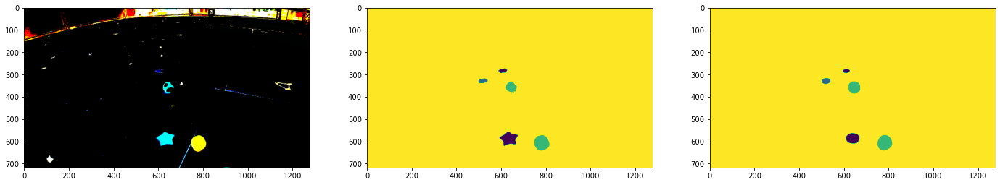

Epoch 26/50, step 25/43, loss = 0.00807


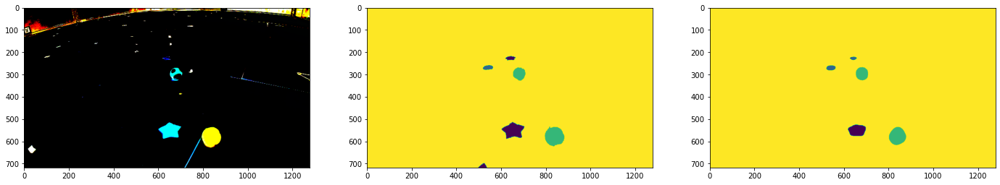

Epoch 26/50, step 30/43, loss = 0.00942


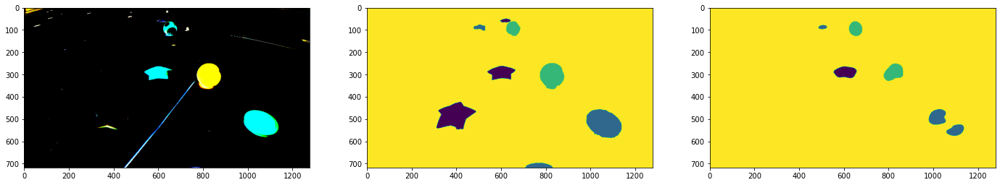

Epoch 26/50, step 35/43, loss = 0.01042


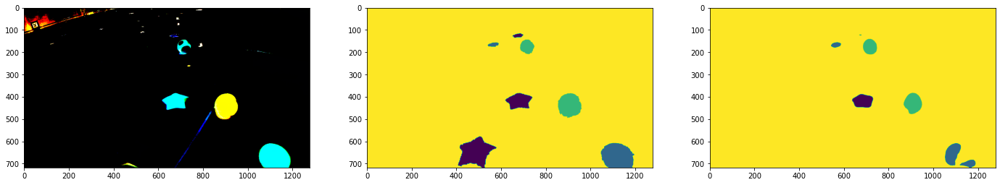

Epoch 26/50, step 40/43, loss = 0.00664


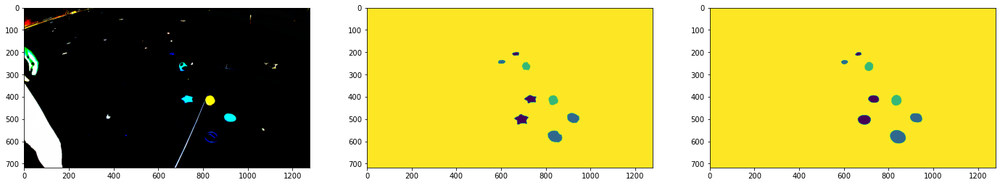

Epoch 27/50, step 5/43, loss = 0.00758


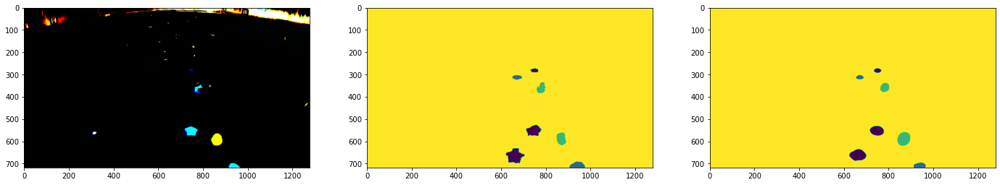

Epoch 27/50, step 10/43, loss = 0.00659


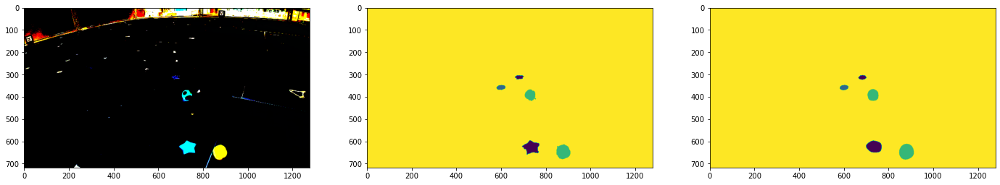

Epoch 27/50, step 15/43, loss = 0.00782


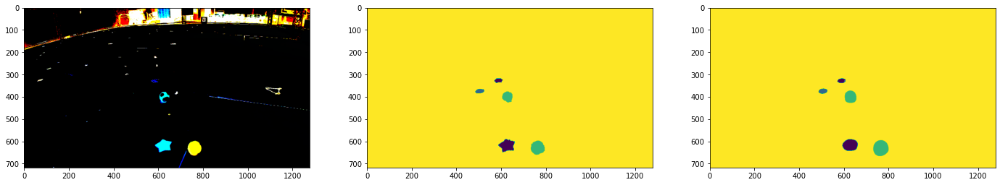

Epoch 27/50, step 20/43, loss = 0.00696


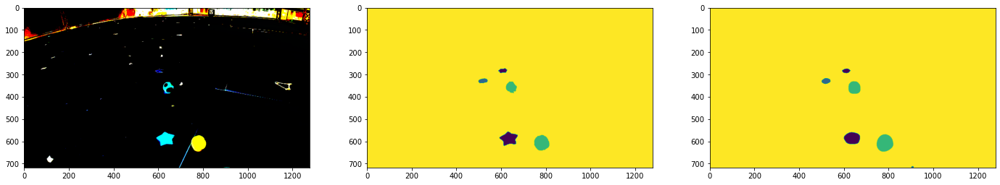

Epoch 27/50, step 25/43, loss = 0.00831


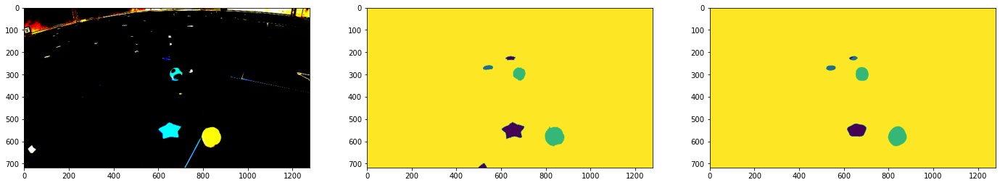

Epoch 27/50, step 30/43, loss = 0.00941


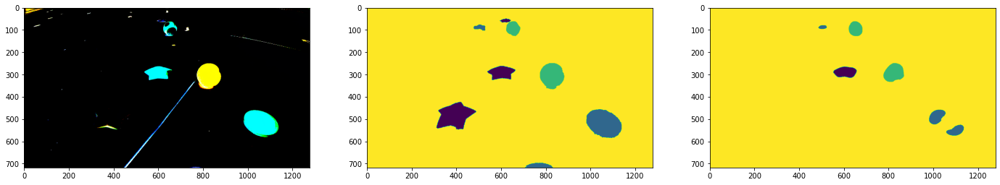

Epoch 27/50, step 35/43, loss = 0.00660


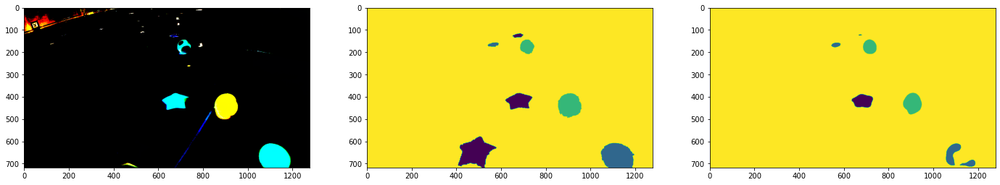

Epoch 27/50, step 40/43, loss = 0.00615


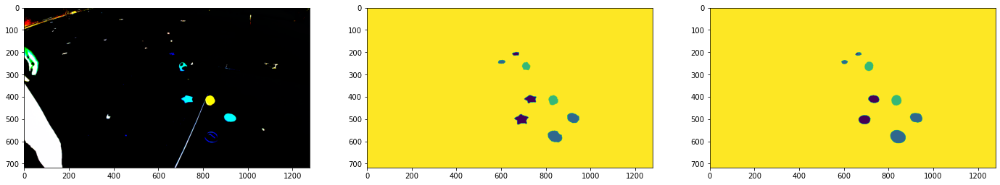

Epoch 28/50, step 5/43, loss = 0.00673


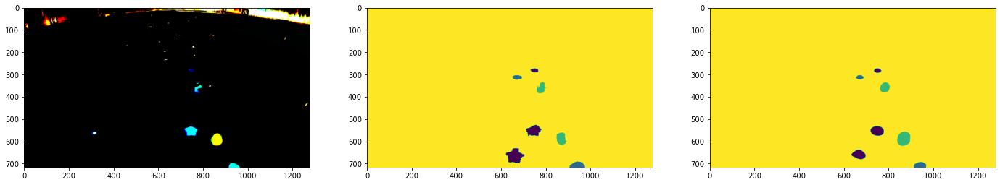

Epoch 28/50, step 10/43, loss = 0.00604


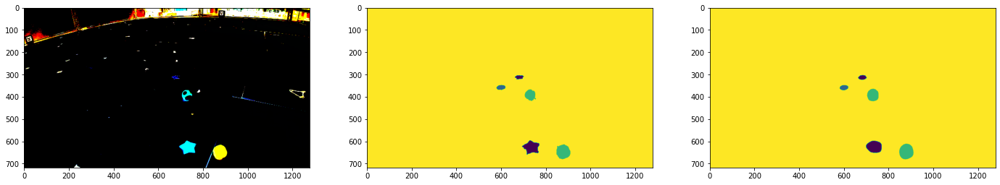

Epoch 28/50, step 15/43, loss = 0.00676


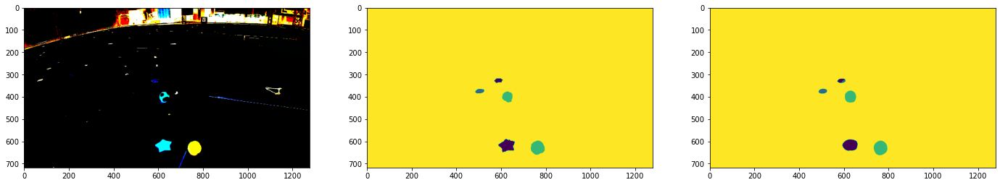

Epoch 28/50, step 20/43, loss = 0.00686


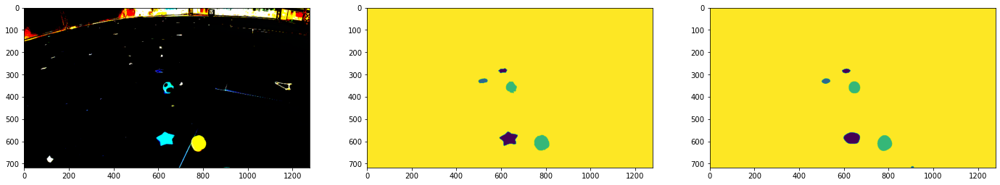

Epoch 28/50, step 25/43, loss = 0.00583


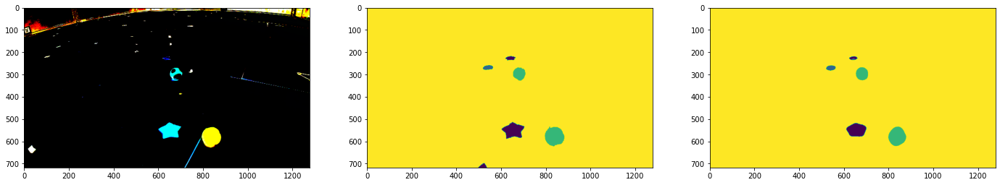

Epoch 28/50, step 30/43, loss = 0.00831


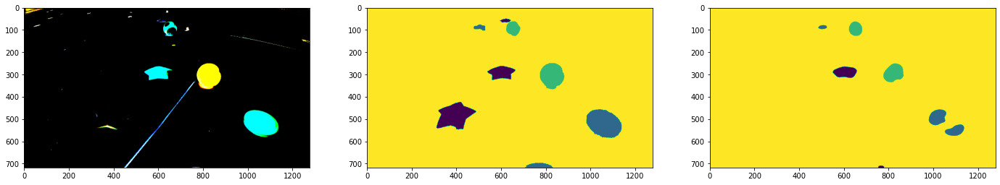

Epoch 28/50, step 35/43, loss = 0.00472


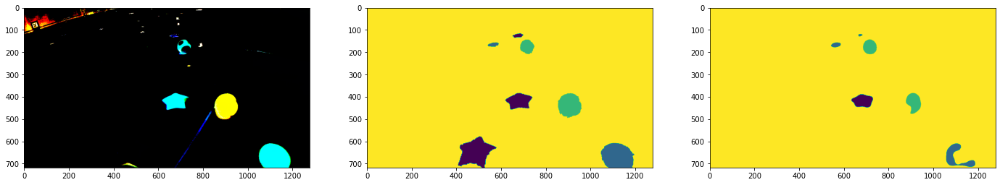

Epoch 28/50, step 40/43, loss = 0.00681


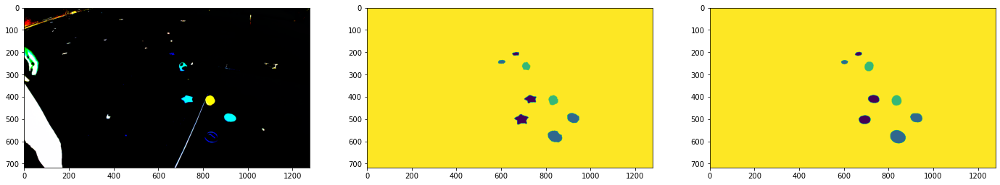

Epoch 29/50, step 5/43, loss = 0.00605


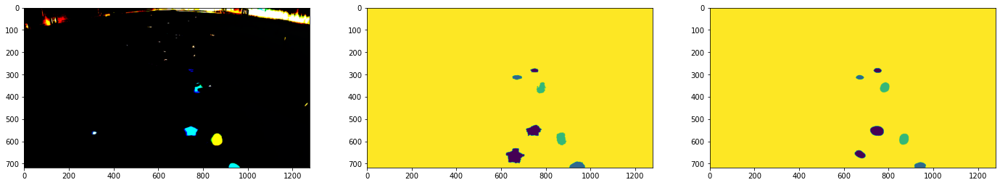

Epoch 29/50, step 10/43, loss = 0.00760


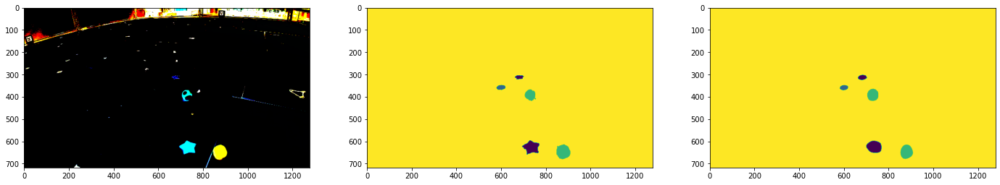

Epoch 29/50, step 15/43, loss = 0.00641


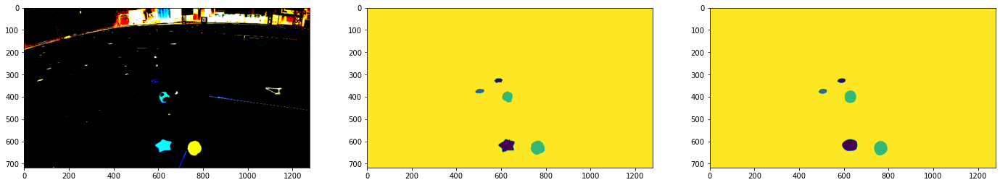

Epoch 29/50, step 20/43, loss = 0.00753


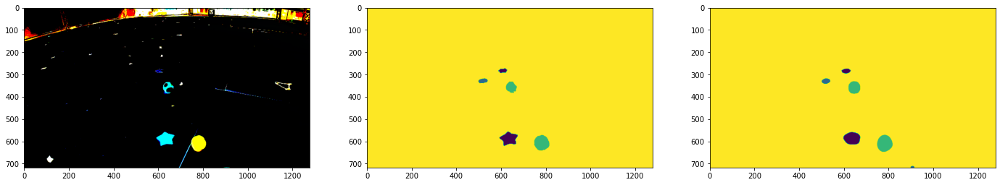

Epoch 29/50, step 25/43, loss = 0.00570


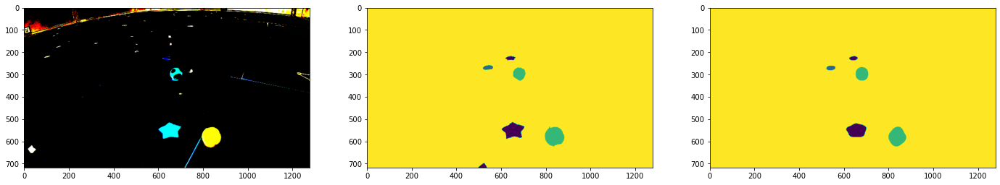

Epoch 29/50, step 30/43, loss = 0.00827


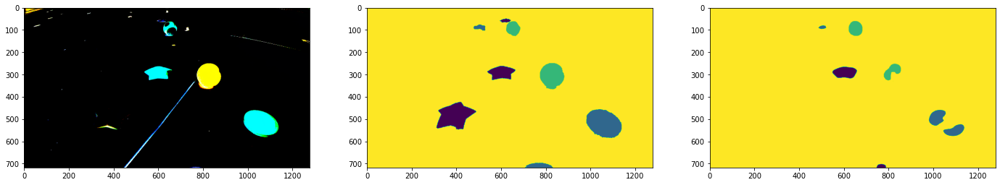

Epoch 29/50, step 35/43, loss = 0.00461


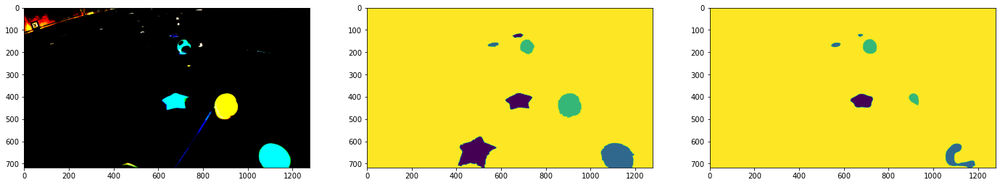

Epoch 29/50, step 40/43, loss = 0.00444


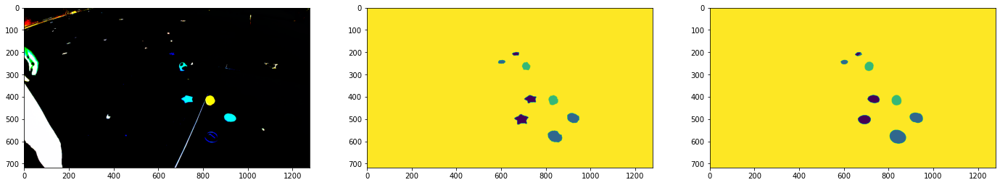

Epoch 30/50, step 5/43, loss = 0.00618


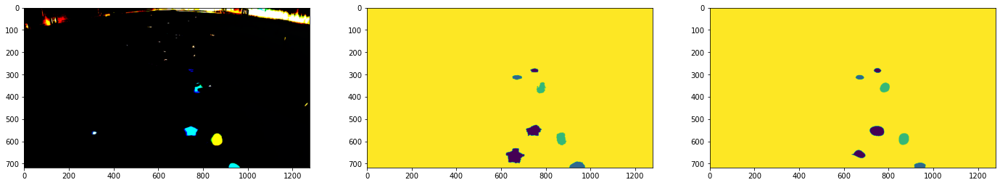

Epoch 30/50, step 10/43, loss = 0.00499


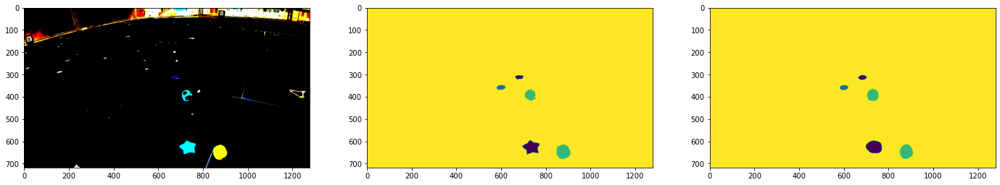

Epoch 30/50, step 15/43, loss = 0.00610


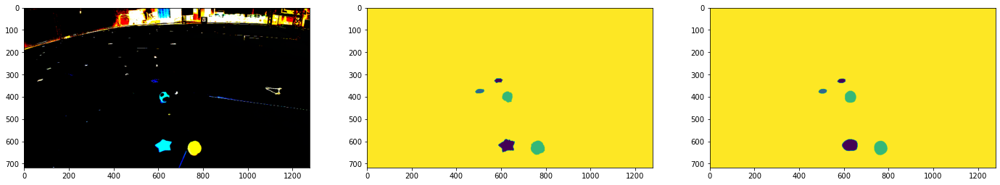

Epoch 30/50, step 20/43, loss = 0.00714


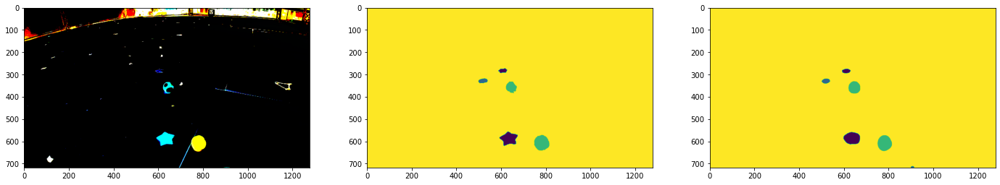

Epoch 30/50, step 25/43, loss = 0.00666


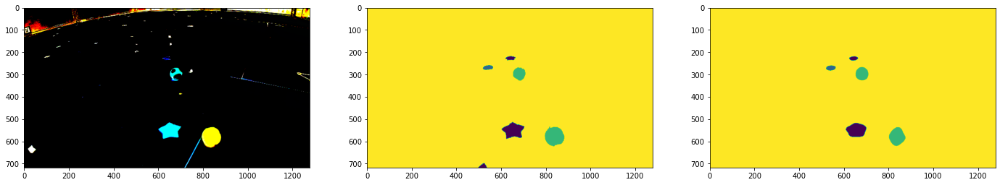

Epoch 30/50, step 30/43, loss = 0.00413


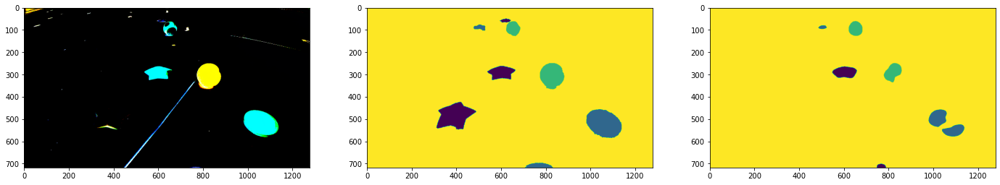

Epoch 30/50, step 35/43, loss = 0.00569


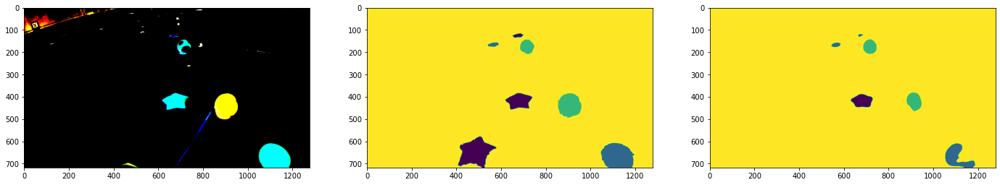

Epoch 30/50, step 40/43, loss = 0.00546


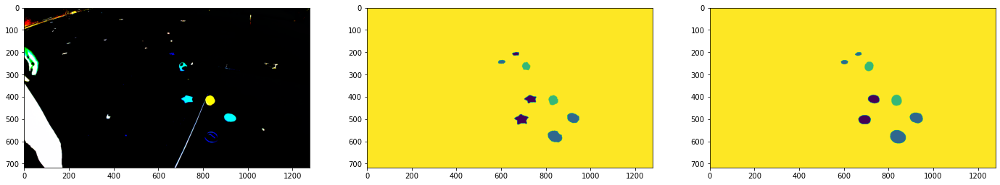

Epoch 31/50, step 5/43, loss = 0.00437


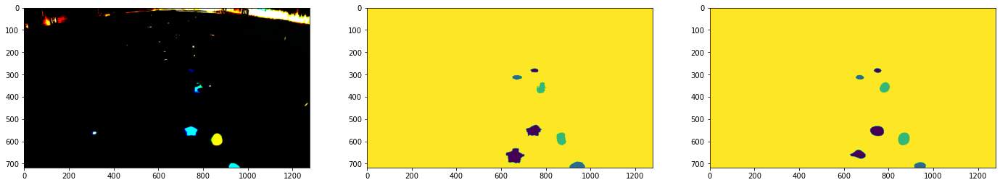

Epoch 31/50, step 10/43, loss = 0.00531


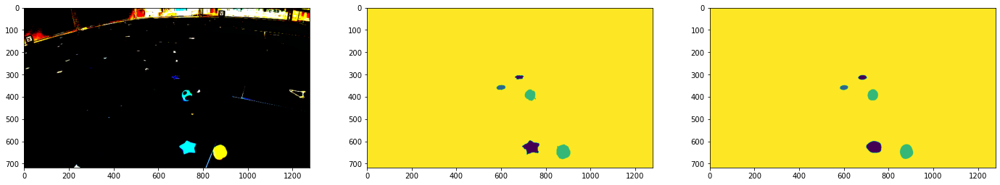

Epoch 31/50, step 15/43, loss = 0.00539


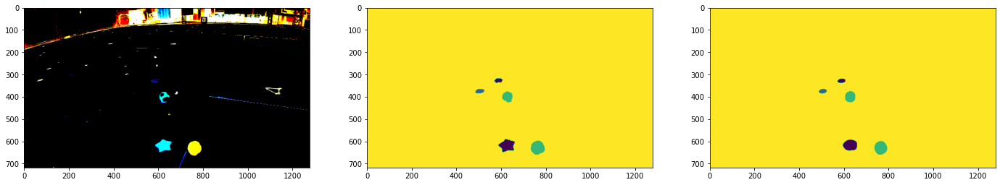

Epoch 31/50, step 20/43, loss = 0.13100


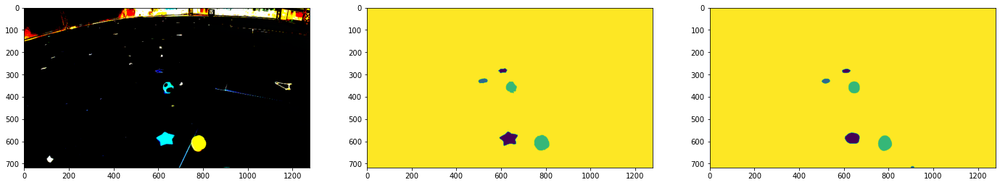

Epoch 31/50, step 25/43, loss = 0.00396


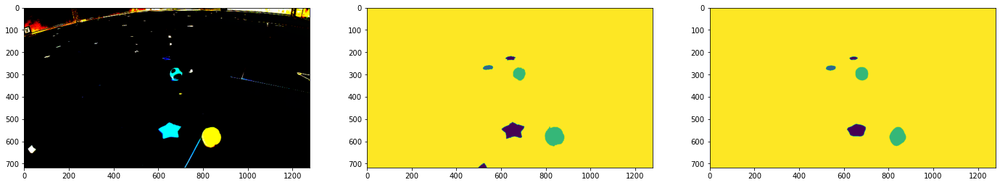

Epoch 31/50, step 30/43, loss = 0.00508


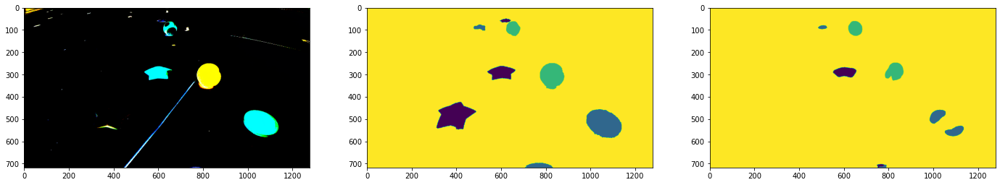

Epoch 31/50, step 35/43, loss = 0.00637


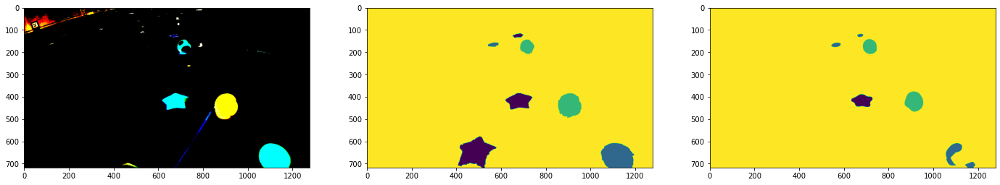

Epoch 31/50, step 40/43, loss = 0.00764


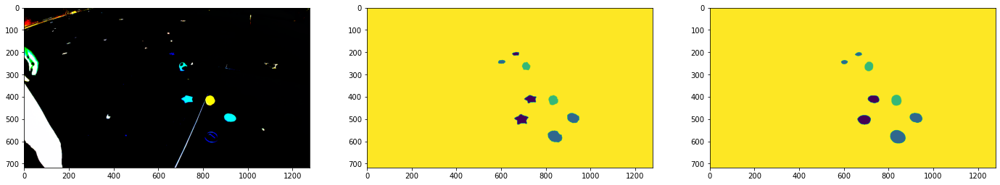

Epoch 32/50, step 5/43, loss = 0.00519


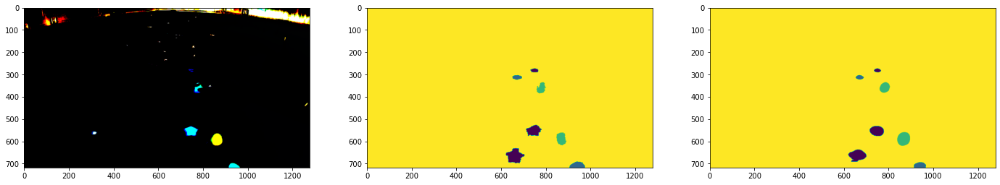

Epoch 32/50, step 10/43, loss = 0.00768


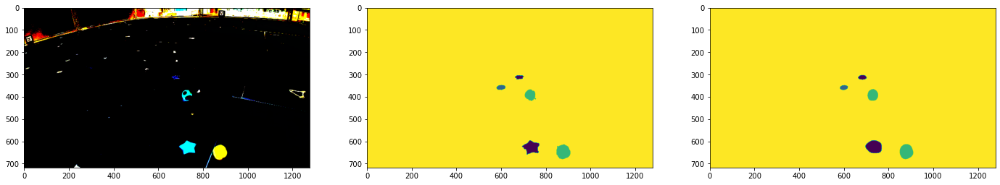

Epoch 32/50, step 15/43, loss = 0.00463


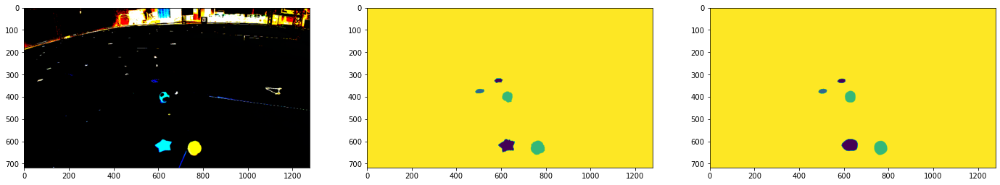

Epoch 32/50, step 20/43, loss = 0.00484


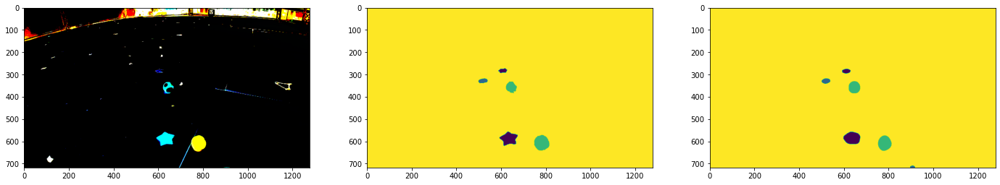

Epoch 32/50, step 25/43, loss = 0.00543


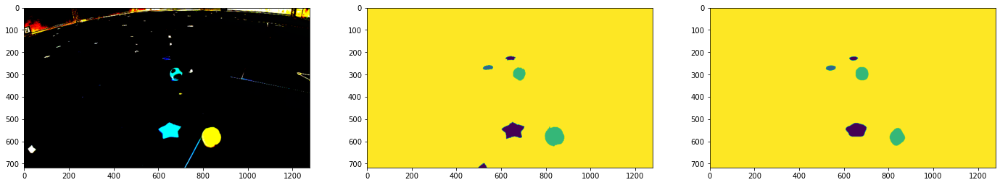

Epoch 32/50, step 30/43, loss = 0.00615


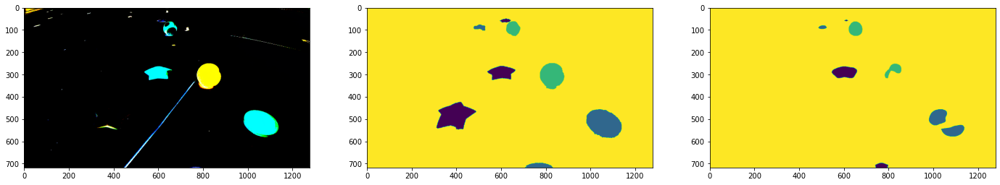

Epoch 32/50, step 35/43, loss = 0.00414


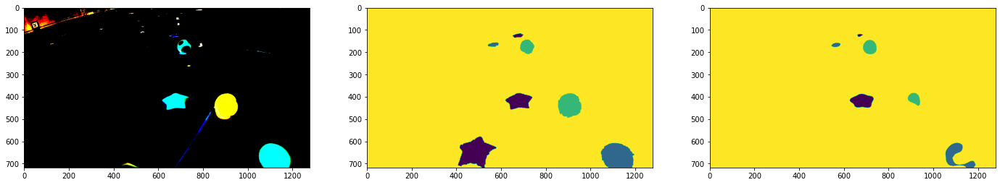

Epoch 32/50, step 40/43, loss = 0.00576


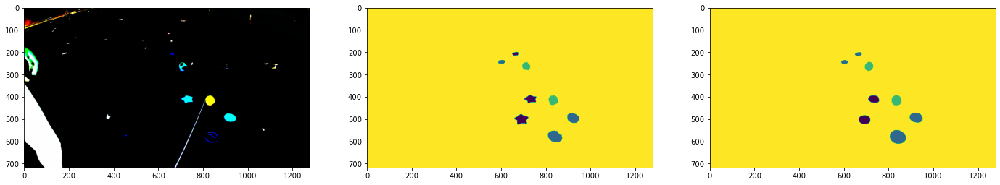

Epoch 33/50, step 5/43, loss = 0.00520


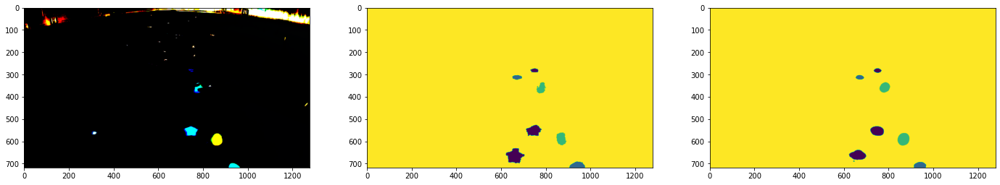

Epoch 33/50, step 10/43, loss = 0.00296


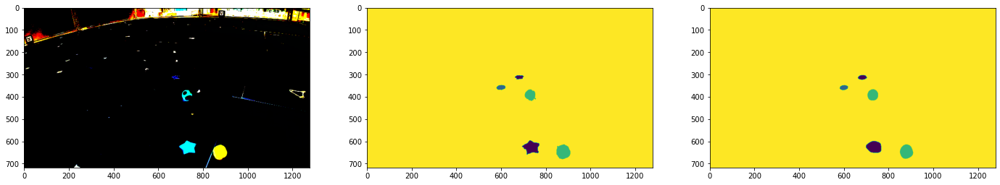

Epoch 33/50, step 15/43, loss = 0.00464


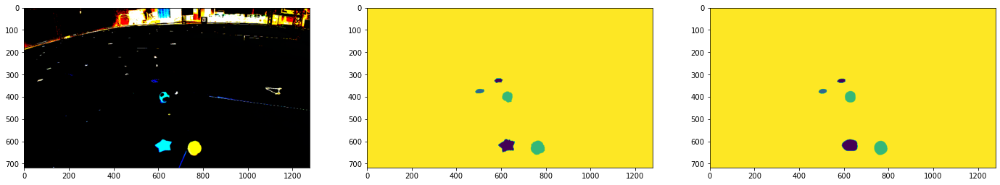

Epoch 33/50, step 20/43, loss = 0.00403


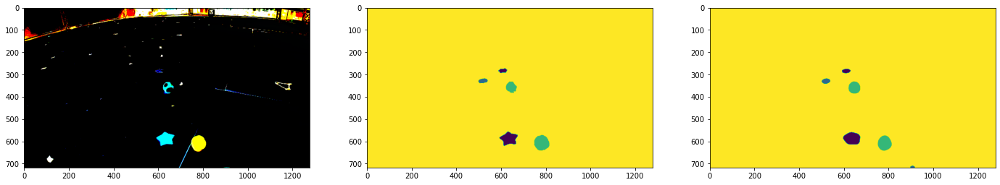

Epoch 33/50, step 25/43, loss = 0.00427


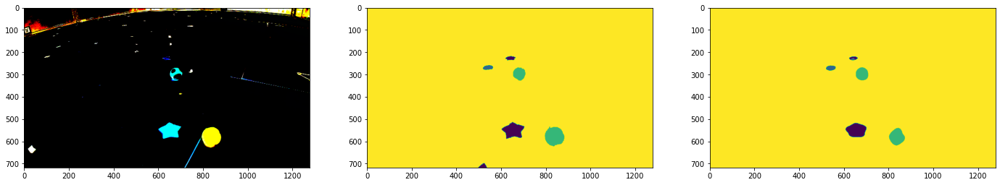

Epoch 33/50, step 30/43, loss = 0.00465


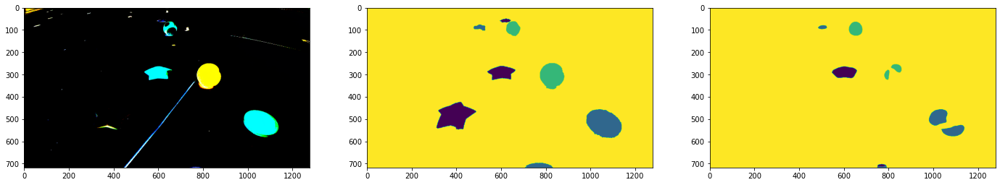

Epoch 33/50, step 35/43, loss = 0.00405


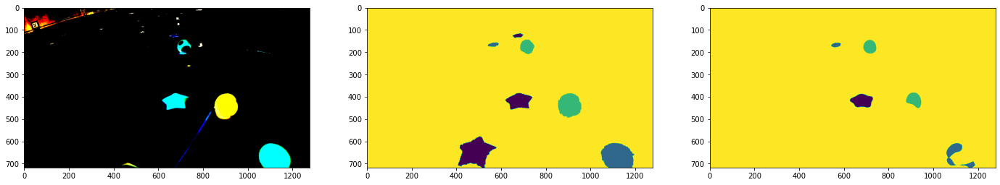

Epoch 33/50, step 40/43, loss = 0.00524


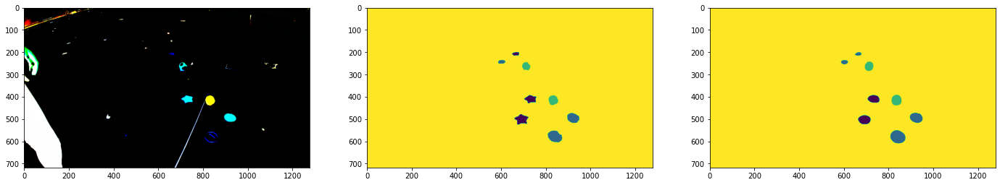

Epoch 34/50, step 5/43, loss = 0.00439


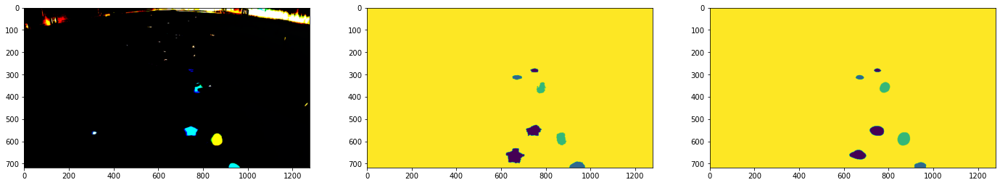

Epoch 34/50, step 10/43, loss = 0.00484


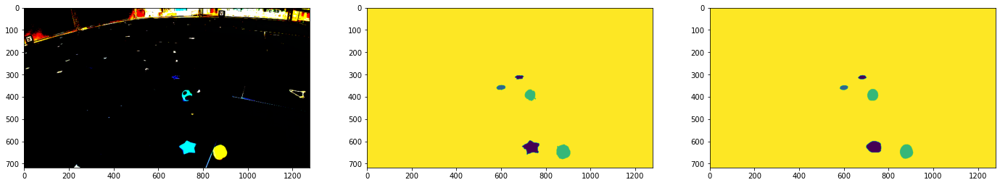

Epoch 34/50, step 15/43, loss = 0.00415


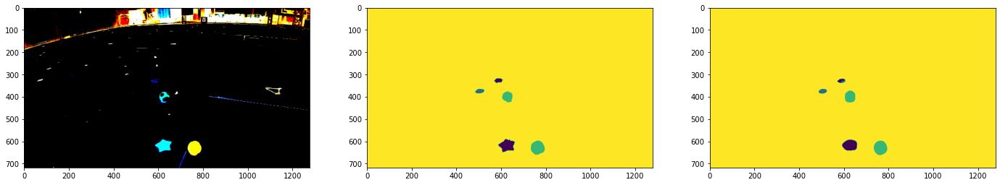

Epoch 34/50, step 20/43, loss = 0.00435


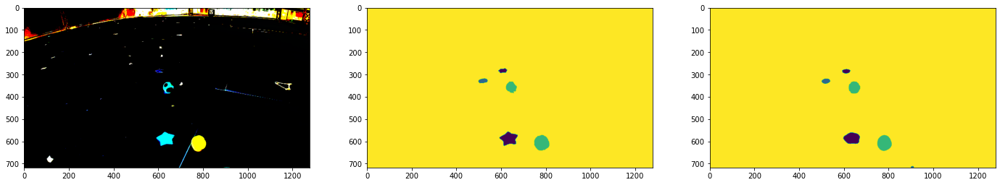

Epoch 34/50, step 25/43, loss = 0.00667


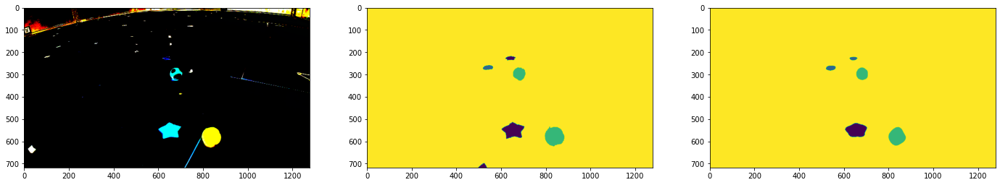

Epoch 34/50, step 30/43, loss = 0.00343


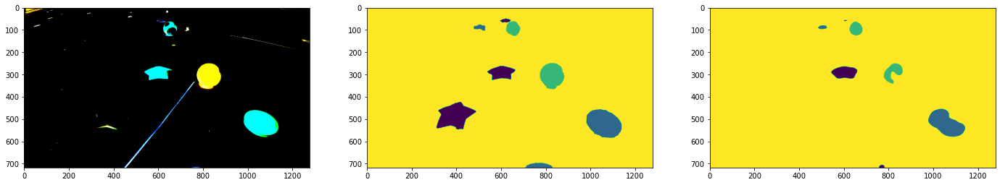

Epoch 34/50, step 35/43, loss = 0.00563


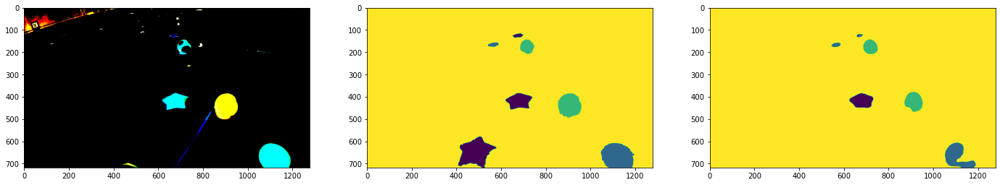

Epoch 34/50, step 40/43, loss = 0.00485


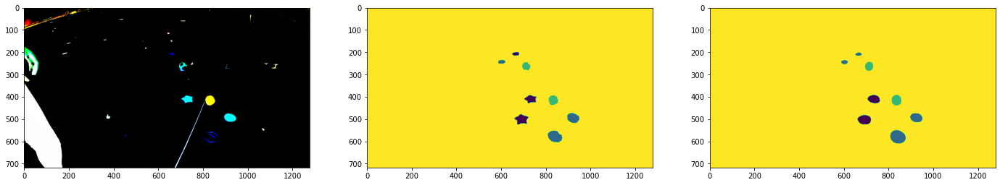

Epoch 35/50, step 5/43, loss = 0.00419


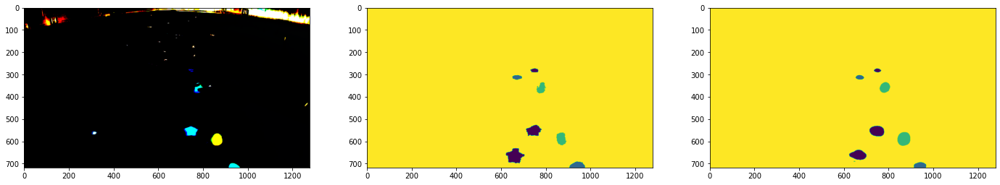

Epoch 35/50, step 10/43, loss = 0.00444


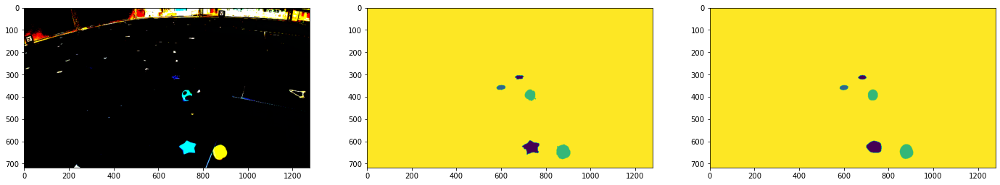

Epoch 35/50, step 15/43, loss = 0.00398


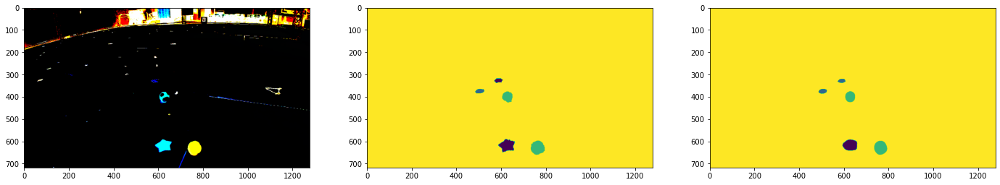

Epoch 35/50, step 20/43, loss = 0.00319


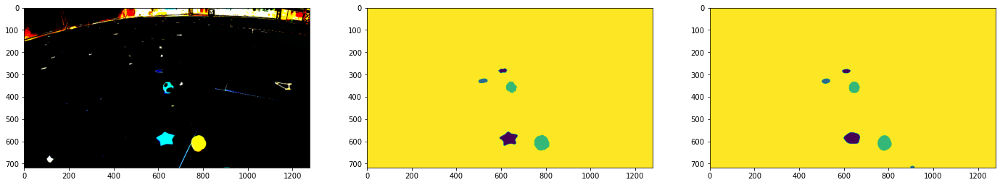

Epoch 35/50, step 25/43, loss = 0.00544


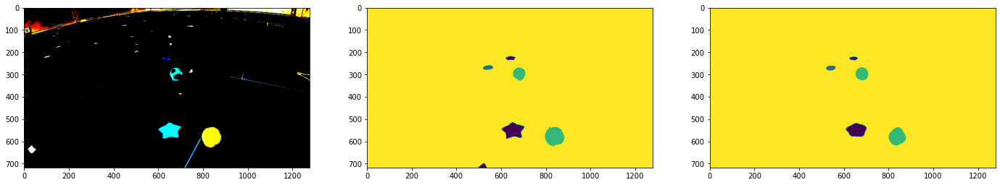

Epoch 35/50, step 30/43, loss = 0.00382


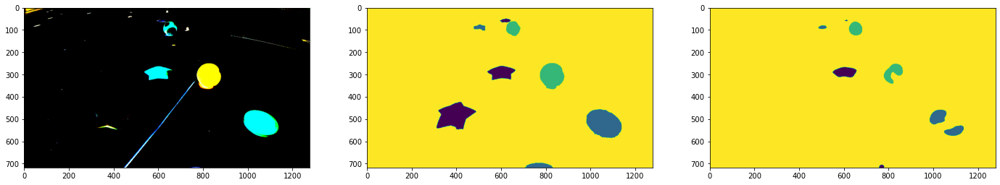

Epoch 35/50, step 35/43, loss = 0.00326


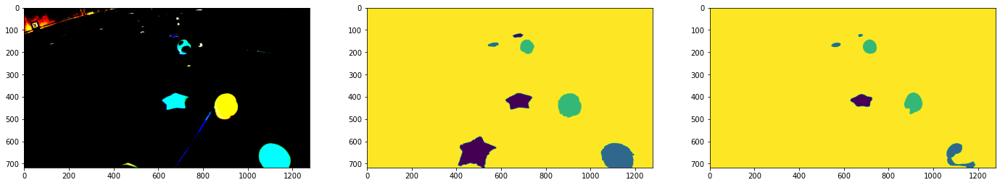

Epoch 35/50, step 40/43, loss = 0.00293


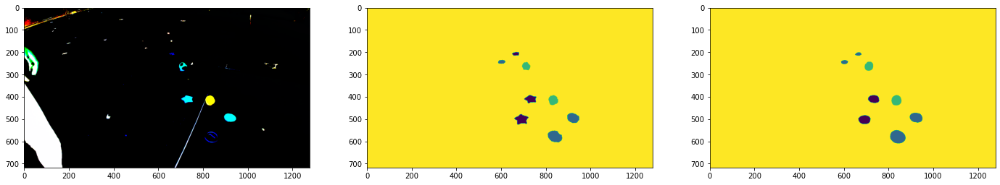

Epoch 36/50, step 5/43, loss = 0.00411


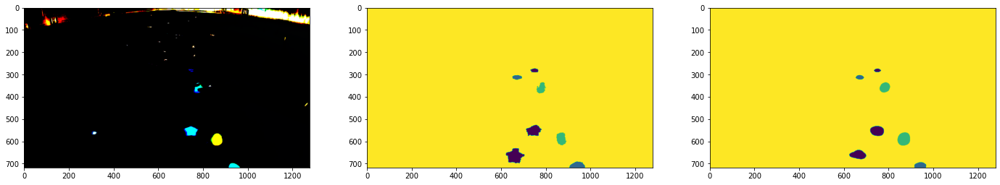

Epoch 36/50, step 10/43, loss = 0.00553


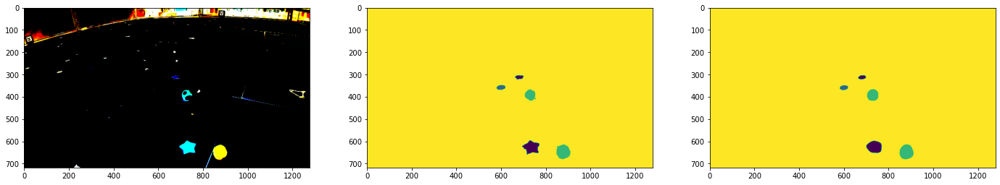

Epoch 36/50, step 15/43, loss = 0.00437


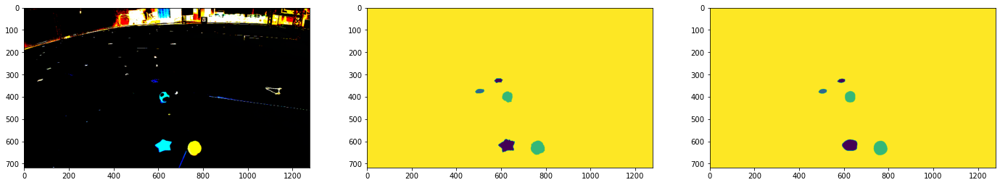

Epoch 36/50, step 20/43, loss = 0.00359


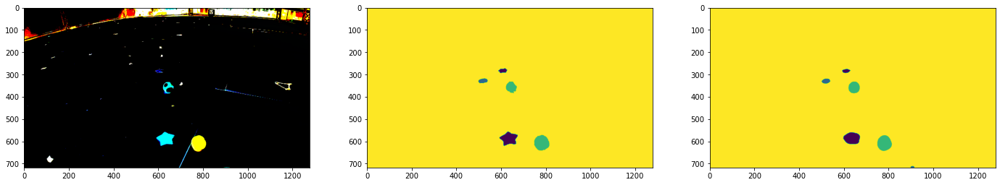

Epoch 36/50, step 25/43, loss = 0.00350


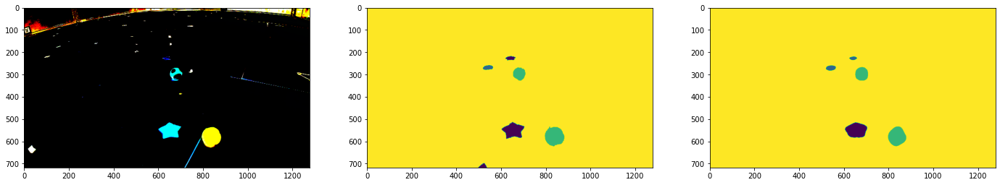

Epoch 36/50, step 30/43, loss = 0.00274


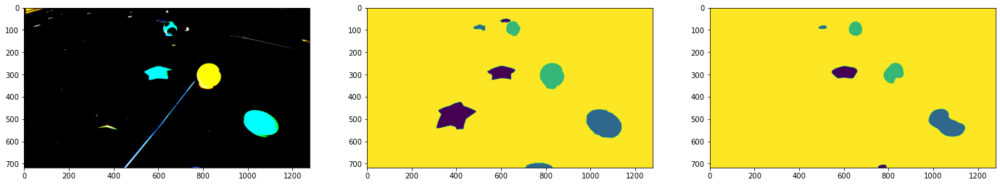

Epoch 36/50, step 35/43, loss = 0.00405


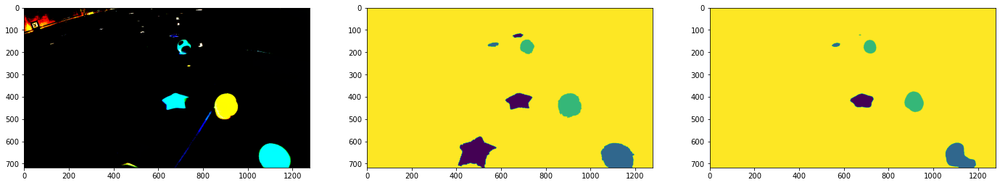

Epoch 36/50, step 40/43, loss = 0.00411


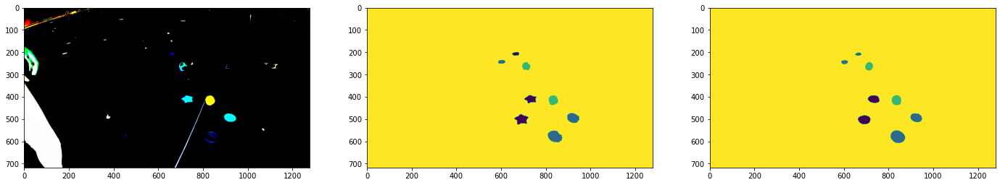

Epoch 37/50, step 5/43, loss = 0.00389


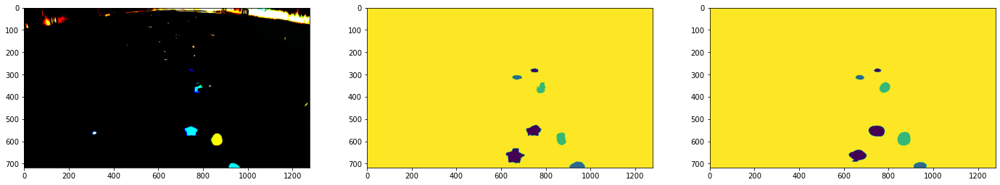

Epoch 37/50, step 10/43, loss = 0.00385


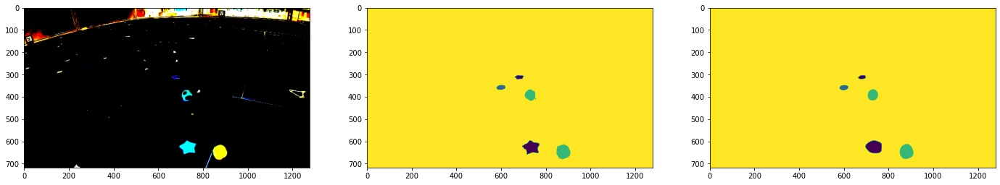

Epoch 37/50, step 15/43, loss = 0.00577


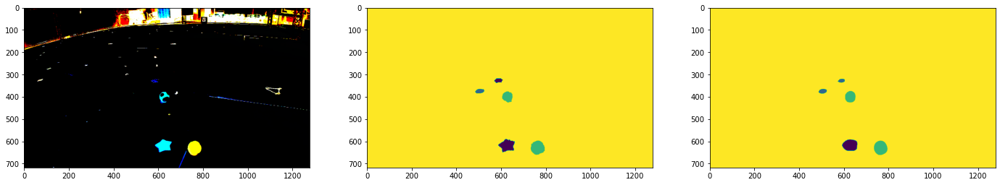

Epoch 37/50, step 20/43, loss = 0.00398


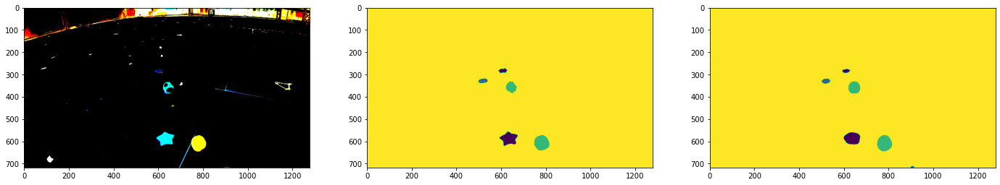

Epoch 37/50, step 25/43, loss = 0.00499


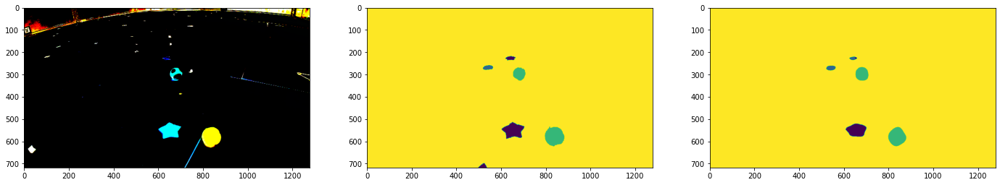

Epoch 37/50, step 30/43, loss = 0.00476


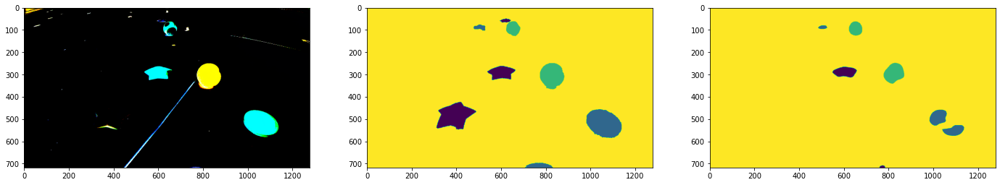

Epoch 37/50, step 35/43, loss = 0.00329


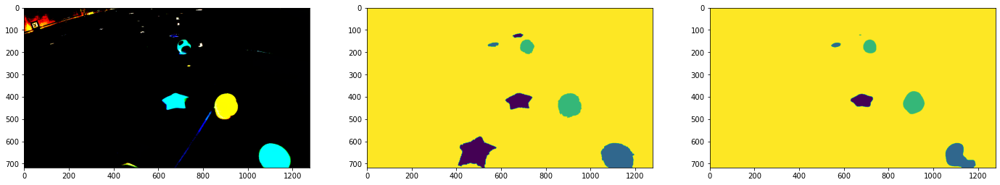

Epoch 37/50, step 40/43, loss = 0.00303


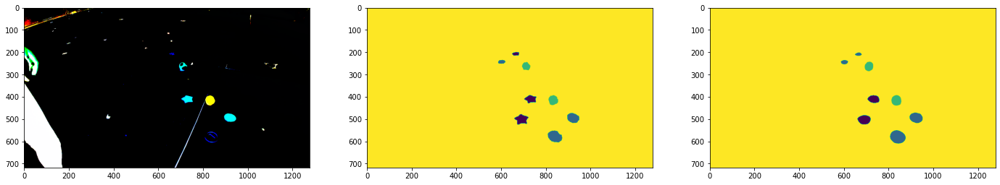

Epoch 38/50, step 5/43, loss = 0.00449


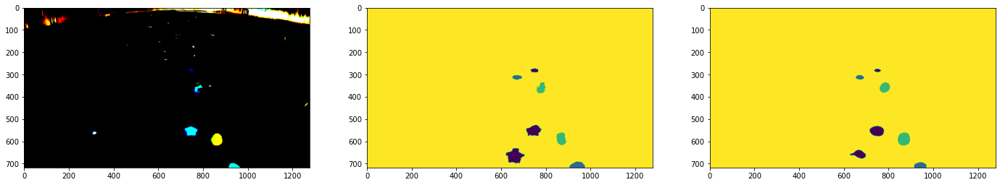

Epoch 38/50, step 10/43, loss = 0.00381


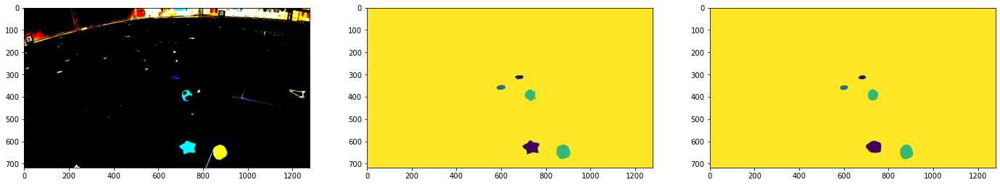

Epoch 38/50, step 15/43, loss = 0.00381


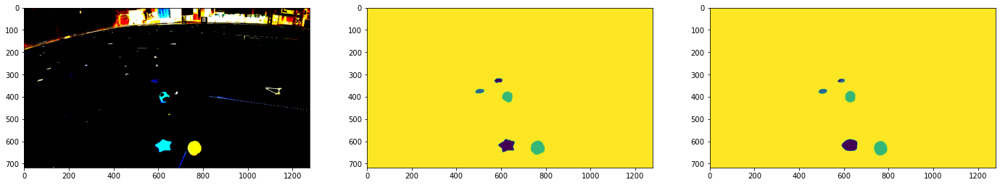

Epoch 38/50, step 20/43, loss = 0.00256


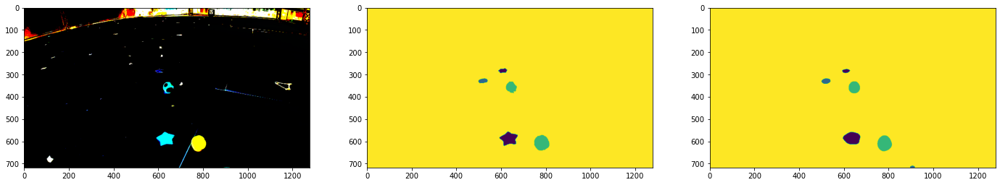

Epoch 38/50, step 25/43, loss = 0.00278


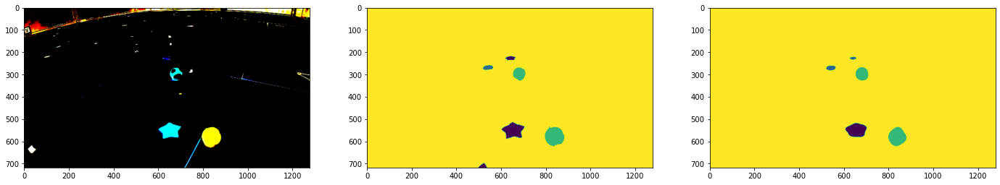

Epoch 38/50, step 30/43, loss = 0.00254


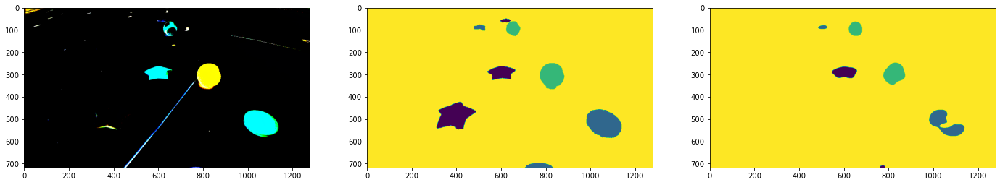

Epoch 38/50, step 35/43, loss = 0.00314


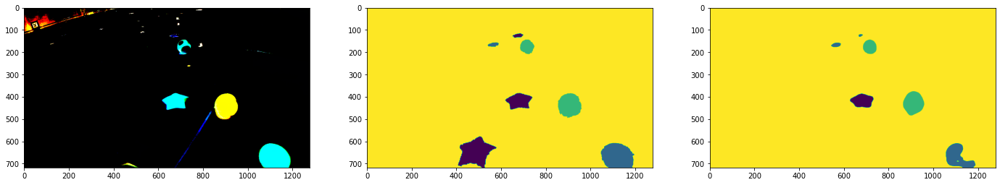

Epoch 38/50, step 40/43, loss = 0.00489


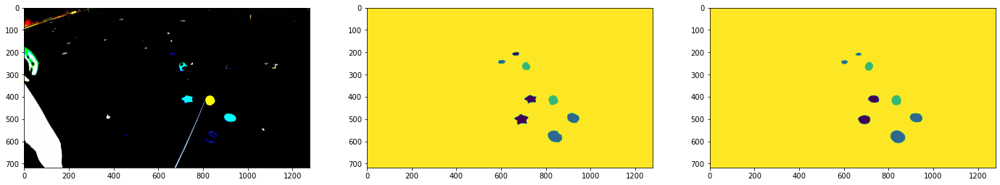

Epoch 39/50, step 5/43, loss = 0.00319


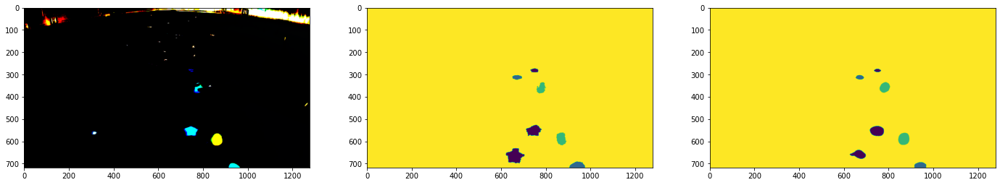

Epoch 39/50, step 10/43, loss = 0.00256


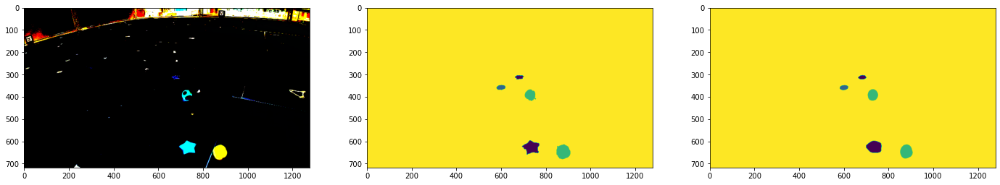

Epoch 39/50, step 15/43, loss = 0.00319


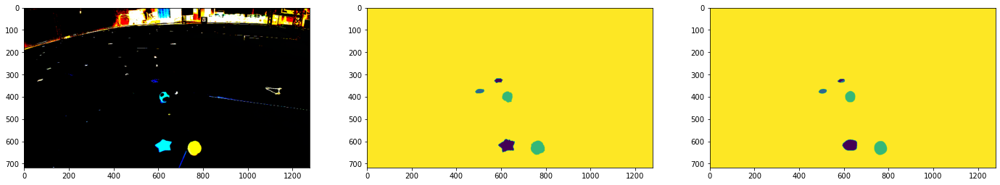

Epoch 39/50, step 20/43, loss = 0.00302


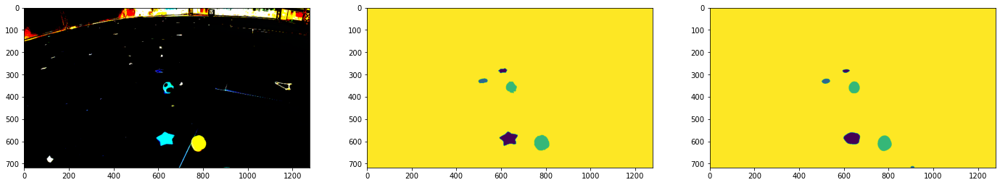

Epoch 39/50, step 25/43, loss = 0.00281


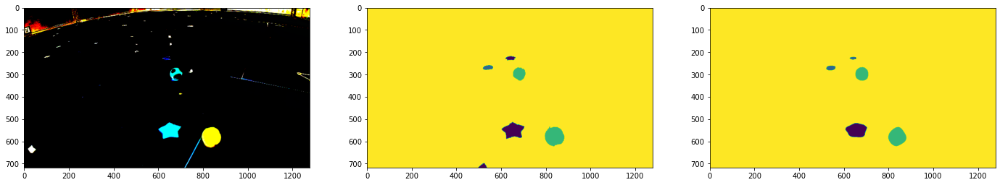

Epoch 39/50, step 30/43, loss = 0.00351


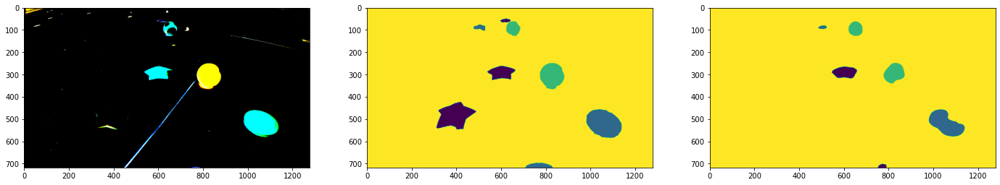

Epoch 39/50, step 35/43, loss = 0.00384


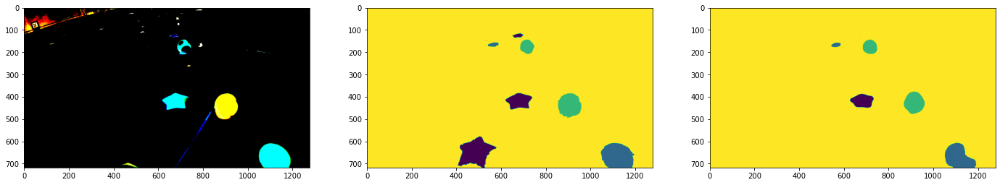

Epoch 39/50, step 40/43, loss = 0.00278


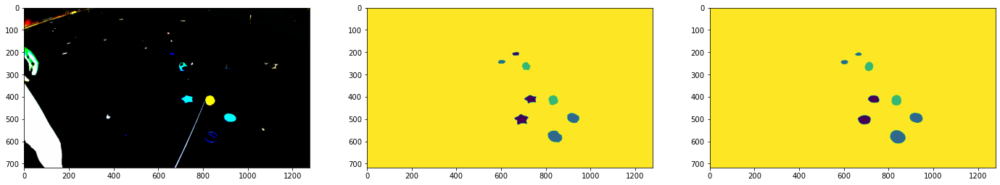

Epoch 40/50, step 5/43, loss = 0.00370


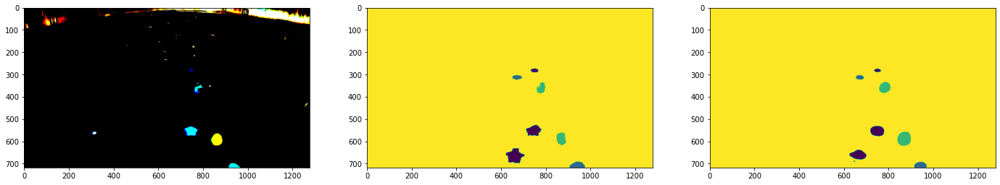

Epoch 40/50, step 10/43, loss = 0.00398


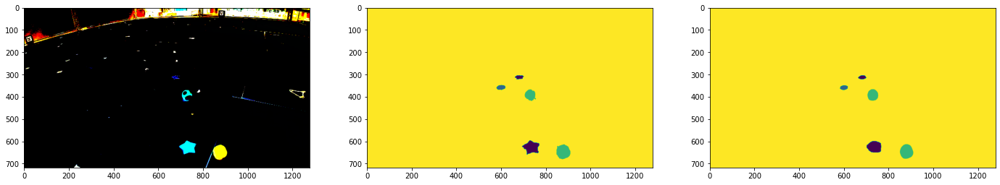

Epoch 40/50, step 15/43, loss = 0.00325


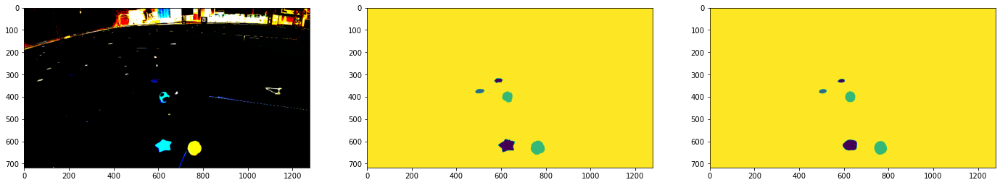

Epoch 40/50, step 20/43, loss = 0.00321


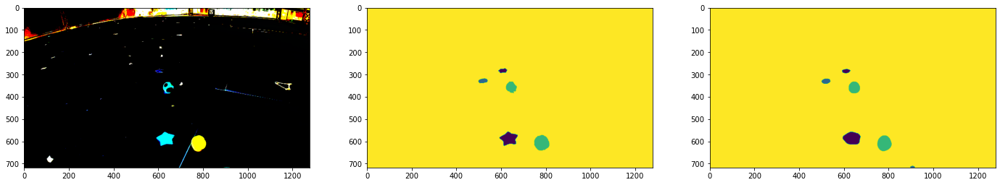

Epoch 40/50, step 25/43, loss = 0.00286


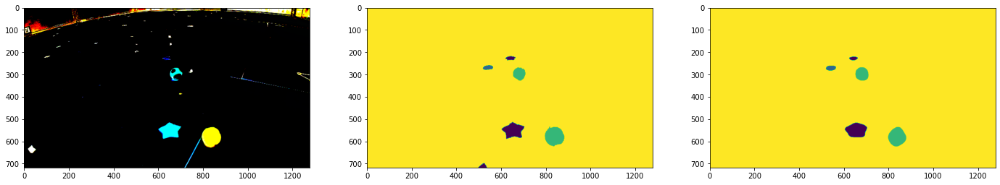

Epoch 40/50, step 30/43, loss = 0.00318


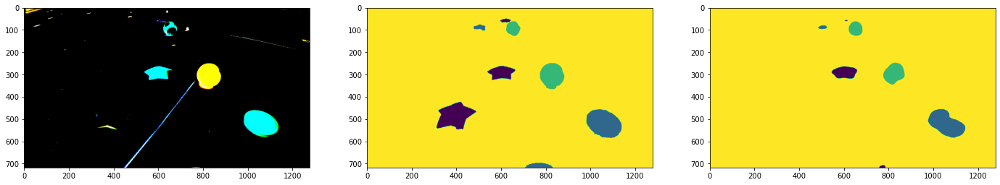

Epoch 40/50, step 35/43, loss = 0.00354


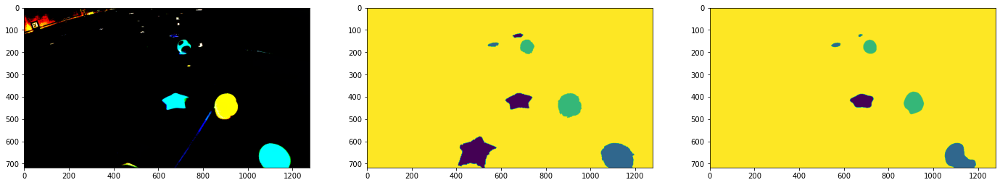

Epoch 40/50, step 40/43, loss = 0.00306


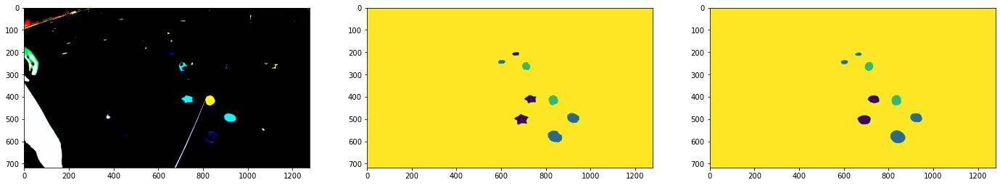

Epoch 41/50, step 5/43, loss = 0.00287


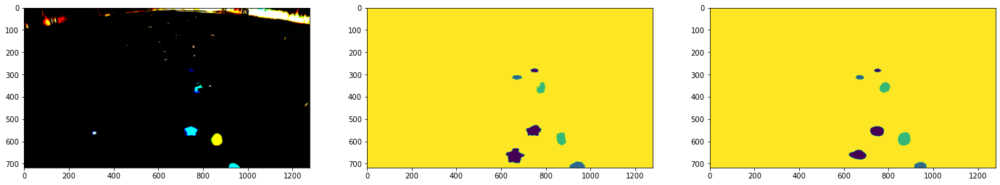

Epoch 41/50, step 10/43, loss = 0.00250


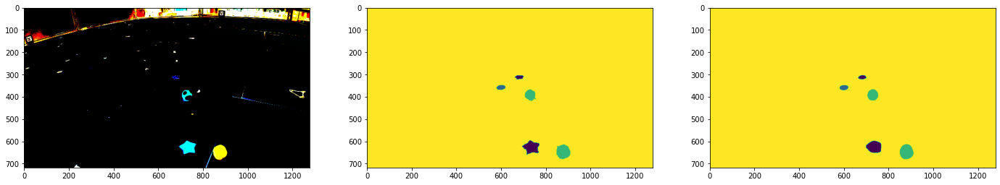

Epoch 41/50, step 15/43, loss = 0.00379


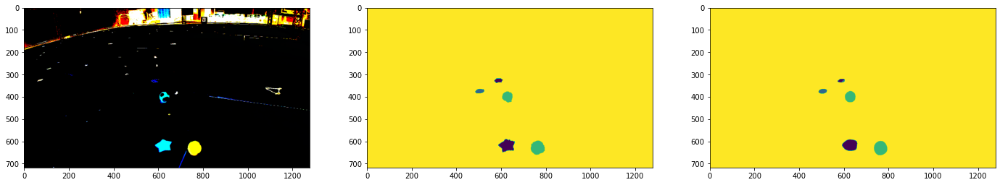

Epoch 41/50, step 20/43, loss = 0.00308


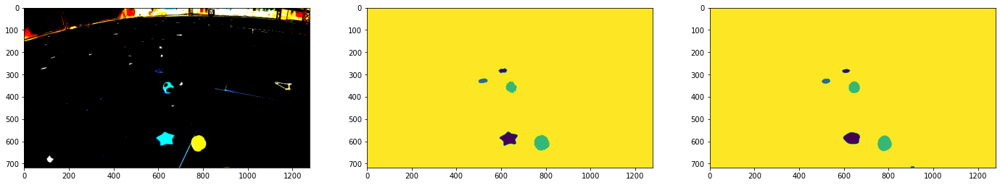

Epoch 41/50, step 25/43, loss = 0.00333


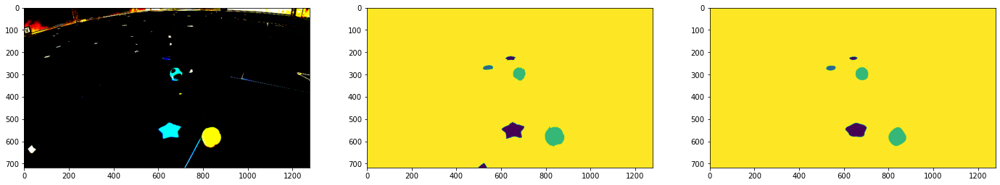

Epoch 41/50, step 30/43, loss = 0.00311


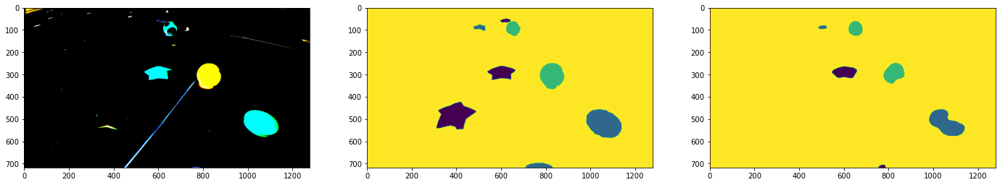

Epoch 41/50, step 35/43, loss = 0.00350


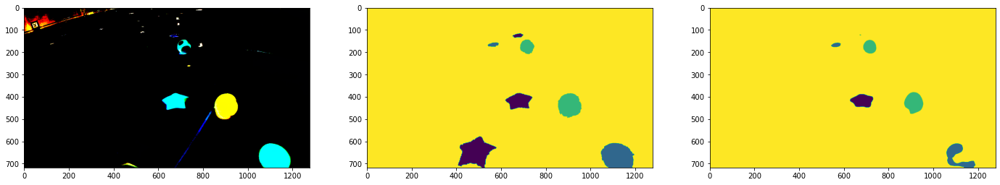

Epoch 41/50, step 40/43, loss = 0.00310


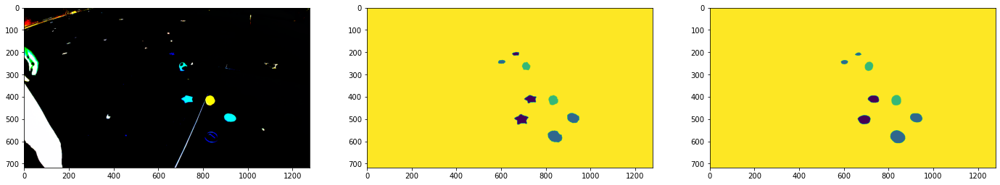

Epoch 42/50, step 5/43, loss = 0.00491


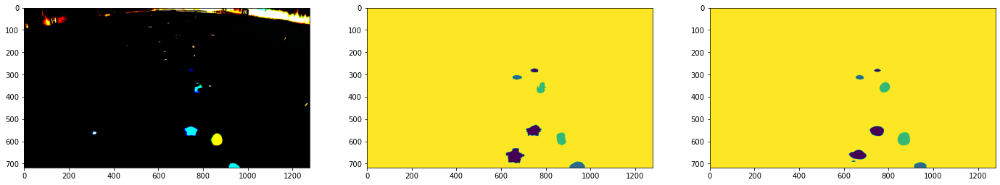

Epoch 42/50, step 10/43, loss = 0.00205


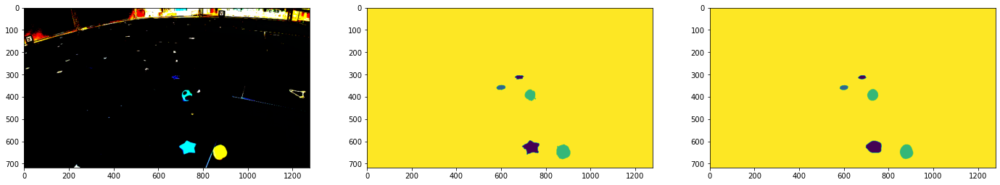

Epoch 42/50, step 15/43, loss = 0.00213


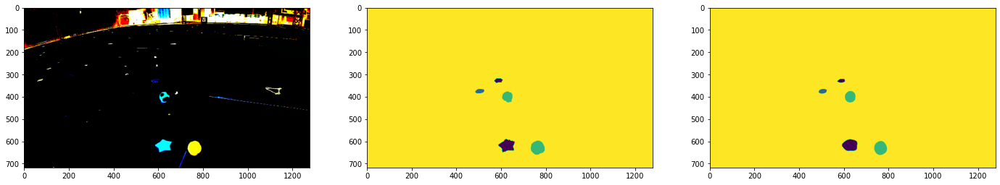

Epoch 42/50, step 20/43, loss = 0.00186


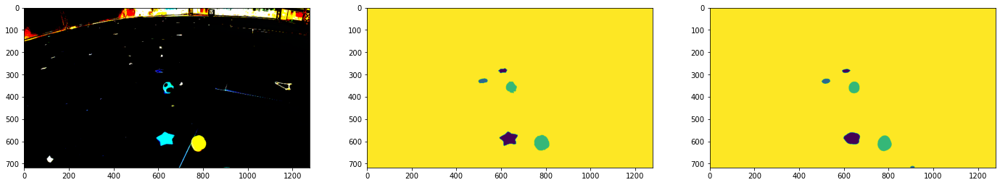

Epoch 42/50, step 25/43, loss = 0.00342


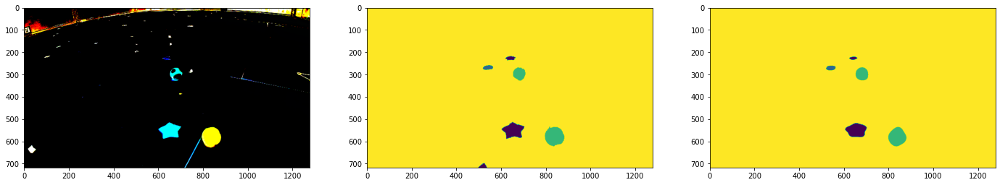

Epoch 42/50, step 30/43, loss = 0.00281


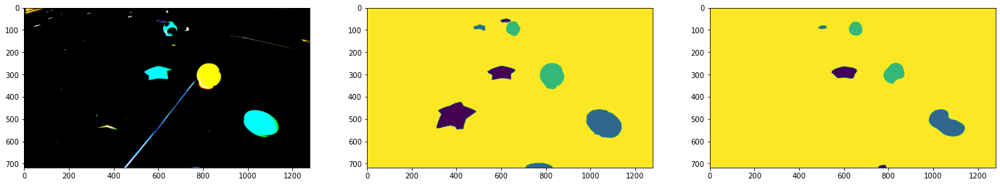

Epoch 42/50, step 35/43, loss = 0.00270


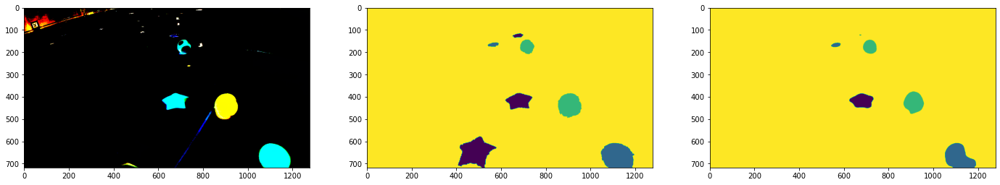

Epoch 42/50, step 40/43, loss = 0.00394


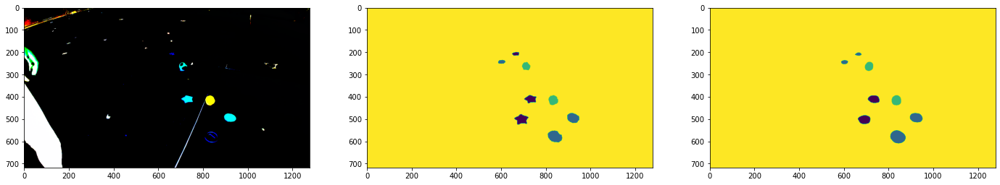

Epoch 43/50, step 5/43, loss = 0.00232


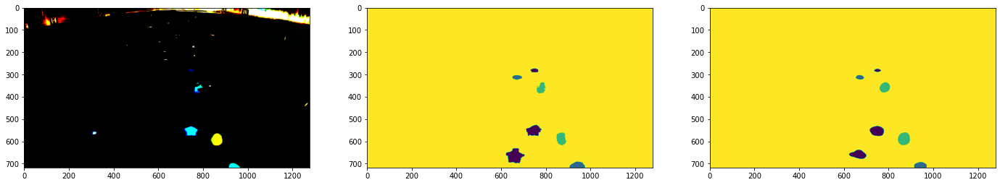

Epoch 43/50, step 10/43, loss = 0.00396


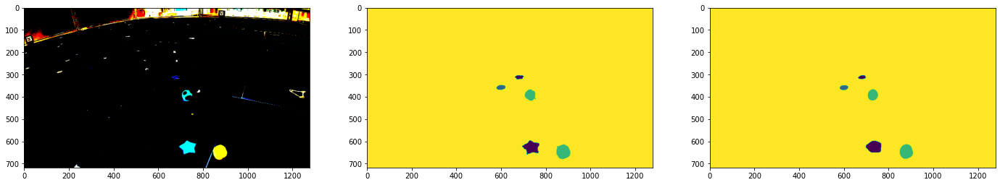

Epoch 43/50, step 15/43, loss = 0.00253


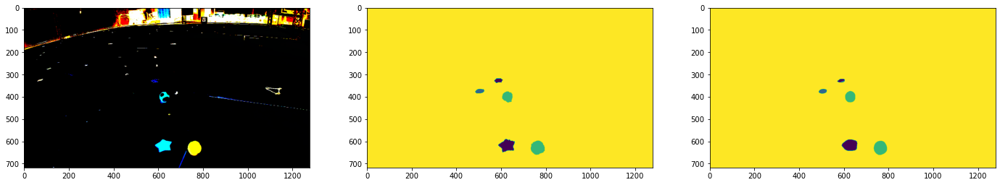

Epoch 43/50, step 20/43, loss = 0.00235


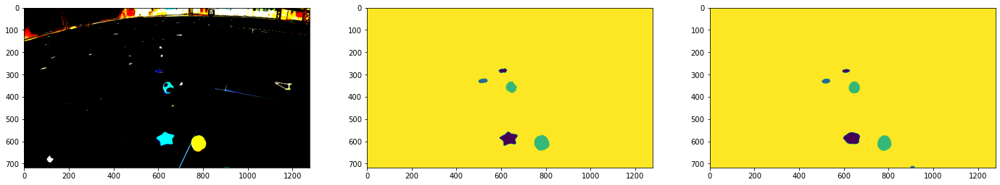

Epoch 43/50, step 25/43, loss = 0.00209


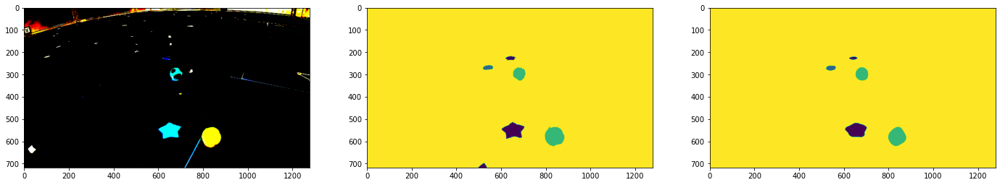

Epoch 43/50, step 30/43, loss = 0.00278


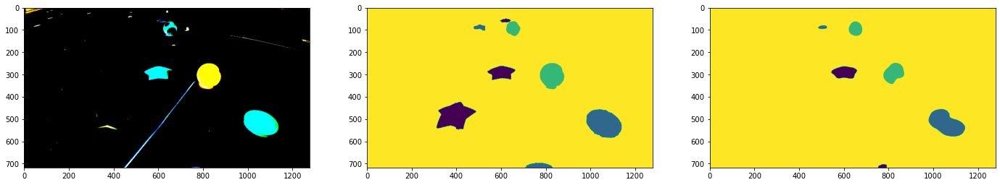

Epoch 43/50, step 35/43, loss = 0.00255


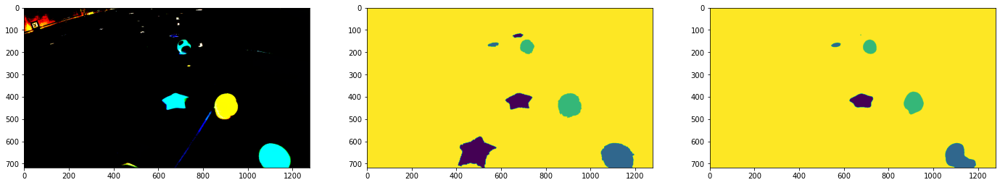

Epoch 43/50, step 40/43, loss = 0.00359


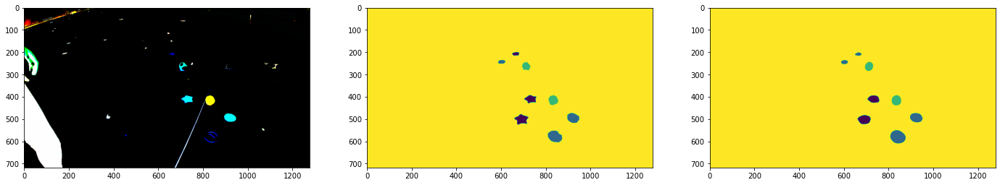

Epoch 44/50, step 5/43, loss = 0.00253


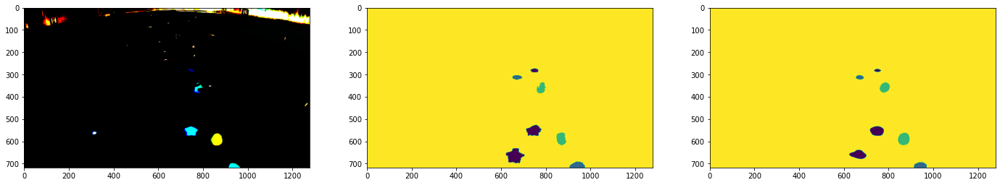

Epoch 44/50, step 10/43, loss = 0.00138


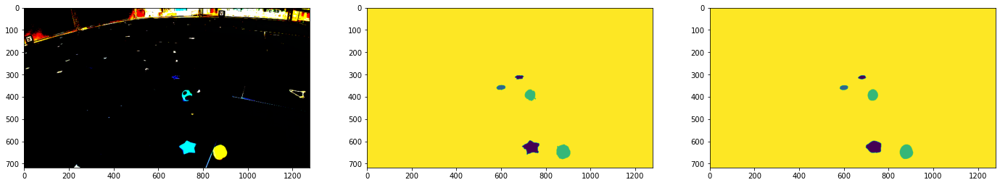

Epoch 44/50, step 15/43, loss = 0.00249


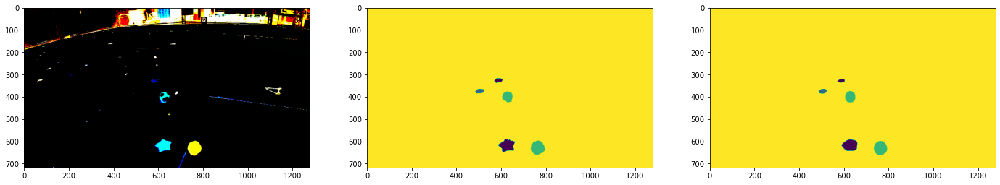

Epoch 44/50, step 20/43, loss = 0.00271


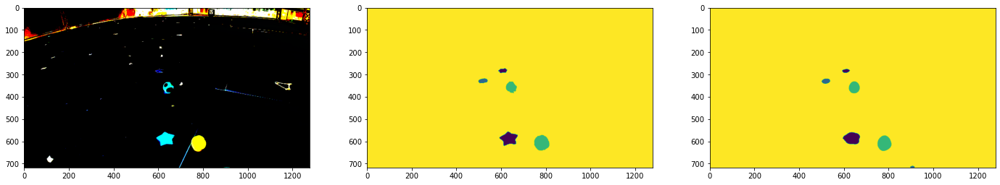

Epoch 44/50, step 25/43, loss = 0.00254


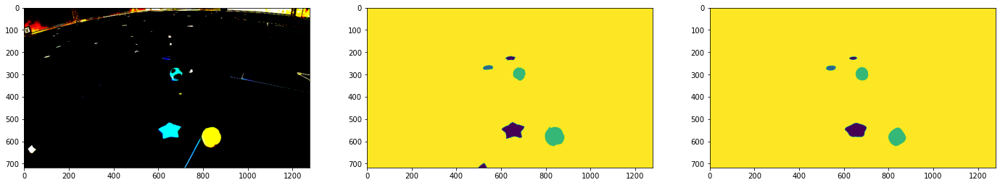

Epoch 44/50, step 30/43, loss = 0.00287


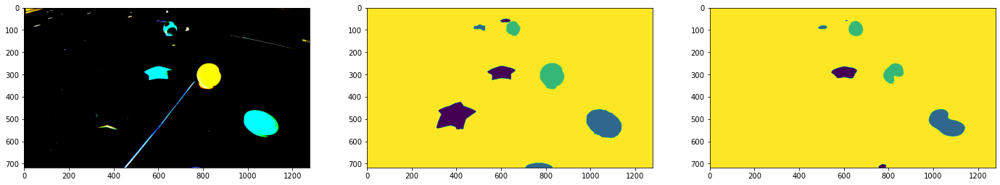

Epoch 44/50, step 35/43, loss = 0.00316


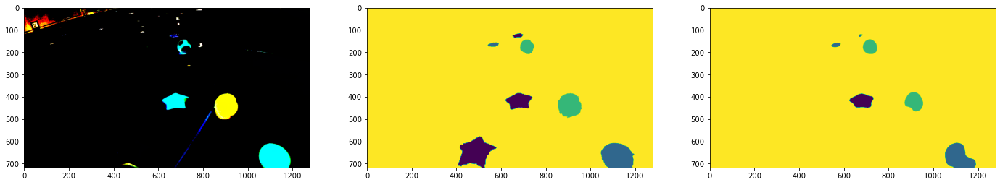

Epoch 44/50, step 40/43, loss = 0.00225


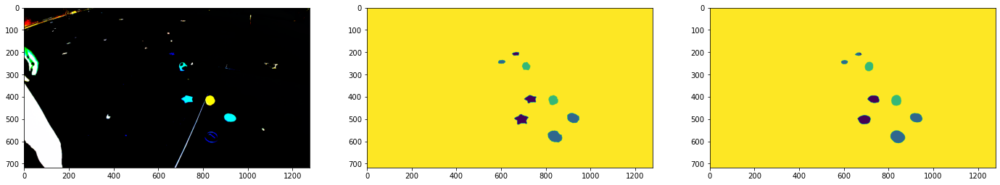

Epoch 45/50, step 5/43, loss = 0.00436


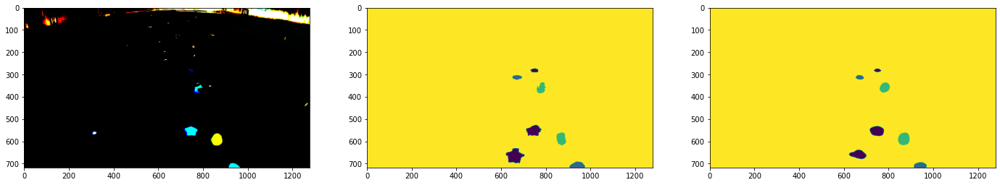

Epoch 45/50, step 10/43, loss = 0.00237


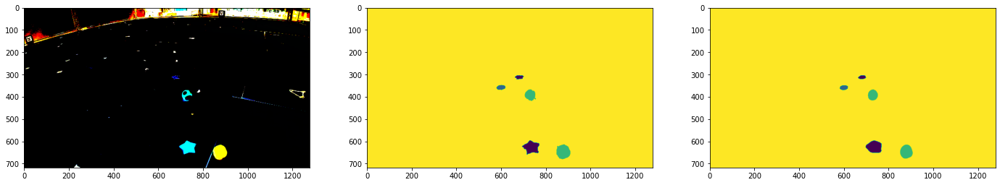

Epoch 45/50, step 15/43, loss = 0.00170


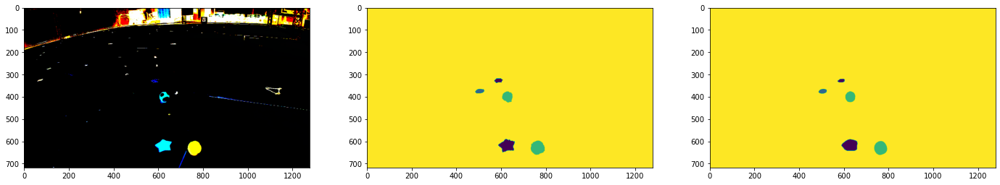

Epoch 45/50, step 20/43, loss = 0.00252


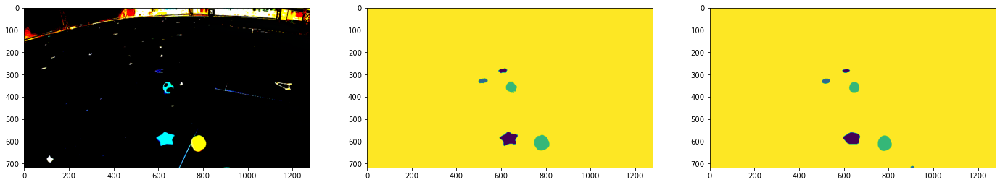

Epoch 45/50, step 25/43, loss = 0.00211


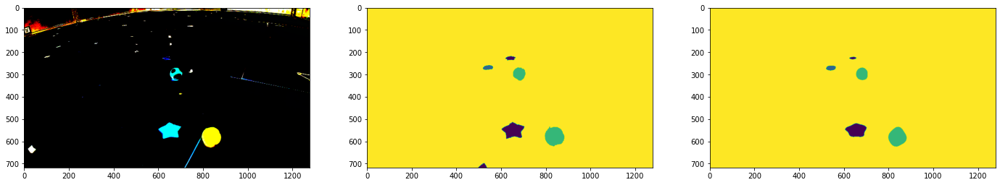

Epoch 45/50, step 30/43, loss = 0.00354


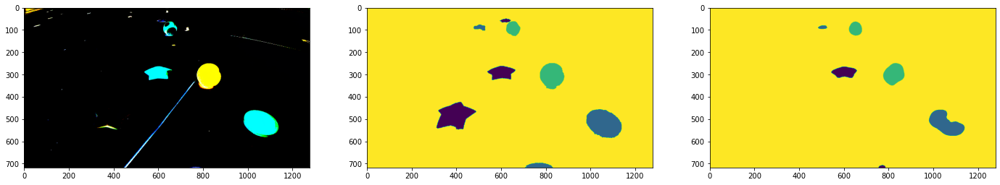

Epoch 45/50, step 35/43, loss = 0.00284


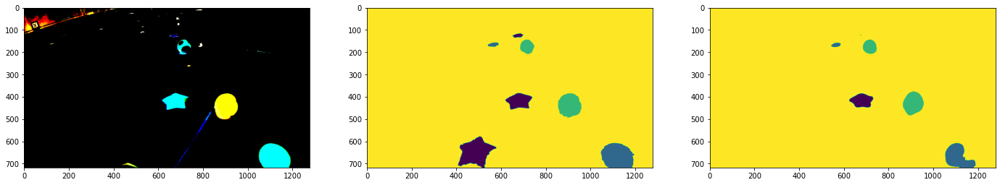

Epoch 45/50, step 40/43, loss = 0.00276


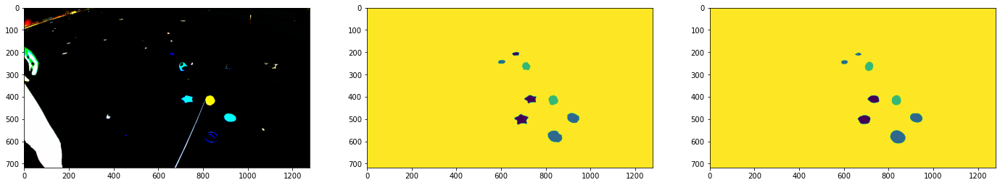

Epoch 46/50, step 5/43, loss = 0.00229


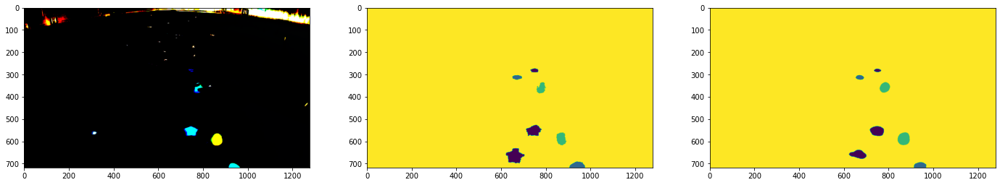

Epoch 46/50, step 10/43, loss = 0.00385


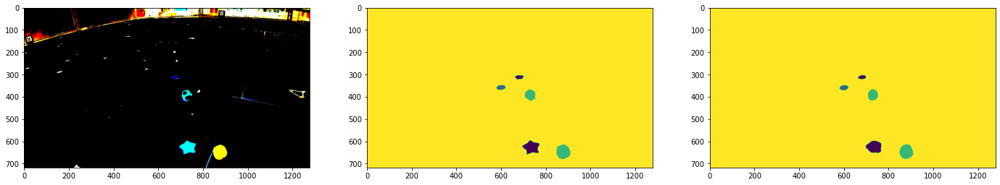

Epoch 46/50, step 15/43, loss = 0.00288


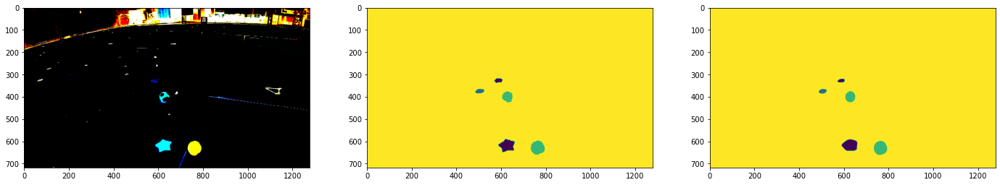

Epoch 46/50, step 20/43, loss = 0.00279


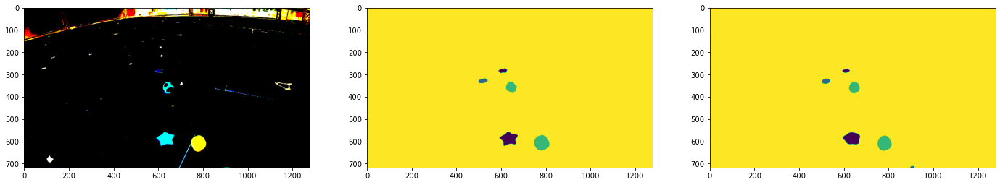

Epoch 46/50, step 25/43, loss = 0.00223


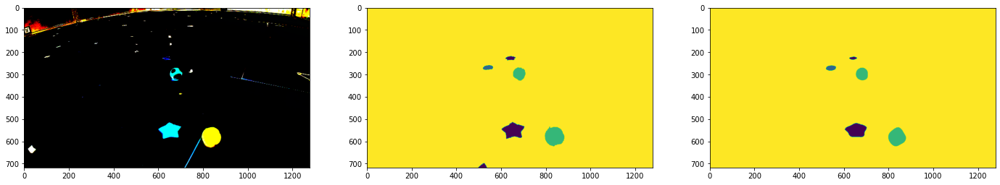

Epoch 46/50, step 30/43, loss = 0.00395


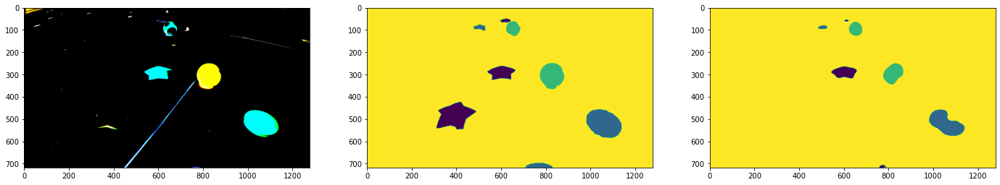

Epoch 46/50, step 35/43, loss = 0.00162


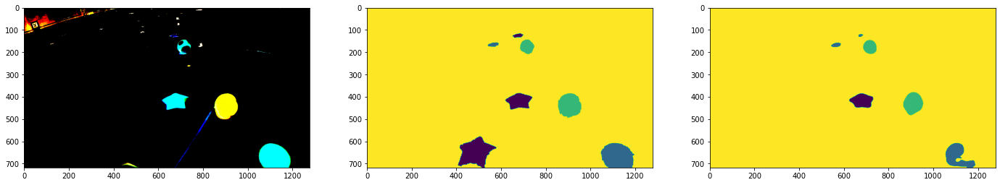

Epoch 46/50, step 40/43, loss = 0.00243


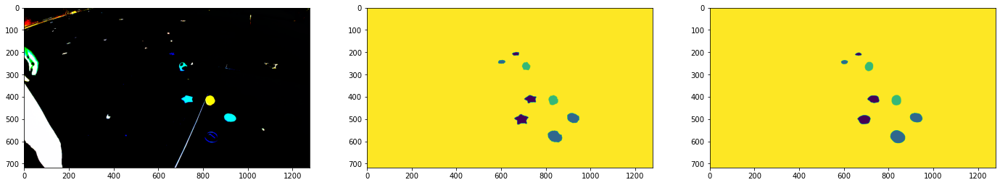

Epoch 47/50, step 5/43, loss = 0.00167


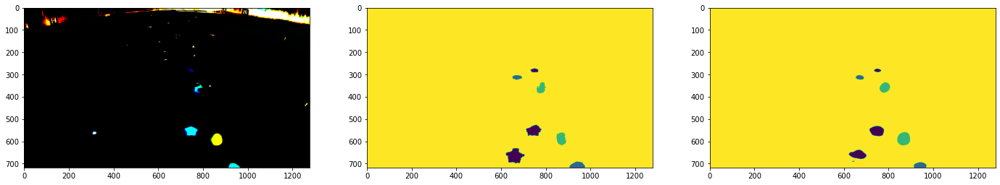

Epoch 47/50, step 10/43, loss = 0.00217


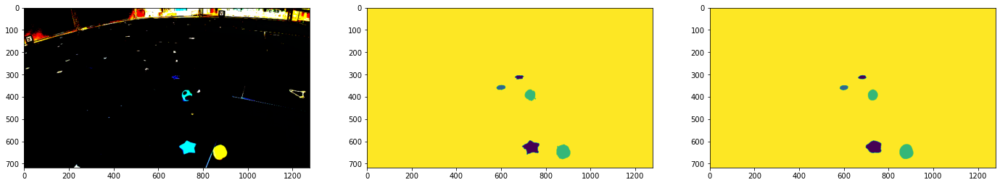

Epoch 47/50, step 15/43, loss = 0.00214


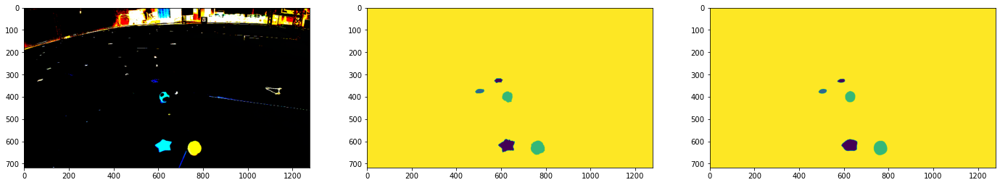

Epoch 47/50, step 20/43, loss = 0.00243


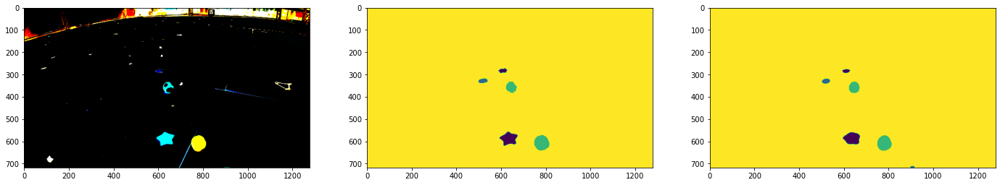

Epoch 47/50, step 25/43, loss = 0.00216


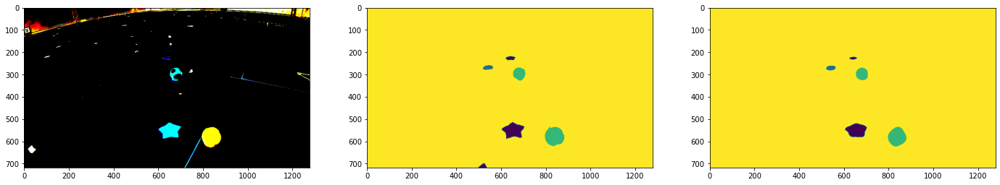

Epoch 47/50, step 30/43, loss = 0.00252


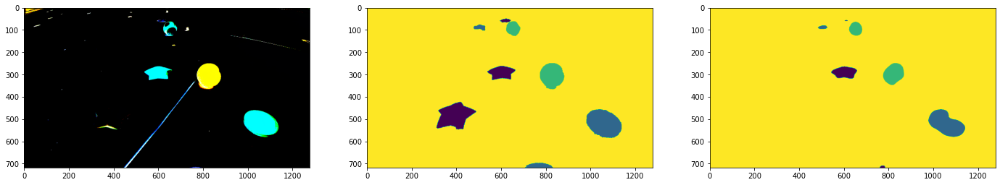

Epoch 47/50, step 35/43, loss = 0.00230


KeyboardInterrupt: 

In [5]:
'''Training'''
# Tensorboard
#writer.add_graph(model.cpu(), val_dataset[0][0])
#writer.close()

# Doing the training now

n_total_steps = len(train_loader)

steps_until_print = batch_size

# stop_training = False
# def signal_handler(sig, frame):
#     print('\nDetected Ctrl+C, stopping training')
#     stop_training = True
#     print('Saving model')
# signal.signal(signal.SIGINT, signal_handler)

model.train()
print('Starting training')
for epoch in range(num_epochs):
    #if stop_training: break

    # Check for stop - read file for boolean to stopping safely
    with open("train.json") as train_json:
        train_dict = json.load(train_json)
        if train_dict["train"] == "False": break

    testing_batches = iter(test_loader) # Every epoch tests the whole dataset once

    for i, (images, targets) in enumerate(train_loader):
            # Check for stop - read file for boolean to stopping safely
        with open("train.json") as train_json:
            train_dict = json.load(train_json)
            if train_dict["train"] == "False": break

        images = images.to(device, torch.float32)
        targets = targets.to(device)
        # print('images  shape:', images.shape)
        # print('targets shape:', targets.shape)

        # Forward pass
        outputs = model(images)['out']
        # print("outputs shape:", outputs.shape)
      
        loss = criterion(outputs, targets.long())

        # Backward pass
        optimiser.zero_grad()   # Clear old gradient values
        loss.backward()         # Calculate the gradients
        optimiser.step()        # Update the model's weights - seen at model.parameters()

        with torch.no_grad():

            # Logging the train accuracy
            pred = torch.argmax(outputs, dim=1)     # Evaluate along the 1st dimension
            batch_pixel_accuracy = (pred == targets).sum().item()/(batch_size*pred.shape[1]*pred.shape[2])
            writer.add_scalar('Accuracy/training', batch_pixel_accuracy, epoch * n_total_steps + i) # label of the scalar, actual loss mean, current global step 

            # Logging the train loss
            writer.add_scalar('Loss/training', loss.item()/steps_until_print, epoch * n_total_steps + i) # label of the scalar, actual loss mean, current global step

            # For every 5 batches, test one batch. (test:train data ratio is split 1:5)
            if (i+1) % 5 == 0:  # Logging the testing loss
                test_images, test_targets = testing_batches.next()
                
                test_images = test_images.to(device)
                test_targets = test_targets.to(device)#.squeeze(1)

                model.eval()
                test_outputs = model(test_images.float())['out']
                model.train()
                    
                test_pred = torch.argmax(test_outputs, dim=1)

                '''Plot test results'''
                fig, ax = plt.subplots(ncols=3, figsize=(24, 16))
                ax[0].imshow(test_images[0].to('cpu', torch.uint8).permute(1,2,0)) # transpose(1,2,0) changes the order of the dimensions
                ax[1].imshow(test_targets[0].to('cpu'))
                ax[2].imshow(test_pred[0].to('cpu').detach())
                plt.pause(0.01)
                '''                     '''

                # print('test_images  shape:', test_images.shape)
                # print('test_targets shape:', test_targets.shape)
                # print('test_outputs shape:', test_outputs.shape)
                # print('test_pred    shape:', test_pred.shape)

                # writer.add_images('test/images',      test_images                  , epoch * n_total_steps + i)
                # writer.add_images('test/targets',     test_targets.unsqueeze(dim=1), epoch * n_total_steps + i)
                # writer.add_images('test/predictions', test_pred.unsqueeze(dim=1)   , epoch * n_total_steps + i)

                # Logging the test accuracy
                test_batch_pixel_accuracy = (test_pred == test_targets).sum().item()/(batch_size*test_pred.shape[1]*test_pred.shape[2])
                #print('Test batch pixel accuracy', test_batch_pixel_accuracy)
                writer.add_scalar('Accuracy/testing', test_batch_pixel_accuracy, epoch * n_total_steps + i) # label of the scalar, actual loss mean, current global step 

                # Logging the test loss
                test_loss = criterion(test_outputs, test_targets.long())
                writer.add_scalar('Loss/testing', test_loss.item()/len(test_targets), epoch * n_total_steps + i) # label of the scalar, actual loss mean, current global step

                #writer.add_scalars("Accuracy", {"train": batch_pixel_accuracy, "test": test_batch_pixel_accuracy}, epoch * n_total_steps + i)

                print(f'Epoch {epoch+1}/{num_epochs}, step {i+1}/{n_total_steps}, loss = {loss.item():.5f}')
                

    #print(f'Epoch {epoch+1}/{num_epochs}, step {i+1}/{n_total_steps}, loss = {loss.item():.5f}')

print("Training is done")
# Void = 0
# Star = 1
# Coin = 2
# Mushroom = 3
# Background = 4

In [8]:
'''Saving the model''';
# checkpoint = {
#     "epoch": epoch,
#     "model_state": model.state_dict(),
#     "optimiser_state": optimiser.state_dict()
# }
# torch.save(checkpoint, "checkpoint_resnet50_50epoch_0.989p_AMR.pth")

In [ ]:
'''Plotting''';
# with torch.no_grad():
#     iterator = iter(test_loader)
#     images, targets = next(iterator)
#     images = images.to(device)

#     model.eval().to(device)
#     output = model(images.to(device))['out']
#     pred = torch.argmax(output, dim=1)

#     images = images.to('cpu')
#     targets = targets.to('cpu')
#     output = output.to('cpu')
#     pred = pred.to('cpu')
#     print('image: ', images.shape)
#     print('target:', targets.shape)
#     print('output:', output.shape)
#     print('pred:  ', pred.shape)
#     fig, ax = plt.subplots(ncols=3, figsize=(24, 16))
#     ax[0].imshow(images[1].squeeze().permute(1,2,0))  # .squeeze() does the same thing as .numpy().transpose(1,2,0) 
#     ax[1].imshow(targets[1].squeeze()) # .squeeze() does the same thing as .numpy().transpose(1,2,0) 
#     ax[2].imshow(pred[1].squeeze())

print('Hi')

In [6]:
#file_list_depth = sorted(glob.glob('AirSimDataset4/img_rgbd_camera_1_*.png'))
#dataset_images  = np.array([np.array(Image.open(filename)) for filename in file_list_images])


array([[5.2695312, 5.2695312, 5.2695312, ..., 7.4101562, 7.3984375,
        7.390625 ],
       [5.2929688, 5.2929688, 5.2929688, ..., 7.4257812, 7.4179688,
        7.4140625],
       [5.9453125, 5.9453125, 5.3320312, ..., 7.4492188, 7.4453125,
        7.4453125],
       ...,
       [1.1044922, 1.1044922, 1.1044922, ..., 1.0625   , 1.0625   ,
        1.0625   ],
       [1.0996094, 1.0996094, 1.0996094, ..., 1.0585938, 1.0585938,
        1.0585938],
       [1.0947266, 1.0947266, 1.0947266, ..., 1.0537109, 1.0537109,
        1.0537109]], dtype=float32)

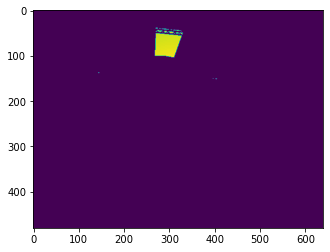

In [7]:
images_and_depths = zip(file_list_images, file_list_depths)


In [8]:
images.shape

NameError: name 'images' is not defined

(array([[480.,   0.,   0., ...,   0.,   0.,   0.],
        [480.,   0.,   0., ...,   0.,   0.,   0.],
        [480.,   0.,   0., ...,   0.,   0.,   0.],
        ...,
        [480.,   0.,   0., ...,   0.,   0.,   0.],
        [480.,   0.,   0., ...,   0.,   0.,   0.],
        [480.,   0.,   0., ...,   0.,   0.,   0.]]),
 array([1.20996094e+00, 1.71468896e+03, 3.42816797e+03, 5.14164697e+03,
        6.85512598e+03, 8.56860547e+03, 1.02820840e+04, 1.19955625e+04,
        1.37090420e+04, 1.54225215e+04, 1.71360000e+04], dtype=float32),
 <a list of 640 BarContainer objects>)

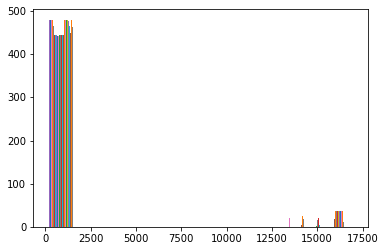

In [16]:
plt.hist(dataset_depths[70])